# Машинное обучение, ВМК МГУ

# Практическое задание 2. Методы оптимизации в машинном обучении

## Общая информация
Дата выдачи: 14.03.2023

Мягкий дедлайн: 28.03.2023 23:59 MSK

Жёсткий дедлайн: 04.04.2023 23:59 MSK

## Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). **Максимальная оценка за работу  — 10 баллов + 9.2 бонусов.**

Сдавать задание после указанного жёсткого срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-optimization-Username.ipynb

<p style="color:#de3815;font-size:25px;">
Напоминание об оформлении и выполнении ноутбука
</p>

* Все строчки должны быть выполнены. Нужно, чтобы output команды можно было увидеть, не запуская ячейки (кроме редких случаев, когда необходимо намеренно скрыть ненужный output, про такие случаи желательно писать пояснения в тексте). **В противном случае -1 балл**
* При оформлении ДЗ нужно пользоваться данным файлом в качестве шаблона. Не нужно удалять и видоизменять написанный код и текст, если явно не указана такая возможность. **В противном случае -1 балл**
* В anytask обязательно нужно прикреплять отдельно файл с расширением ipynb (не в архиве, а именно отдельно). Если необходимо отправить еще какие-то файлы, то вынесите их в отдельный архив (если файлов много) и пришлите. **В противном случае -0.5 балла**
---
* Пишите, пожалуйста, выводы и ответы на вопросы в текстовых ячейках/при помощи print в коде. При их отсутствии мы не можем понять, сделали ли вы задание и понимаете, что происходит, и **поэтому будем снижать баллы**
* Если алгоритм не сказано реализовывать явно, его всегда можно импортировать из библиотеки.
---
* Про графики. _Штрафы будут применяться к каждому результату команды отображения графика (plt.show() и др. аналогичные). Исключением являются графики, генерируемые функциями каких-либо сторонних библиотек, если их нельзя кастомизировать_

    * должно быть название (plt.title) графика; **В противном случае &ndash; -0.05 балла**
    * на графиках должны быть подписаны оси (plt.xlabel, plt.ylabel); **В противном случае &ndash; -0.025 балла за каждую ось**
    * должны быть подписаны единицы измерения (если это возможно); **В противном случае &ndash; -0.025 балла за каждую ось**
    * все названия должны быть понятны любому человеку, знакомому с терминологией, без заглядывания в код; **В противном случае &ndash; -0.05 балла**
    * подписи тиков на осях не должны сливаться как на одной оси, так и между ними; **В противном случае &ndash; -0.025 балла за каждую ось**
    * если изображено несколько сущностей на одном холсте (например несколько функций), то необходима поясняющая легенда (plt.legend); **В противном случае &ndash; -0.05 балла**
    * все линии на графиках должны быть чётко видны (нет похожих цветов или цветов, сливающихся с фоном); **В противном случае &ndash; -0.05 балла**
    * если отображена величина, имеющая очевидный диапазон значений (например, проценты могут быть от 0 до 100), то желательно масштабировать ось на весь диапазон значений (исключением является случай, когда вам необходимо показать малое отличие, которое незаметно в таких масштабах);
    * графики должны быть не супер-микро и не супер-макро по размерам, так, чтобы можно было увидеть все, что нужно.
    * при необходимости улучшения наглядности графиков, можно пользоваться логарифмической шкалой по осям x/y.
    
    
### А также..

* Для удобства поиска вопросов, на которые от вас просят ответа, мы пометили их знаком **(?)**
* Знак **(!)** означает, что выполнение замечания необходимо для **возможности получения полного балла**
* Даем до +0.3 балла за выдающиеся успехи по субъективному мнению проверяющих. Этот **бонус** не апеллируется

### Часть 1. (1.5 балла) Негладкая оптимизация

В этом разделе мы рассмотрим задачу Lasso регрессии и сравним рассказанные на парах методы: субградиентный метод, ISTA и FISTA. Напомним, что задача выглядит следующим образом:

$$
\min_x \frac{1}{2}\|Ax - y \|^2_2 + \gamma \|x\|_1
$$

Для автоматического вычисления градиентов предлагается использовать jax, вы можете считать их руками или через torch, но мы считаем, что знать о существовании этой библиотеки полезно, тем более, что для выполнения задания достаточно знать информации с [этой страницы](https://jax.readthedocs.io/en/latest/notebooks/quickstart.html).

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import cv2
import tqdm
import jax.numpy as jnp
from jax import grad, jit, vmap
import sklearn.preprocessing as skprep

In [37]:
%config InlineBackend.figure_formats = ['svg']
sns.set_style('darkgrid')

Для сравнения методов сгенерируем данные:

In [38]:
m = 500
n = 2500
np.random.seed(1)
A = np.random.rand(m, n) # матрица
A = skprep.normalize(A, norm="l2", axis=0)
U, S, Vh = np.linalg.svd(A, full_matrices=False)
S[-1] = min(S[-1], S[0] / 100000)
A = U @ (S[:, None] * Vh)
x_true = np.random.randn(n) # решение
x_true[np.random.rand(n) < 0.96] = 0
v = 9e-2 * np.random.randn(m)
y = A.dot(x_true) + v # таргет
gamma = 0.01 * np.linalg.norm(A.T.dot(y), ord=np.inf) # предлагаемый коэффициент регуляризации
x0 = np.random.rand(n) # начальное приближение

Давайте посмотри на степень разреженности решения

In [39]:
print(f"Number of nonzeros in x_true is {np.sum(x_true != 0)} out of {x_true.shape[0]}")

Number of nonzeros in x_true is 84 out of 2500


**Задание 1. (0.15 баллов)** реализуйте оракул для Lasso регрессии с использованием jax, также реализуйте отдельно оракул для части с регрессией и для регуляризации, а также их градиентов. Для регуляризации добавьте метод prox, который вычисляет проксимальный оператор в заданной точке.

*Замечание*. Вы можете менять интерфейсы классов так, как считаете нужным, предложенный вариант - один из возможных. Главное, чтобы все работало

In [40]:
class LassoRegressionOracle:
    '''
    Class for whole Lasso regression oracle
    '''
    def __init__(self, A, y, gamma):
        self.A = A
        self.y = y
        self.gamma = gamma

    def __call__(self, x):
        norm = jnp.linalg.norm(jnp.dot(self.A, x) - self.y) ** 2 / 2
        reg = self.gamma * jnp.linalg.norm(x, ord=1)
        return norm + reg

    def grad(self, x):
        return grad(self.__call__, argnums=0)(x)

In [41]:
class BasicRegressionOracle:
    '''
    Class for regression part of lasso regression
    '''
    def __init__(self, A, y):
        self.A = A
        self.y = y

    def __call__(self, x):
        return jnp.linalg.norm(jnp.dot(self.A, x) - self.y) ** 2 / 2

    def grad(self, x):
        return grad(self.__call__, argnums=0)(x)

In [42]:
class L1RegularizationOracle:
    '''
    Class for regularization part of lasso regression
    '''
    def __init__(self, gamma):
        self.gamma = gamma

    def __call__(self, x):
        return self.gamma * jnp.linalg.norm(x, ord=1)

    def subgrad(self, x):
        return self.gamma * grad(self.__call__, argnums=0)(x)

    def prox(self, x, alpha):
        maxer = jnp.maximum(x - self.gamma / alpha, 0)
        miner = jnp.minimum(x + self.gamma / alpha, 0)

        return maxer + miner

Выведите значения функционалов в точке x0:

In [8]:
full_oracle = LassoRegressionOracle(A, y, gamma)
regression_oracle = BasicRegressionOracle(A, y)
regularization_oracle = L1RegularizationOracle(gamma)


assert np.allclose(full_oracle(x0), 581375.6875)
assert np.allclose(regression_oracle(x0), 581222.1875)
assert np.allclose(regularization_oracle(x0), 153.4744415283203)

Platform 'METAL' is experimental and not all JAX functionality may be correctly supported!


Metal device set to: Apple M1 Max

systemMemory: 32.00 GB
maxCacheSize: 10.67 GB



2024-04-03 11:34:51.059733: W pjrt_plugin/src/mps_client.cc:563] WARNING: JAX Apple GPU support is experimental and not all JAX functionality is correctly supported!


**Задание 2 (0.65 баллов)**. Реализуйте субградиентный метод, ISTA и FISTA.

1) Для субградиентного метода возьмите шаг $\alpha_k=\frac{1}{\sqrt{k + 1} \|g_k\|_2}$, где $g_k$ - текущий субградиент. Он является одним из самых популярных выборов для рассматриваемого метода. Обратите внимание, что для субградиентного метода результатом является не последняя точка, а точка, в которой наблюдалось минимальное значение функционала

2) Для ISTA/FISTA выберете константный шаг

3) Параметр, отвечающий за ускорение, возьмите равным $\frac{k}{k+3}$

*Замечание*. Вы можете менять интерфейсы функций так, как считаете нужным, предложенный вариант - один из возможных. Главное, чтобы все работало

In [51]:
def subgradient_method(oracle, max_iters, x0, verbose = False):
    """
    Функция, реализующая субградиентный метод
    :oracle - оракул
    :max_iters - максимальное количество итераций
    :x0 - начальная точка

    Функция возвращает историю (наименьшее значение функции по итерациям) и итоговую точку
    """
    history = []
    x_result = x0.copy()

    min_val = oracle(x0)
    subgrad = oracle.grad(x0)
    history.append(min_val)

    x = x0.copy()

    iterations = tqdm.tqdm(range(max_iters)) if  verbose else range(max_iters)

    for k in iterations:
        alpha = 1 / (jnp.sqrt(k + 1) * jnp.linalg.norm(subgrad))
        x = x - alpha * subgrad
        val = oracle(x)
        subgrad = oracle.grad(x0)

        if val < min_val:
            min_val = val
            x_result = x.copy()

        history.append(val)

    return history, min_val, x_result

In [52]:
def ISTA(full_oracle, regression_oracle, regularization_oracle, max_iters, x0, step_size, verbose = False):
    """
    Функция, реализующая проксимальный градиентный метод, в данном случае это будет ISTA
    :full_oracle - полный оракул
    :regression_oracle - оракул, содержащий регрессионную часть
    :regularization_oracle - оракул, содержащий регуляризационную
    :max_iters - максимальное количество итераций
    :x0 - начальная точка
    :step_size - размер шага

    Функция возвращает историю (значение функции в полученных в процессе итераций точках) и итоговую точку
    """
    history = []
    x_result = x0.copy()

    min_val = full_oracle(x0)
    history.append(min_val)

    x = x0.copy()

    iterations = tqdm.tqdm(range(max_iters)) if  verbose else range(max_iters)

    for _ in iterations:
        x_temp = x - step_size * regression_oracle.grad(x)
        x = regularization_oracle.prox(x_temp, 1 / step_size)
        val = full_oracle(x)

        if val < min_val:
            min_val = val
            x_result = x.copy()

        history.append(val)

    return history, min_val, x_result

In [53]:
def FISTA(full_oracle, regression_oracle, regularization_oracle, max_iters, x0, step_size, verbose = False):
    """
    Функция, реализующая ускоренный проксимальный градиентный метод, в данном случае это будет FISTA
    :full_oracle - полный оракул
    :regression_oracle - оракул, содержащий регрессионную часть
    :regularization_oracle - оракул, содержащий регуляризационную
    :max_iters - максимальное количество итераций
    :x0 - начальная точка
    :step_size - размер шага

    Функция возвращает историю (значение функции в полученных в процессе итераций точках) и итоговую точку
    """
    history = []
    x = x0.copy()
    u = x0.copy()

    min_val = full_oracle(x0)
    x_result = x0.copy()
    history.append(min_val)

    iterations = tqdm.tqdm(range(max_iters)) if  verbose else range(max_iters)

    for k in iterations:
        mu = k / (k + 3)

        prox_arg = u - step_size * regression_oracle.grad(u)
        x_temp = regularization_oracle.prox(prox_arg, 1/ step_size)
        u = (1 + mu) * x_temp - mu * x
        x = x_temp

        val = full_oracle(u)
        if val < min_val:
            min_val = val
            x_result = u.copy()

        history.append(val)

    return history, min_val, x_result

**Задание 3. (0.3 баллов)** Посмотрите на скорость сходимости (используйте логарифмическую шкалу) ISTA и FISTA при разных размерах шага. Выберите лучший, сделайте выводы. Рассмотрите не менее 5 размеров шагов в диапозоне $10^{-5}...10^{-3}$. Если метод расходится при заданном выборе шага, то не рисуйте этот шаг на графике

Возможно, это будет не лучший выбор шага, поэтому можете посмотреть и другие диапозоны.

In [13]:
learning_rate = jnp.logspace(-6, -3.2, 10)
N = 1000

full_oracle = LassoRegressionOracle(A, y, gamma)
regression_oracle = BasicRegressionOracle(A, y)
regularization_oracle = L1RegularizationOracle(gamma)

ista_hist  = []
fista_hist = []

for lr in tqdm.tqdm(learning_rate):
    hist, min_val, x_result = ISTA(full_oracle, regression_oracle, regularization_oracle, N, x0, lr)
    ista_hist.append(hist)

    hist, min_val, x_result = FISTA(full_oracle, regression_oracle, regularization_oracle, N, x0, lr)
    fista_hist.append(hist)

100%|██████████| 10/10 [03:31<00:00, 21.19s/it]


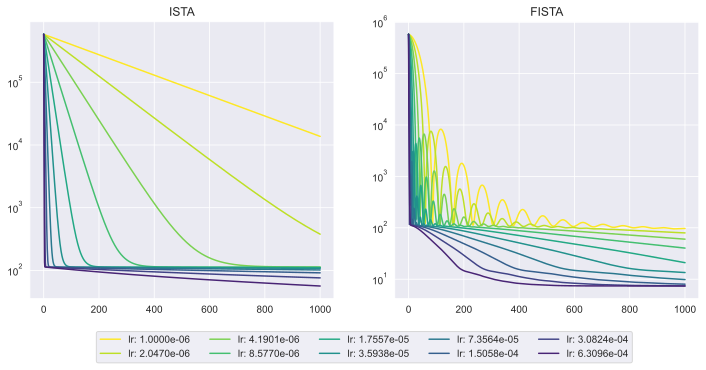

In [14]:
fig, axis = plt.subplots(1, 2)
fig.set_figwidth(12)
fig.set_figheight(5)

axis[0].set_title('ISTA')
axis[1].set_title('FISTA')
axis[0].set_yscale('log')
axis[1].set_yscale('log')

cmap = plt.get_cmap('viridis')
axis[0].set_prop_cycle(color=[cmap(1 - 1.*(i)/10) for i in range(10)])
axis[1].set_prop_cycle(color=[cmap(1 - 1.*(i)/10) for i in range(10)])

init_score = full_oracle(x0)

for lr, hist_ista, hist_fista in zip(learning_rate, ista_hist, fista_hist):
    if hist_ista[-1] < init_score:
        axis[0].plot(range(N + 1), hist_ista, label=f'lr: {lr:.4e}')
        axis[0].xlabel

    if hist_fista[-1] < init_score:
        axis[1].plot(range(N + 1), hist_fista, label=f'lr: {lr:.4e}')

plt.legend(loc='lower center', ncol=5, bbox_to_anchor=(-0.1, -0.25))

In [15]:
# get best values
ista_data  = jnp.array(ista_hist)
fista_data = jnp.array(fista_hist)

# we do not use history of worst algorithm
mins_ista = jnp.mean(ista_data[1:].min(axis=1))
mins_fista = jnp.mean(fista_data.min(axis=1))

print('best ista:     ', ista_data.min(), '\t best fista:     ', fista_data.min())
print('mean best ista:', mins_ista,       '\t mean best fista:', mins_fista)

best ista:      56.32922 	 best fista:      7.364711
mean best ista: 127.370255 	 mean best fista: 34.228485


**Выводы:**

Первое, что мы видим, это способность метода FISTA добиваться лучших результатов: в то время как за 1000 итераций ISTA смог лишь добиться показателя  loss в 56.3 к концу обучения, FISTA имела такие показатели уже на 100-150 итерациях. В данном ключе нужно уточнить, что сама по себе FISTA показывает относительно большую зависимость от выбора шага, так как при плохом выборе FISTA резко теряет свои спосбности эффективно решать задачу (разумеется иммеется в виду относительно самого оптимального и лучшего решения). ISTA же более мягка в этом плане, и большинство решений одинаково "плохо" решают задачу. Тем не менее в обоих методах есть 6.3e-4 явялется оптимальным шагом, после которого алгоритмы резко теряют умение решать задачи и начинают рассходиться либо просто не сходиться к минимуму. 

Для FISTA свойственна неустойчвость траекторий при неправильном выборе шага (наблюдается асциляция). ISTA же такого лишена полностью, сходясь медленно но "уверенно", устойчиво. 

<!-- Мы видим, что метод FISTA сходится быстрее, при чем данное поведение наблюдается при любом выборе шага. Уже за первые несколько шагов каждый алгоритм FISTA подошел к минимуму функции и там же остался. При этом при любом выборе шага FISTA выдает результатом оптимизации одно и то же число, что получился бы при подборе наилучшего шага. Для алгоритма ISTA этого нет и там разница между средним ответом и наилучшим заметна. В свою очередь ISTA показала не только свою зависимость от подбора оптимального шага, но и показала худшие результаты в целом, получив минимум функционала в 105.8, когда FISTA смогла получить 97.9 -->

**Задание 4. (0.4 баллов)** Сравните три метода оптимизации по скорости сходимости, а также по степени разреженности решения (считайте, что число равно нулю, если оно по модулю не превосходит $10^{-2}$. Сделайте выводы

In [12]:
full_oracle = LassoRegressionOracle(A, y, gamma)
regression_oracle = BasicRegressionOracle(A, y)
regularization_oracle = L1RegularizationOracle(gamma)

hist_subg, min_val_subg, x_result_subg  = subgradient_method(full_oracle, 5000, x0)
hist_ista, min_val_ista, x_result_ista  = ISTA(full_oracle, regression_oracle, regularization_oracle, 5000, x0, 6.3e-4)
hist_fista, min_val_fista, x_result_fista = FISTA(full_oracle, regression_oracle, regularization_oracle, 5000, x0, 6.3e-4)

argmin_subg = jnp.argmin(jnp.array(hist_subg))
argmin_ista = jnp.argmin(jnp.array(hist_ista))
argmin_fista = jnp.argmin(jnp.array(hist_fista))

print(f'Шаг сходимости: \n\tsub grad: {argmin_subg}\n\tista: {argmin_ista}\n\tfista: {argmin_fista}')
print(f'Результат алгоритма: \n\tsub grad: {min_val_subg:.4f}\n\tista: {min_val_ista:.4f}\n\tfista: {min_val_fista:.4f}')
print(f'Разреженность решения в векторе {len(x0)}: \n\tsub grad: {jnp.sum(x_result_subg < 0.01)}\n\tista: {jnp.sum(x_result_ista < 0.01)}\n\tfista: {jnp.sum(x_result_fista < 0.01)}')

Шаг сходимости: 
	sub grad: 173
	ista: 5000
	fista: 4968
Результат алгоритма: 
	sub grad: 113.6970
	ista: 11.6949
	fista: 7.3607
Разреженность решения в векторе 2500: 
	sub grad: 1244
	ista: 2161
	fista: 2420


**Выводы:**

Заметим, что перед алгоритмами становилась одинаковая задача оптимизации, в том числе и порог выхода из итераций. Потому шаги выхода для каждого из алгоритмов способно дать нам представление, как именно работают алгоритмы.
* Субградиентный метод вышел из алгоритма раньше всех остальнных имея самый плохой результат среди всех. Это может говорить о крайне быстрой потере алгоримом субградиентного спуска скорости сходимости. При потере скорости стремления в оптимум уменьшается и дельта убывания лосса, и в данном случае это происходит слишком быстро.
* ISTA имеет более хорошую кратину результата, получив кратно меньший лосс. Однако при этом видно, что ISTA так и не смогла сойтись, с каждой итерацией медленно убывая к оптимуму
* FISTA же наоборот - она смогла сойтись к своему минимуму до истечения поставленных итераций. При чем получила самый лучший результат

Таким образом FISTA показывает лучшие результаты и за разумное число шагов способно именно сойтись к минимуму. При этом FISTA лучше всего зануляет параметры в сравнении с ISTA и тем более Субградиентным методом.

**Бонус 1. (1 балл)** Есть множество стратегий выбора шага для субградиентного метода, попробуйте следующий вариант

* General gradient norm: $\alpha_k=\frac{\alpha_0}{k^{\beta}\|g_k\|}$, $0 \leq \beta \leq 1$. Посмотрите не менее пяти значений параметра $\beta$ и пяти значений параметра $\alpha_0$

Сравните такие стратегии, если какая-то из них оказалась лучше предыдущей, то сравните метод с ISTA/FISTA. Сделайте выводы

In [43]:
def subgradient_method_custom_step(oracle, max_iters, x0, step, verbose = False):
    """
    Функция, реализующая субградиентный метод
    :oracle - оракул
    :max_iters - максимальное количество итераций
    :x0 - начальная точка

    Функция возвращает историю (наименьшее значение функции по итерациям) и итоговую точку
    """
    history = []
    x_result = x0.copy()

    min_val = oracle(x0)
    subgrad = oracle.grad(x0)
    history.append(min_val)

    x = x0.copy()

    iterations = tqdm.tqdm(range(max_iters)) if  verbose else range(max_iters)

    for k in iterations:
        alpha = step(k, jnp.linalg.norm(subgrad))
        x = x - alpha * subgrad
        val = oracle(x)
        subgrad = oracle.grad(x0)

        if val < min_val:
            min_val = val
            x_result = x.copy()

        history.append(val)

    return history, min_val, x_result

In [44]:
def general_grad_norm_step(alpha0, beta):
    def get_step(k, grad_norm):
        return alpha0 / ((beta ** k) * grad_norm)
    return get_step

In [85]:
full_oracle = LassoRegressionOracle(A, y, gamma)
regression_oracle = BasicRegressionOracle(A, y)
regularization_oracle = L1RegularizationOracle(gamma)

N = 100
init_score = full_oracle(x0)

data = []

for alpha0, beta in [(1e-4, 0.9), (9e-5, 0.9), (1e-4, 0.88), (9e-5, 0.88), (3e-4, 0.9)]:
    hist, min_val, x_result  = subgradient_method_custom_step(full_oracle, 95, x0, general_grad_norm_step(alpha0, beta))
    data.append((alpha0, beta, hist, min_val))


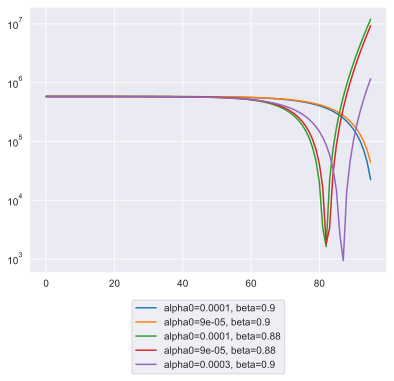

In [86]:
for alpha0, beta, hist, min_val in data:
    plt.plot(range(len(hist)), hist, label=f'{alpha0=}, {beta=}')
plt.yscale('log')
plt.legend(loc='lower center', ncol=1, bbox_to_anchor=(0.5, -0.4))

**Выводы:** Я очень много перепробовал раличных сеток, ручного перебора, но так и не смог добиться чего-то нормального. При данном выборе lr требуется очень точно подобрать как alpha0 так и beta. Сами же решения неустойчивы: даже измнене alpha0 на 1e-5 уже сильно изменяет тртаектории. Даже так достаточно легко подобрать такие коэффициенты, что алгоритм очень быстро сходится к минимуму но потом стремительно расходится. Такого не наблюдается при испольвоании ISTA\FISTA. Тем самым я бы не стал выбирать такой неустойчивый и прихотливый алгоритм.

**Бонус 2. (1.5 баллов)** Часто жизнь оказывается такова, что мы не можем подобрать оптимальный константный шаг, потому что это может быть дорого или же мы просто можем не находить его, а константну гладкости функции мы можем и не знать (да, оптимальный размер шага зависит от нее). В этом случае можно искать шаг $\alpha_{k}$ при помощи backtracking search:

$$f(x_{k+1})\leq f(x_k) + \langle \nabla f_k, x_{k+1}-x_k \rangle + \frac{1}{2\alpha_k}\|x_k-x_{k+1}\|^2$$

А в качестве процедуры поиска использовать бинарный поиск

*Замечание.* Внимательный студет может заметить, что в этом случае мы пытаемся подобрать $\alpha_{k}$ так, чтобы оно было похоже на $\frac{1}{L}$, который и является оптимальным размером шага.

Попробуйте реализовать данную стратегию, сравните ее с уже реализованными методами. Дополнительно посчитайте, сколько раз вы вычисляли саму функцию. Сделайте выводы.

**Выводы:**

### Часть 2 (1.5 балла). ADMM for matrix completion

Рассмотрим задачу восстановления матрицы $Y$. Мы наблюдаем только небольшой набор элементов матрицы $Y$, множество индексов известных элементов обозначим через $E$. То есть мы знаем $Y_{ij}$ для всех $(i,j) \in E$, и не знаем $Y_{ij}$ для всех $(i,j) \notin E$.

Понятно, что без наличия какой-либо дополнительной информации о матрице $Y$ эта постановка является тривиальной: любая матрица $X$, для которой выполнено $X_{i,j} = Y_{i,j}, \quad (i,j) \in E$ является разумным ответом. Таких матриц бесконечно много. Соответственно задача восстановления матриц обычно рассматривается как частный случай задачи приближения матрицы, а критерий качества (целевая функция) говорит не столько о близости $X$ к $Y$, сколько о полезных свойствах матрицы $X$ (этими свойствами матрица $Y$ может и не обладать).

Одна из самых популярных постановок является задача о поиске наилучшего приближения заданной матрицы матрицей малого ранга:

$$
\begin{align*}
& \min_{X} rank(X) \\
& X_{i,j} = Y_{i,j}, \quad (i,j) \in E\\
\end{align*}
$$

В общем случае эта задача является NP-трудной. Для того, чтобы обойти это припятствие ранк матрицы аппроксимируется той или иной выпуклой функцией от матрицы $X$. Стандартным выбором является переход к постановке задачи с использованием ядерной нормы

$$
\begin{align*}
& \min_{X}\|X \|_* \\
& X_{i,j} = Y_{i,j}, \quad (i,j) \in E\\
\end{align*}
$$

**Задание 1. (0.5 балла)** Сведите полученную задачу к виду, пригодному для решению с помощью ADMM. Запишите итерации, получите аналитические выражения для каждого шага.

**Решение:**

Перед нами стоит задача условной оптимизации, где условия задаются на составных элементах решения. Для Решения задачи воспользуемся алгоритмом ADMM, сведя задачу к специальному виду:

$$
  \begin{equation*}
    \left\{
      \begin{aligned}
        & \min_{X}\|X \|_* \\
        & X_{i,j} = Y_{i,j}, \quad (i,j) \in E
      \end{aligned}
    \right.
  \end{equation*}
  \Longrightarrow
  \begin{equation*}
    \left\{
      \begin{aligned}
        & \min_{X, Y} f(X) + g(Y) \\
        & AX + BY = C, \, \, где \, A, \,  B \, линейные \, операторы
      \end{aligned}
    \right.
  \end{equation*}
$$

Тогда получим следующую запись ADMM при заданные обозначениях:
* Пусть P будет оператором проектирования Y на подпространство матриц с базисом \{i, j\} = 1
* $Z \in \mathbb{R}^{m \times n}$ матрица изначальных данных о фото (все остальные значения равны 0)


$$
  \Longrightarrow
  \begin{equation*}
    \left\{
      \begin{aligned}
        & \min_{X, Y} \|X \|_* + \mathbb{I}_{\left \{ Y = Z, \, (i,j)\in E\right \}}^\infty \\
        & X = Y
      \end{aligned}
    \right.
  \end{equation*}
  \Longrightarrow \text{Решение ADMM:} \,\,\,
  \begin{equation*}
    \left\{
      \begin{aligned}
        & X^{k + 1} = \argmin_X \left\{\|X \|_* + \frac{1}{2r} \|\lambda^k + r \left(X - Y^k \right) \|^2_2 \right\} \\
        & Y^{k + 1} = \argmin_Y \left\{\mathbb{I}_{\left \{ Y = Z, \, (i,j)\in E\right \}}^\infty + \frac{1}{2r} \|\lambda^k + r \left(X^{k + 1} - Y \right) \|^2_2 \right\} \\
        & \lambda^{k + 1} = \lambda^k + r \left(X^{k + 1} - Y^{k + 1} \right)
      \end{aligned}
    \right.
  \end{equation*}
$$

---
Найдем теперь аналитическую запись для $X^{k + 1}$:

$$
  X^{k + 1} = \argmin_X \left\{\|X \|_* + \frac{1}{2r} \|\lambda^k + r \left(X - Y^k \right) \|^2_2 \right\} =
              \argmin_X \left\{\|X \|_* + \frac{r}{2} \|X - \left(Y^k - \frac{\lambda^k}{r}\right) \|^2_2 \right\} =
              {prox}_{\| \cdot \|, \frac{r}{2}}\left(Y^k - \frac{\lambda^k}{r} \right) = \\ \\
              = {prox}_{g(singular), \frac{r}{2}}\left(Y^k - \frac{\lambda^k}{r}\right) =
              \left \{ \left( Y^k - \frac{\lambda^k}{r} \right) = T \right \} =
              {prox}_{g(singular), \frac{r}{2}}\left(T\right) = \left\{SVD \rightarrow T \right\} =
              U_T \cdot diag\left(prox_{g, \frac{r}{2}}\left( \Sigma_T \right) \right) \cdot V^*_T
$$

Решим задачу для $prox_{g, \frac{r}{2}} \left( \Sigma_T \right) = prox_{g, \frac{r}{2}} \left(\sigma_1 \, ... \, \sigma_\gamma \right)$:

$$
  prox_{g, \frac{r}{2}} \left(\sigma_1 \, ... \, \sigma_\gamma \right) =
  \argmin_{(\hat{\sigma_1} \, ... \, \hat{\sigma_\gamma})} \left \{\sum \hat{\sigma_i} + \frac{r}{2} \sum \left(\hat{\sigma_i} - \sigma_i \right)^2 \right \}
  \longrightarrow
  \hat{\sigma_i} = \frac{r\sigma_i - 1}{r}; \, \, \, \left(\hat{\sigma}_1 \, ... \, \hat{\sigma}_\gamma \right) = \left(1 - \frac{1}{r} \right)\left(\sigma_1 \, ... \, \sigma_\gamma \right)
$$

Сдедовательно:

$ X^{k + 1} = U_T \cdot diag\left(\left(1 - \frac{1}{r} \right) \left(\sigma_1 \, ... \, \sigma_\gamma \right) \right) \cdot V^*_T, \, \, \, T = \left( Y^k - \frac{\lambda^k}{r} \right)$

---
Найдем теперь аналитическую запись для $Y^{k + 1}$:
$$
  Y^{k + 1} = \argmin_Y \left\{\mathbb{I}_{\left \{ Y = Z, \, (i,j)\in E\right \}}^\infty + \frac{1}{2r} \|\lambda^k + r \left(X^{k + 1} - Y \right) \|^2_2 \right\}
  \Longrightarrow
  \begin{equation*}
    \left\{
      \begin{aligned}
        & (i, j) \notin E \Rightarrow Y_{i, j} = X^{k + 1}_{i, j} + \frac{\lambda^k_{i, j}}{r} + 0 \\
        & (i, j) \in E    \Rightarrow Y_{i, j} = Z_{i, j} \\
      \end{aligned}
    \right.
  \end{equation*}
$$

**Задание 2.(0.5 балла)** Реализуйте полученные формулы.

*Замечание*. Вы все еще в праве менять интерфейсы функций так, как хотите

In [93]:
def MC_update_X(Y, lambda_, r):
    """
    Функция, обновляющая значение X для задачи Matrix Completion, используя переменные Y, lambda_ и r
    """
    # print('norm in X before', np.linalg.svd(Y - lambda_ / r, compute_uv=False).sum())
    T = Y - lambda_ / r
    U, S, Vh = np.linalg.svd(T, full_matrices=False)
    # print('norm in X after', np.linalg.svd(U @ np.diag((r * S) / (r + 2)) @ Vh, compute_uv=False).sum())
    return U @ np.diag(S - 1/r) @ Vh


def MC_update_Y(X, lambda_, r, Z, mask):
    """
    Функция, обновляющая значение Y для задачи Matrix Completion, используя переменные X, lambda_, r, Z и маску E
    """
    canvas = X + lambda_ / r
    canvas[*mask] = Z[*mask]

    return canvas


def MC_ADMM(Z, mask, tol, max_iters, r, verbose = False):
    """
    Функция, решающая задачу Matrix Completion для известных пикселей Z в точках mask
    Считаем, что метод сходится, если ядерная норма поменялась за итерацию менее чем на tol
    Максимальное количество итераций - max_iters
    Параметр r для ADMM задается в интерфейсе
    Для вычисления различных метрик вам может потребоваться знание исходного изображения
    """

    X = np.zeros_like(Z)
    Y = np.zeros_like(Z)

    X[*mask] = Z[*mask].copy()
    Y[*mask] = Z[*mask].copy()
    lambda_ = np.zeros_like(Z)

    iterations = tqdm.tqdm(range(max_iters)) if verbose else range(max_iters)
    last_score = +np.inf

    for _ in iterations:
        X = MC_update_X(Y, lambda_, r).copy()
        Y = MC_update_Y(X, lambda_, r, Z, mask).copy()
        lambda_ = lambda_ + r * (X - Y)

        score = np.linalg.svd(X, compute_uv=False).sum()
        if np.abs(last_score - score) < tol:
            print('break on tol')
            break
        else:
            last_score = score
            # print(score)

    return X

**Задание 3. (0 баллов)** Выберите любимую картинку, на которой вы будете тестировать алгоритм, покажите ее

In [94]:
def make_mask(dim0, dim1, quant=0.1):
    x_inds = np.arange(dim0)
    y_inds = np.arange(dim1)

    len_data = dim0 * dim1
    inds = np.arange(len_data)
    np.random.shuffle(inds)
    inds_to_have = np.array(list(set(np.arange(len_data)) - set(inds[:int(quant * len_data)])))

    x_inds = inds_to_have // dim1
    y_inds = inds_to_have %  dim1

    return [x_inds, y_inds]

In [95]:
def cure_image(img, mask, tol, steps, r):
    channels = np.zeros_like(img)
    for i in range(img.shape[2]):
        channels[:, :, i] = MC_ADMM(img[:, :, i], mask[i], tol, steps, r, False)
    return channels

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


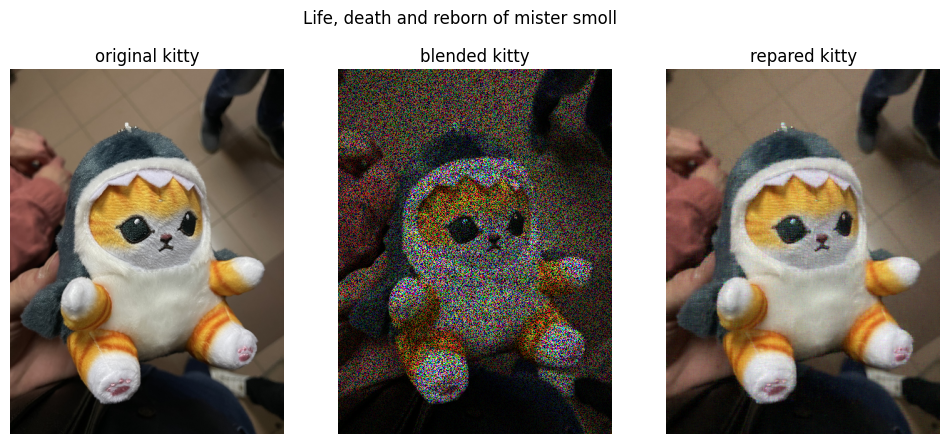

In [5]:
img = cv2.imread('kittik.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) / 255
img = cv2.resize(img, (0,0), fx=0.5, fy=0.5)

r_mask, g_mask, b_mask = make_mask(*img.shape[:2], 0.5), make_mask(*img.shape[:2], 0.5), make_mask(*img.shape[:2], 0.5)


broken_image = np.zeros_like(img)
broken_image[*r_mask, 0] = img[*r_mask, 0]
broken_image[*g_mask, 1] = img[*g_mask, 1]
broken_image[*b_mask, 2] = img[*b_mask, 2]

cured = cure_image(broken_image, [r_mask, g_mask, b_mask], 0.0, 75, 2)

fig, axis = plt.subplots(1, 3)
fig.suptitle("Life, death and reborn of mister smoll")
fig.set_figwidth(12)
fig.set_figheight(5)

axis[0].set_title('original kitty')
axis[0].imshow(img)
axis[0].grid(False)
axis[0].axis(False)

axis[1].set_title('blended kitty')
axis[1].imshow(broken_image)
axis[1].grid(False)
axis[1].axis(False)

axis[2].set_title('repared kitty')
axis[2].imshow(cured)
axis[2].grid(False)
axis[2].axis(False)

plt.show()

**Задание 4.(0.3 балла)** Покажите сходимость алгоритма, а также, что он действительно решает задачу восстановления изображения при отсутствии 50 процентов пикселей

*Замечание*. Вы можете работать с изображением как с черно белым, но интереснее будет запускать ADMM на каждом из каналов :)

In [76]:
def generate_mask(shape, size, seed=42):
    """
    Генерирует маску для изображения формы shape, оставляющую только size пикселей
    """
    np.random.seed(seed)
    mask = np.full(np.prod(shape), False)
    mask[:size] = True
    np.random.shuffle(mask)
    mask = mask.astype(bool)
    return mask.reshape(shape)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


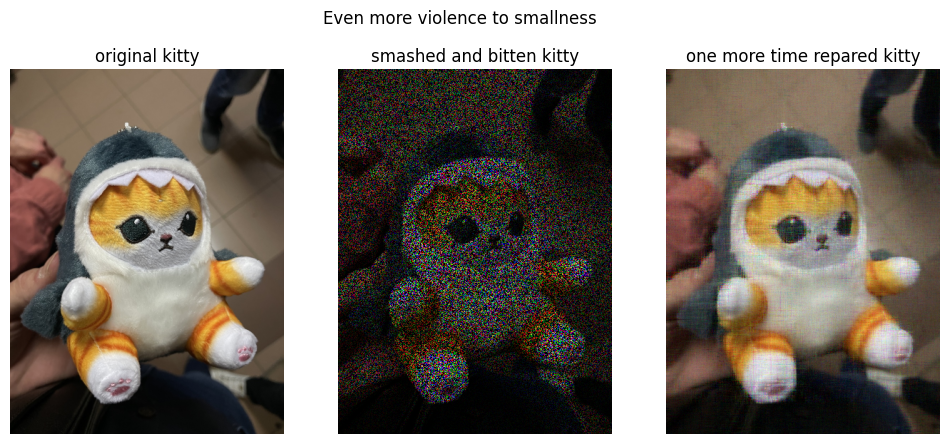

In [7]:
img = cv2.imread('kittik.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) / 255
img = cv2.resize(img, (0,0), fx=0.5, fy=0.5)

r_mask, g_mask, b_mask = make_mask(*img.shape[:2], 0.7), make_mask(*img.shape[:2], 0.7), make_mask(*img.shape[:2], 0.7)

broken_image = np.zeros_like(img)
broken_image[*r_mask, 0] = img[*r_mask, 0]
broken_image[*g_mask, 1] = img[*g_mask, 1]
broken_image[*b_mask, 2] = img[*b_mask, 2]

cured = cure_image(broken_image, [r_mask, g_mask, b_mask], 0.0, 100, 2)

fig, axis = plt.subplots(1, 3)
fig.suptitle("Even more violence to smallness")
fig.set_figwidth(12)
fig.set_figheight(5)

axis[0].set_title('original kitty')
axis[0].imshow(img)
axis[0].grid(False)
axis[0].axis(False)

axis[1].set_title('smashed and bitten kitty')
axis[1].imshow(broken_image)
axis[1].grid(False)
axis[1].axis(False)

axis[2].set_title('one more time repared kitty')
axis[2].imshow(cured)
axis[2].grid(False)
axis[2].axis(False)

plt.show()

**Задание 5.(0.2 балла)** Посмотрите на то, как влияет количество удаленных пикселей на качество восстановления, как с точки зрения нормы разности истинного изображения и восстановленного, так и с визуальной точки зрения. Посмотрите удаление 30, 50 и 80 процентов пикселей (приветствуется смотреть и другие значения, например, 90)

*Замечание*. Вы можете работать с изображением как с черно белым, но интереснее будет запускать ADMM на каждом из каналов :)

In [74]:
def plot_results(X, Y_true, mask, alphas, figsize=(10, 30)):
    """
    Функция, отрисовывающая получившиеся результаты
    X - list восстановленных изображений (цветных)
    Y_true - настоящее изображение
    mask - list масок
    alphas - list состоящий из долей удаленных пикселей
    Функция написана в предположении, что Вы работаете с цветными изображениями, если вы выбрали работать с чб, то
    не забудьте поменять код
    """
    fig, ax = plt.subplots(nrows=len(X), ncols=3, figsize=figsize)
    for j in range(len(X)):
        tmp = np.copy(Y_true)
        current_mask = np.stack((~mask[j], ~mask[j], ~mask[j]), axis=2)
        tmp[current_mask] = 0
        content = [Y_true, tmp, X[j]]
        titles = ["Оригинальное изображение",
          f"Изображение с удаленными\n {int(alphas[j] * 100)}% пикселями",
          "Восстановленное изображение"]
        for i in range(3):
            ax[j][i].set_title(titles[i])
            ax[j][i].imshow(content[i])
            ax[j][i].grid(False)
            ax[j][i].axis(False)
    plt.show()

In [75]:
def get_axis_results(img, quant, axis):
    r_mask, g_mask, b_mask = make_mask(*img.shape[:2], quant), make_mask(*img.shape[:2], quant), make_mask(*img.shape[:2], quant)

    broken_image = np.zeros_like(img)
    broken_image[*r_mask, 0] = img[*r_mask, 0]
    broken_image[*g_mask, 1] = img[*g_mask, 1]
    broken_image[*b_mask, 2] = img[*b_mask, 2]

    cured = cure_image(broken_image, [r_mask, g_mask, b_mask], 0.0, 100, 2)
    diff = np.array([np.linalg.svd(img[i] - cured[i], compute_uv=False).sum() for i in range(3)]).mean()
    axis[1].set_title("Final diff: " + str(diff))

    axis[0].imshow(img)
    axis[0].grid(False)
    axis[0].axis(False)

    axis[1].imshow(broken_image)
    axis[1].grid(False)
    axis[1].axis(False)

    axis[2].imshow(cured)
    axis[2].grid(False)
    axis[2].axis(False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


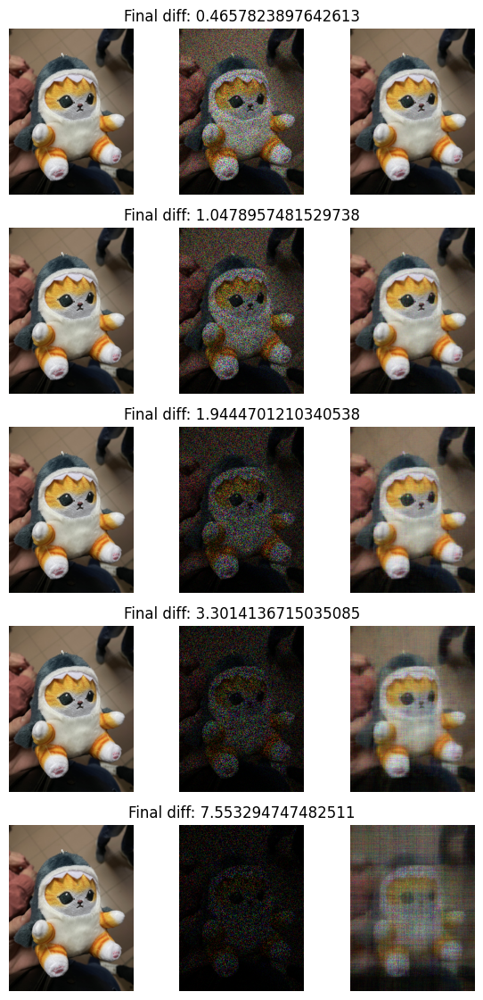

In [10]:
img = cv2.imread('kittik.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) / 255
img = cv2.resize(img, (0,0), fx=0.5, fy=0.5)

fig, axis = plt.subplots(5, 3)

fig.set_figwidth(7)
fig.set_figheight(14)

get_axis_results(img, 0.3, axis[0])
get_axis_results(img, 0.5, axis[1])
get_axis_results(img, 0.7, axis[2])
get_axis_results(img, 0.8, axis[3])
get_axis_results(img, 0.9, axis[4])

**Выводы:**

Мы видим, что предложенный алгоритм восстановления изображения способен показывать крайне хорошие результаты. Так даже для картинки с поражением пикселей в 90% мы способны увидеть различимую картинку. Тем не менее действительно хорошие резултаты находятся примеро до 70% поражения. 

Наблюдается экспоненциальный рост невязки между матрицами с ростом поражения, тем не менее на графической состоавляющей это сказывается не так наглядно. Интересен тот факт, что артефакты восстановленного изображения проявляются в виде вертикальных и горизонтальных полос, что естественным образом связаны с природой восстановленного изображения (от перемножения матриц)

#### Что будет, если поставить задачу ADMM иначе?

Изначально я решил задачу иначе. Потому посмотрим, что будет, если вместо индикатора мы будем использовать норму Фробениуса между проекцией Y и Z в качестве функции $g$

$$
  Y^{k + 1} = \argmin_Y \left\{\frac{1}{2}\| P(Y) - Z \|^2_2 + \frac{1}{2r} \|\lambda^k + r \left(X^{k + 1} - Y \right) \|^2_2 \right\}
  \Longrightarrow
  \\
  \nabla_Y \left \{ ... \right \} = 2 \cdot \frac{1}{2} P^*(P(Y) - Z) + 2 \cdot \frac{r}{2} I^* \left( I \, Y - X^{k + 1} - \frac{\lambda^k}{r}\right) = 0
  \Longrightarrow
  \begin{equation*}
    \left\{
      \begin{aligned}
        & (i, j) \notin E \Rightarrow Y_{i, j} = X^{k + 1}_{i, j} + \frac{\lambda^k_{i, j}}{r} + 0 \\
        & (i, j) \in E    \Rightarrow Y_{i, j} = \frac{r}{r + 1} X^{k + 1}_{i, j} + \frac{\lambda^k_{i, j}}{r + 1} + \frac{Z_{i, j}}{r + 1} \\
      \end{aligned}
    \right.
  \end{equation*}
$$

При этом меняется только формула для Y^k: появляется специальная добавка в формул с другими знаменателями

In [83]:
def MC_update_X(Y, lambda_, r):
    """
    Функция, обновляющая значение X для задачи Matrix Completion, используя переменные Y, lambda_ и r
    """
    # print('norm in X before', np.linalg.svd(Y - lambda_ / r, compute_uv=False).sum())
    T = Y - lambda_ / r
    U, S, Vh = np.linalg.svd(T, full_matrices=False)
    # print('norm in X after', np.linalg.svd(U @ np.diag((r * S) / (r + 2)) @ Vh, compute_uv=False).sum())
    return U @ np.diag(S - 1/r) @ Vh


def MC_update_Y(X, lambda_, r, Z, mask):
    """
    Функция, обновляющая значение Y для задачи Matrix Completion, используя переменные X, lambda_, r, Z и маску E
    """
    canvas = X + lambda_ / r
    canvas[*mask] = (r * X[*mask] / (r + 1)) + (lambda_[*mask] / (r + 1)) + (Z[*mask] / (r + 1))

    return canvas


def MC_ADMM(Z, mask, tol, max_iters, r, verbose = False):
    """
    Функция, решающая задачу Matrix Completion для известных пикселей Z в точках mask
    Считаем, что метод сходится, если ядерная норма поменялась за итерацию менее чем на tol
    Максимальное количество итераций - max_iters
    Параметр r для ADMM задается в интерфейсе
    Для вычисления различных метрик вам может потребоваться знание исходного изображения
    """

    X = np.zeros_like(Z)
    Y = np.zeros_like(Z)

    X[*mask] = Z[*mask].copy()
    Y[*mask] = Z[*mask].copy()
    lambda_ = np.zeros_like(Z)

    iterations = tqdm.tqdm(range(max_iters)) if verbose else range(max_iters)
    last_score = +np.inf

    for _ in iterations:
        X = MC_update_X(Y, lambda_, r).copy()
        Y = MC_update_Y(X, lambda_, r, Z, mask).copy()
        lambda_ = lambda_ + r * (X - Y)

        score = np.linalg.svd(X, compute_uv=False).sum()
        if np.abs(last_score - score) < tol:
            print('break on tol')
            break
        else:
            last_score = score
            # print(score)

    return X

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


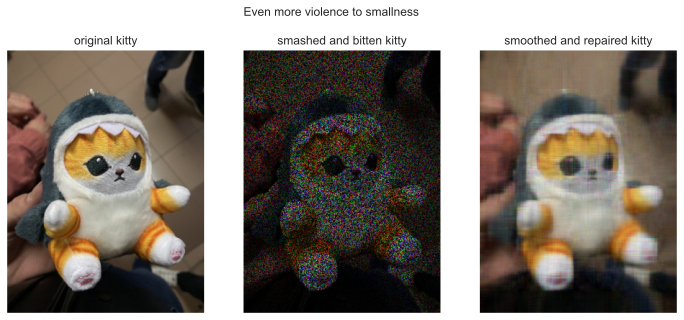

In [84]:
img = cv2.imread('kittik.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) / 255
img = cv2.resize(img, (0,0), fx=0.5, fy=0.5)

r_mask, g_mask, b_mask = make_mask(*img.shape[:2], 0.7), make_mask(*img.shape[:2], 0.7), make_mask(*img.shape[:2], 0.7)

broken_image = np.zeros_like(img)
broken_image[*r_mask, 0] = img[*r_mask, 0]
broken_image[*g_mask, 1] = img[*g_mask, 1]
broken_image[*b_mask, 2] = img[*b_mask, 2]

cured = cure_image(broken_image, [r_mask, g_mask, b_mask], 0.0, 100, 2)

fig, axis = plt.subplots(1, 3)
fig.suptitle("Even more violence to smallness")
fig.set_figwidth(12)
fig.set_figheight(5)

axis[0].set_title('original kitty')
axis[0].imshow(img)
axis[0].grid(False)
axis[0].axis(False)

axis[1].set_title('smashed and bitten kitty')
axis[1].imshow(broken_image)
axis[1].grid(False)
axis[1].axis(False)

axis[2].set_title('smoothed and repaired kitty')
axis[2].imshow(cured)
axis[2].grid(False)
axis[2].axis(False)

plt.show()

**Итог:** игрушка стала менее четкой, даже в тех местах, где пиксели были известны. Это понятно, так как на этот раз мы не так сильно штрафуем за ошибки на отведенных пикселях. Эффект вертикальной/горизонтальной решетки стал менее выраженным

Проверим, как себя поведет алгоритм на 90% поражения

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


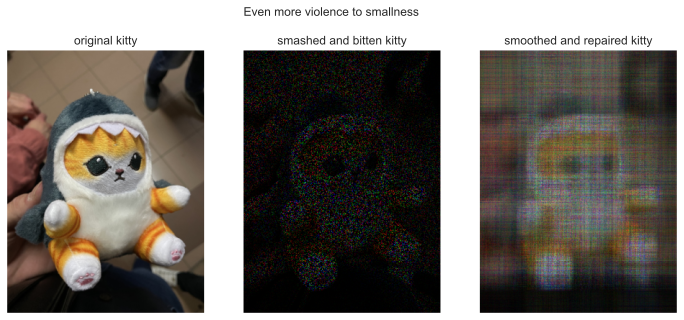

In [85]:
img = cv2.imread('kittik.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) / 255
img = cv2.resize(img, (0,0), fx=0.5, fy=0.5)

r_mask, g_mask, b_mask = make_mask(*img.shape[:2], 0.9), make_mask(*img.shape[:2], 0.9), make_mask(*img.shape[:2], 0.9)

broken_image = np.zeros_like(img)
broken_image[*r_mask, 0] = img[*r_mask, 0]
broken_image[*g_mask, 1] = img[*g_mask, 1]
broken_image[*b_mask, 2] = img[*b_mask, 2]

cured = cure_image(broken_image, [r_mask, g_mask, b_mask], 0.0, 100, 2)

fig, axis = plt.subplots(1, 3)
fig.suptitle("Even more violence to smallness")
fig.set_figwidth(12)
fig.set_figheight(5)

axis[0].set_title('original kitty')
axis[0].imshow(img)
axis[0].grid(False)
axis[0].axis(False)

axis[1].set_title('smashed and bitten kitty')
axis[1].imshow(broken_image)
axis[1].grid(False)
axis[1].axis(False)

axis[2].set_title('smoothed and repaired kitty')
axis[2].imshow(cured)
axis[2].grid(False)
axis[2].axis(False)

plt.show()

**Итог:** Оценочное качестно такой картинки много хуже такового для постановки со строгим индикатором, так как теперь картинка сильно зашумлена и напоминает таковую, будто поверх предыдущей прошлись усредняющим фильтром. Теперь решетка стала еще более заметна и из прямых артефакты превратились в полосы

##### Это для мема

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


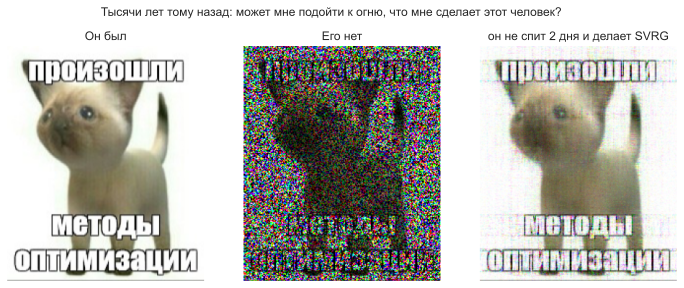

In [100]:
img = cv2.imread('meme.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) / 255
# img = cv2.resize(img, (0,0), fx=0.5, fy=0.5)

r_mask, g_mask, b_mask = make_mask(*img.shape[:2], 0.6), make_mask(*img.shape[:2], 0.6), make_mask(*img.shape[:2], 0.6)


broken_image = np.zeros_like(img)
broken_image[*r_mask, 0] = img[*r_mask, 0]
broken_image[*g_mask, 1] = img[*g_mask, 1]
broken_image[*b_mask, 2] = img[*b_mask, 2]

cured = cure_image(broken_image, [r_mask, g_mask, b_mask], 0.0, 75, 2)

fig, axis = plt.subplots(1, 3)
title = fig.suptitle("Тысячи лет тому назад: может мне подойти к огню, что мне сделает этот человек?")
title = title.set_position([.5, 0.93])
fig.set_figwidth(12)
fig.set_figheight(5)

axis[0].set_title('Он был')
axis[0].imshow(img)
axis[0].grid(False)
axis[0].axis(False)

axis[1].set_title('Его нет')
axis[1].imshow(broken_image)
axis[1].grid(False)
axis[1].axis(False)

axis[2].set_title('он не спит 2 дня и делает SVRG')
axis[2].imshow(cured)
axis[2].grid(False)
axis[2].axis(False)

plt.show()

### Часть 3. (2.95 баллов) Редукция дисперсии

Часто при обучении нейронных сетей возникает вопрос выбора параметра `batch_size`, как вы знаете батчирование (разбирали на паре) помогает уменьшить дисперсию стохастического градиента и следовательно улучшает сходимость. К сожалению, на практике мы не можем взять `batch_size` достаточно большим из-за ограничений видеопамяти, а стохастический градиент все еще достаточно шумный.

В этой части Вам предлагется реализовать метод **SVRG** и продемонстрировать его работу.

*Замечание*: в базовой реализации мы будем предполагать, что раз в $N$ итераций мы сможем сделать `backward pass` с большим батчом. На практике такое предположение не выполняется. Исправление данной проблемы является чисто технической задачей, которую не обязательно решать в учебных целях.

In [91]:
import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm
import os
import random
import copy

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

from torchvision.datasets import MNIST
import torchvision.transforms as transforms

In [2]:
def set_global_seed(seed: int) -> None:
    """
    Set global seed for reproducibility.
    """
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)

set_global_seed(42)

**Задание 1. (0.1 баллов)** Предварительные сведения


При реализации **SVRG** вам потребуется сохранять веса и градиенты модели. В этом задании вам предлагается поменять местами (свапнуть) веса двух моделей с целью упражнения и упрощения поменимания дальнейшего кода.

*Подсказка 1*: обратите внимание на функцию `copy.deepcopy`

*Замечание*: Вы можете использовать функции `set_weights`, `set_grad`, но также можно реализовать их сами

In [3]:
@torch.no_grad()
def set_weights(parameters, parameters_new):
    """
    Функция устанавливает веса parameters_new как веса для parameters
    """

    for p1, p2 in zip(parameters, parameters_new):
        p1.data = p2.data.detach().clone()

@torch.no_grad()
def set_grad(parameters, parameters_new):
    """
    Функция устанавливает градиенты parameters_new как градиенты для parameters
    """
    for p1, p2 in zip(parameters, parameters_new):
        if p2.grad is not None:
            p1.grad = p2.grad.detach().clone()
            continue
        if isinstance(p2, torch.Tensor):
            p1.grad = p2.detach().clone()

In [5]:
# Нейросети, веса которых вам нужно поменять местами

x1 = torch.arange(12).view(3, 4).float()
x2 = (11 - torch.arange(12)).view(3, 4).float()

net1 = nn.Sequential(nn.Linear(4, 4), nn.ReLU())
net2 = nn.Sequential(nn.Linear(4, 4), nn.ReLU())

sum1 = torch.sum(net1(x1)); sum1.backward()
sum2 = torch.sum(net2(x2)); sum2.backward()

net1_p = list(net1.parameters())
net2_p = list(net2.parameters())

net1_g = list([par.grad for par in net1.parameters()])
net2_g = list([par.grad for par in net2.parameters()])

print("Параметры net1\n", net1_p, "\n\nГрадиенты net1\n", net1_g, end='\n\n')
print("Параметры net2\n", net2_p, "\n\nГрадиенты net2\n", net2_g)

Параметры net1
 [Parameter containing:
tensor([[ 0.1343, -0.1356,  0.2104,  0.4464],
        [ 0.2890, -0.2186,  0.2886,  0.0895],
        [ 0.2539, -0.3048, -0.4950, -0.1932],
        [-0.3835,  0.4103,  0.1440,  0.2071]], requires_grad=True), Parameter containing:
tensor([ 0.1581, -0.0087,  0.3913, -0.3553], requires_grad=True)] 

Градиенты net1
 [tensor([[12., 15., 18., 21.],
        [12., 15., 18., 21.],
        [ 0.,  0.,  0.,  0.],
        [12., 15., 18., 21.]]), tensor([3., 3., 0., 3.])]

Параметры net2
 [Parameter containing:
tensor([[ 0.0315, -0.3413,  0.1542, -0.1722],
        [ 0.1532, -0.1042,  0.4147, -0.2964],
        [-0.2982, -0.2982,  0.4497,  0.1666],
        [ 0.4811, -0.4126, -0.4959, -0.3912]], requires_grad=True), Parameter containing:
tensor([-0.3363,  0.2025,  0.1790,  0.4155], requires_grad=True)] 

Градиенты net2
 [tensor([[ 0.,  0.,  0.,  0.],
        [21., 18., 15., 12.],
        [ 0.,  0.,  0.,  0.],
        [ 3.,  2.,  1.,  0.]]), tensor([0., 3., 0., 1.])]

Поменяйте местами веса моделей, код необходимо написать ниже

In [6]:
param_net2 = [par.clone() for par in net2.parameters()]
grad_net2  = [par.grad.clone() for par in net2.parameters()]

set_weights(net2.parameters(), net1.parameters())
set_weights(net1.parameters(), param_net2)

set_grad(net2.parameters(), net1.parameters())
set_grad(net1.parameters(), grad_net2)

del param_net2

In [7]:
net1_p = list(net1.parameters())
net2_p = list(net2.parameters())

net1_g = list([par.grad for par in net1.parameters()])
net2_g = list([par.grad for par in net2.parameters()])

print("Параметры net1 после обмена\n", net1_p, "\n\nГрадиенты net1 после обмена\n", net1_g, end='\n\n')
print("Параметры net2 после обмена\n", net2_p, "\n\nГрадиенты net2 после обмена\n", net2_g)

Параметры net1 после обмена
 [Parameter containing:
tensor([[ 0.0315, -0.3413,  0.1542, -0.1722],
        [ 0.1532, -0.1042,  0.4147, -0.2964],
        [-0.2982, -0.2982,  0.4497,  0.1666],
        [ 0.4811, -0.4126, -0.4959, -0.3912]], requires_grad=True), Parameter containing:
tensor([-0.3363,  0.2025,  0.1790,  0.4155], requires_grad=True)] 

Градиенты net1 после обмена
 [tensor([[ 0.,  0.,  0.,  0.],
        [21., 18., 15., 12.],
        [ 0.,  0.,  0.,  0.],
        [ 3.,  2.,  1.,  0.]]), tensor([0., 3., 0., 1.])]

Параметры net2 после обмена
 [Parameter containing:
tensor([[ 0.1343, -0.1356,  0.2104,  0.4464],
        [ 0.2890, -0.2186,  0.2886,  0.0895],
        [ 0.2539, -0.3048, -0.4950, -0.1932],
        [-0.3835,  0.4103,  0.1440,  0.2071]], requires_grad=True), Parameter containing:
tensor([ 0.1581, -0.0087,  0.3913, -0.3553], requires_grad=True)] 

Градиенты net2 после обмена
 [tensor([[12., 15., 18., 21.],
        [12., 15., 18., 21.],
        [ 0.,  0.,  0.,  0.],
     

Действительно, мы получили модели с полностью обмененными параментрами и градиентами на слоях

**Задание 2. (0.2 баллов)** Реализуйте `SGD`

В качестве базового класса будем использовать [torch.optim.Optimizer](https://pytorch.org/docs/stable/optim.html#base-class). Цель этого пункта познакомить вас с тем, как внутри оптимизатора лежат веса и градиенты модели. Вам же необходимо написать шаг стохастического градиентного спуска.

In [4]:
class SGDBase(optim.Optimizer):

    def __init__(self, params, lr):

        # Определение Базового класса
        defaults = dict(lr=lr)
        super().__init__(params, defaults)

    def step(self):

        # Итерация по всем группам параметров
        for group in self.param_groups:
            # Итерация по всем параметрам
            for p in group['params']:

                # Проверка на то, обучаем ли параметр
                if p.grad is None:
                    continue
                
                p.data = p.data - self.defaults['lr'] * p.grad

Проверим работоспособность на простой функции и сравним наш алгоритм, с реализацией `optim.SGD`

In [5]:
def foo(x):
    return (x - 1.0) ** 2

def testing_optimizer(x_0, optimizer_class, num_steps=10):
    x = nn.Parameter(data=x_0.clone()) # x - обучаемый параметр
    optimizer = optimizer_class([x], lr=0.1)
    history = [x.item()]

    for _ in range(num_steps):
        optimizer.zero_grad()

        loss = foo(x)
        loss.backward()

        optimizer.step()
        history.append(x.item())


    return np.array(history)

In [14]:
x_0 = torch.tensor(10.0)
history_pytorch = testing_optimizer(x_0, optimizer_class=optim.SGD)
history_pytorch

array([10.        ,  8.19999981,  6.75999975,  5.6079998 ,  4.68639994,
        3.94912004,  3.35929608,  2.88743687,  2.50994945,  2.20795965,
        1.96636772])

In [16]:
history_base = testing_optimizer(x_0, optimizer_class=SGDBase)
history_base

array([10.        ,  8.19999981,  6.75999975,  5.6079998 ,  4.68639994,
        3.94912004,  3.35929608,  2.88743687,  2.50994945,  2.20795965,
        1.96636772])

In [18]:
assert (history_base == history_pytorch).all()

**Задание 3. (0.3 баллов)** Обертка над шагом обучения

Для дальнейшего удобства использования, напишем небольшой класс-обертку. Такой ход позволит скрыть от цикла обучения все функции связанные с шагом обучения. Благодаря этому мы сможем добавить **SVRG** (который влияет на только на итерацию обучения) переопределив класс-обертку. Тем самым наша реализация **SVRG** будет спрятана в обертки и не будет влиять на код цикла обучения.

*Замечание*: Ниже в целях уменьшения кода, мы предполагаем что в оптимизаторе только одна группа параметров. То есть оптимизаторы вида:

```python

optim.Adam([
        {"params": net1.parameters(), "lr": lr1},
        {"params": net2.parameters(), "lr": lr2},
    ...
    ])

```

**НЕ** будут поддерживаться

In [6]:
class WrapperBase:

    def __init__(self, optimizer, loss_fn):
        """
        optimizer - базовый оптимизатор
        loss_fn - функция по батчу вычисляющая loss и другие важные в ходе обучения значения.
        Функция возвращает словарь, в котором обязательно присутсвует ключ 'loss'.
        Значение функции потерь храняться по ключу 'loss'

        """

        self.optimizer = optimizer
        self.loss_fn = loss_fn

    def get_param_groups(self):
        """
        return
        Ссылку на параметры модели, т.е. изменение значения, меняет значение внутри модели

        Замечание: захардкожено [0]
        """
        return self.optimizer.param_groups[0]['params']

    def get_group(self):
        """
        return
        Возвращает группу параметров оптимизатора

        Замечание: захардкожено [0]
        """
        return self.optimizer.param_groups[0]

    def zero_grad(self):
        """
        Обнуляет все градиенты для параметров оптимизатора
        """
        self.optimizer.zero_grad()
        # for p in self.optimizer.param_groups[0]['params']:
        #     p.grad = None

    def step(self):
        """
        Производит шаг оптимизатора
        """
        self.optimizer.step()
        

    def step_fn(self, batch):
        self.zero_grad()
        
        loss = self.loss_fn(batch)
        loss['loss'].item()
        loss['loss'].backward()
        
        self.step()

        return loss

Тогда мы можем переписать `testing_optimizer` следующим образом

In [21]:
def testing_optimizer_wrapper(x_0, optimizer_class, num_steps=10):
    x = nn.Parameter(data=x_0.clone()) # x - обучаемый параметр
    optimizer = optimizer_class([x], lr=0.1)
    optimizer_wrapper = WrapperBase(optimizer, lambda x: {'loss': foo(x)})

    history = [x.item()]

    for _ in range(num_steps):
        optimizer_wrapper.step_fn(x)
        history.append(x.item())


    return np.array(history)

In [22]:
x_0 = torch.tensor(10.0, requires_grad=True)
history = testing_optimizer(x_0, optimizer_class=optim.SGD)
history_wrapper = testing_optimizer_wrapper(x_0, optimizer_class=optim.SGD)

In [23]:
assert (history == history_wrapper).all()

**Задание 4. (0.75 баллов)** **SVRG**

Реализуем метод `SVRG` как обёртку над базовым классом оптимизатора (оптимизатор используем условно как удобный интерфейс)

Для начала напомним вид алгоритма из семинара:

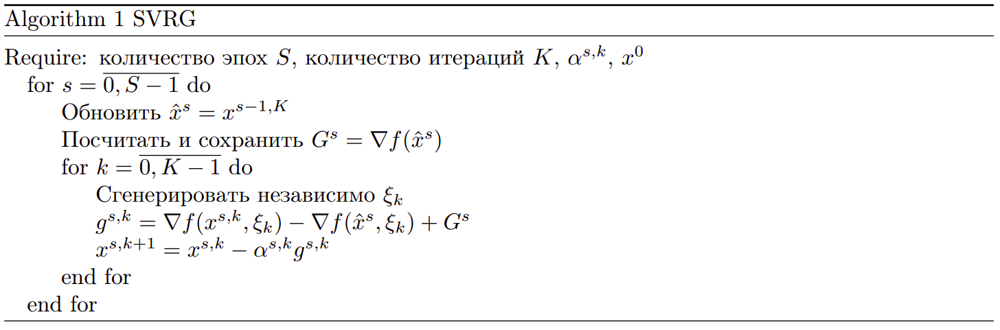

**ВАЖНО**

Мы будем реализовывать чуть другую версию:
    
```python

for i in range(1, N):
    if i % S == 0:
        w_large := w
        Обновить G_s           # градиент по всей выборки (большому батчу) при весах w_large
        
    Засэмплировать батч        # batch
    g_main                     # градиент по batch при весах w
    g_bias                     # градиент по batch при весах w_large
    g = g_main - g_bias + G_s
    
    w = w - lr * g
```

*Замечание*. Вы можете менять интерфейсы классов так, как считаете нужным, предложенный вариант - один из возможных. Главное, чтобы все работало

In [7]:
class SVRG(WrapperBase):

    def __init__(self, optimizer, loss_fn, data, S):
        """
        data - вся выборка или батч большого размера, по которому считается градиент раз в S итераций
        S - параметр указывающий частоту пересчета градиента по всей выборки
        """

        super().__init__(optimizer=optimizer, loss_fn=loss_fn)

        self.data = data
        self.S = S
        self.counter = 0

    def step_fn(self, batch):

        # Обнуление градинетов модели, чтобы не накладывались при следующих вычислениях
        self.zero_grad()

        # Подсчет градиента на батче
        loss_main = self.loss_fn(batch)
        loss_main['loss'].item()
        loss_main['loss'].backward()

        # Сохранение градиентов и весов посчитанных на батче
        curr_params = [par.clone() for par in self.get_param_groups()]
        curr_grads  = [par.grad.clone() for par in self.get_param_groups()]

        # Обнуление градинетов модели, чтобы не накладывались при следующих вычислениях
        self.zero_grad()

        if self.counter == 0:
            self.zero_grad()
            # Подсчет градиента на большом множестве
            loss = self.loss_fn(self.data)
            loss['loss'].item()
            loss['loss'].backward()

            # Сохранение градиентов и весов посчитанных на большом батче
            self.large_params = [par.clone() for par in self.get_param_groups()]
            self.large_grads  = [par.grad.clone() for par in self.get_param_groups()]

            # Обнуление градинетов модели, чтобы не накладывались при следующих вычислениях
            self.zero_grad()


        # Установка весов модели (для которой считали градиент на большом батче)
        set_weights(self.get_param_groups(), self.large_params)


        # Подсчет градиента на батче для поправки
        loss = self.loss_fn(batch)
        loss['loss'].item()
        loss['loss'].backward()


        # Сохранение градиентов посчитанных на батче поправки
        params_bias = [par.clone() for par in self.get_param_groups()]
        set_grad(params_bias, self.get_param_groups())
        

        # Востановлние весов и градиентов прошлой модели
        set_weights(self.get_param_groups(), curr_params)
        set_grad(self.get_param_groups(), curr_grads)
        

        for p_main, p_large, p_bias in zip(self.get_param_groups(), self.large_grads, params_bias):

            if p_main.grad is None:
                continue
            
            # Подсчет градиента с поправкаи
            d_p = p_main.grad - p_bias.grad + p_large

            # Подменяем градиенты для оптимизатора
            p_main.grad.data = d_p.detach().clone()

        # Шаг основного оптимизатора с новыми градиентами
        self.step()

        # Обновление счётчика
        self.counter += 1

        if self.counter == self.S:
            self.counter = 0

        return loss_main


**Задание 5: демонстрация использования оптимизатора (0 баллов)**: Эксперименты на  `MNIST`
    
Для корректных выводов по работе  **SVRG** нам необходиомо:

1) Задача на реальных данных

2) Baseline решения этой задачи


В качестве данных предлагается `MNIST`, в качестве Baseline следующий код.


Напомним, что **SVRG** придуман для понижения дисперсии стохастического градиента. Поэтому будем иметь 2 стандартных решения: с высокой и низкой дисперсией стохастического градиента.


Вам необходимо обучить 2 и больше модели, с которыми Вы дальше будете сравниваться. Предполагается, что у одной модели будет выскоая дисперсия стохастического градиента, а у другой низкая. Другие модели тоже можно обучать для вывода (но эти 2 необходимо получить).


**Важно**: Все эксперименты должны быть воспроизводимы, поэтому фиксируете сид

**Важно**: Если будете менять обучение, постарайтесь, чтобы оно не заняло более 10 минут вычислений на гпу для 1 модели

*Замечание*: весь код ниже можно менять, главное выполнить задание 6 и показать 2 baseline, с которыми Вы дальше будете сравниваться



In [8]:
device = "cpu"

if torch.cuda.is_available():
    device = "cuda:0"
    
if torch.backends.mps.is_available():
    device = "mps:0"

device

'mps:0'

Подготовка данных

In [9]:
data_dir = "./data"
os.makedirs(data_dir, exist_ok=True)

transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean=(0.5), std=(0.5))])

train_dataset = MNIST(root=data_dir, train=True, download=True,
                      transform=transform)

test_dataset = MNIST(root=data_dir, train=False, download=True,
                     transform=transform)

Архитектура модели

In [10]:
class MnistClassifier(nn.Module):

    def __init__(self, hidden_dim=10, image_dim=28):

        super().__init__()

        self.fc_input = nn.Sequential(nn.Flatten(),
                                      nn.Linear(image_dim ** 2, hidden_dim),
                                      nn.SiLU())

        self.fc_out = nn.Sequential(nn.Linear(hidden_dim, 10))


    def forward(self, x):

        return self.fc_out(self.fc_input(x))

Определение `loss_fn` для класса обертки

In [11]:
def loss_fn_constructor(model, device):
    criterion = nn.CrossEntropyLoss(reduction='mean')

    def loss_fn(batch):
        X_batch, y_true = batch

        X_batch = X_batch.to(device)
        y_true = y_true.to(device)

        out = model(X_batch.float())
        loss = criterion(out, y_true)

        y_pred = torch.argmax(out, 1)
        accuracy = torch.sum(y_pred == y_true) / y_pred.shape[0]

        return {'loss': loss, 'accuracy': accuracy}

    return loss_fn

**Логирование**

Для проведение экспериментов вам потребуется отслеживать следующие показатели:

- Дисперсия стохастического градиента

- Значения loss и accuracy на train и test

- Дисперсия весов модели

Для логирования Вы можете использовать любые библиотеки либо собирать данные во время обучения и выводить их после. Здесь предложена реализация через wandb, но вы можете ее не использовать.

**ВАЖНО**

1. Без графиков или иных подтверждающих результатов работа не будет засчитана

2. Все графики должны быть в ноутбуке, то есть нельзя прикреплять ссылки на запуск

3. Все запуски должны быть воспроизводимы при последовательном выполнении ячеек

In [12]:
from collections import defaultdict

class CustomLogger:
    def __init__(self, name):
        self.name = name
        self.stats = defaultdict(lambda: [])
        
    def add_stats(self, dict):
        for key, value in dict.items():
            self.stats[key].append(value)
            
    def get_stats(self):
        return self.stats

In [13]:
def show_metrics(stats, name):
    fig, axis = plt.subplots(1, 2)
    fig.set_figwidth(10)
    fig.set_figheight(5)
    fig.suptitle(f'Метрики {name}')
    
    train_loss_vals, train_loss_steps = [v[0] for v in stats['train/loss']], [v[1] for v in stats['train/loss']]
    eval_loss_vals,  eval_loss_steps  = [v[0] for v in stats['eval/loss']], [v[1] for v in stats['eval/loss']]
    
    train_acc_vals, train_acc_steps = [v[0] for v in stats['train/accuracy']], [v[1] for v in stats['train/accuracy']]
    eval_acc_vals,  eval_acc_steps  = [v[0] for v in stats['eval/accuracy']], [v[1] for v in stats['eval/accuracy']]
    
    axis[0].set_title('loss')
    axis[0].plot(train_loss_steps, train_loss_vals, label='train')
    axis[0].plot(eval_loss_steps, eval_loss_vals, label='eval')
    axis[0].grid(True)

    axis[1].set_title('accuracy')
    axis[1].plot(train_acc_steps, train_acc_vals, label='train')
    axis[1].plot(eval_acc_steps, eval_acc_vals, label='eval')
    axis[1].grid(True)
    
    axis[0].legend(); axis[1].legend()

In [14]:
def show_grad_variances(stats, name):
    fig, axis = plt.subplots(2, 2)
    fig.set_figwidth(10)
    fig.set_figheight(7)
    
    fc_in_weight,  fc_in_weight_steps   = [v[0] for v in stats['grad_var/fc_input.1.weight']], [v[1] for v in stats['grad_var/fc_input.1.weight']]
    fc_out_weight, fc_out_weight_steps  = [v[0] for v in stats['grad_var/fc_out.0.weight']], [v[1] for v in stats['grad_var/fc_out.0.weight']]
    
    fc_in_bias,  fc_in_bias_steps   = [v[0] for v in stats['grad_var/fc_input.1.bias']], [v[1] for v in stats['grad_var/fc_input.1.bias']]
    fc_out_bias, fc_out_bias_steps  = [v[0] for v in stats['grad_var/fc_out.0.bias']], [v[1] for v in stats['grad_var/fc_out.0.bias']]
    
    fig.suptitle(f'Дисперсии градиентов на слоях {name}')
    
    axis[0][0].set_title('grad var fc_in_weights')
    axis[0][0].plot(fc_in_weight_steps, fc_in_weight)
    axis[0][0].grid(True)
    
    axis[0][1].set_title('grad var fc_out_weights')
    axis[0][1].plot(fc_out_weight_steps, fc_out_weight)
    axis[0][1].grid(True)
    
    axis[1][0].set_title('grad var fc_out_bias')
    axis[1][0].plot(fc_in_bias_steps, fc_in_bias)
    axis[1][0].grid(True)
    
    axis[1][1].set_title('grad var fc_out_bias')
    axis[1][1].plot(fc_out_bias_steps, fc_out_bias)
    axis[1][1].grid(True)
    

In [15]:
def show_weight_variances(stats, name):
    fig, axis = plt.subplots(2, 2)
    fig.set_figwidth(10)
    fig.set_figheight(7)
    
    fc_in_weight,  fc_in_weight_steps   = [v[0] for v in stats['params_var/fc_input.1.weight']], [v[1] for v in stats['grad_var/fc_input.1.weight']]
    fc_out_weight, fc_out_weight_steps  = [v[0] for v in stats['params_var/fc_out.0.weight']], [v[1] for v in stats['grad_var/fc_out.0.weight']]
    
    fc_in_bias,  fc_in_bias_steps   = [v[0] for v in stats['params_var/fc_input.1.bias']], [v[1] for v in stats['grad_var/fc_input.1.bias']]
    fc_out_bias, fc_out_bias_steps  = [v[0] for v in stats['params_var/fc_out.0.bias']], [v[1] for v in stats['grad_var/fc_out.0.bias']]
    
    fig.suptitle(f'Дисперсии весов на слоях {name}')
    
    axis[0][0].set_title('param var fc_in_weights')
    axis[0][0].plot(fc_in_weight_steps, fc_in_weight)
    axis[0][0].grid(True)
    
    axis[0][1].set_title('param var fc_out_weights')
    axis[0][1].plot(fc_out_weight_steps, fc_out_weight)
    axis[0][1].grid(True)
    
    axis[1][0].set_title('param var fc_out_bias')
    axis[1][0].plot(fc_in_bias_steps, fc_in_bias)
    axis[1][0].grid(True)
    
    axis[1][1].set_title('param var fc_out_bias')
    axis[1][1].plot(fc_out_bias_steps, fc_out_bias)
    axis[1][1].grid(True)

In [16]:
import wandb

In [17]:
@torch.no_grad()
def log_variance(model, global_step, logger):
    stats = {}
    for tag, value in model.named_parameters():
        g = value.grad
        if g is None:
            continue
        
        stats[f"weight_norm/{tag}"] = (torch.norm(g.cpu()), global_step)
        stats[f"grad_var/{tag}"] = (torch.var(g.cpu()), global_step)
        stats[f"params_var/{tag}"] = (torch.var(value.data.cpu()), global_step)
        
        wandb.log({f"weight_norm/{tag}": torch.norm(g.cpu())}, global_step)
        wandb.log({f"grad_var/{tag}": torch.var(g.cpu())}, global_step)
        wandb.log({f"params_var/{tag}": torch.var(value.data.cpu())}, global_step)
        
    logger.add_stats(stats)

**Обучение**

Так как **SVRG** обновляет большой градиент каждые $S$ итераций, то для частоты эксперимента будем обучать каждую модель фиксированное число итераций.

In [18]:
@torch.no_grad()
def evaluate(net, valid_dataloader, criterion_fn, device):
    net.eval()
    loss, accuracy = 0, 0
    count = 0
    for X_batch, y_true in valid_dataloader:
        X_batch = X_batch.to(device)
        y_true = y_true.to(device)

        out = net(X_batch)
        y_pred = torch.argmax(out, 1)

        bs = out.shape[0]
        loss += criterion_fn(out, y_true).item() * bs
        accuracy += torch.sum(y_pred == y_true).item()
        count += bs

    return loss / count, accuracy / count



def train(iters_num, net, optimizer_wrapper, criterion_fn, train_dataloader, valid_dataloader, device, logger, name):

    wandb.init(project="mmro_mmp", name=name)
    global_step = 1
    net = net.to(device)

    iters_per_epoch = len(train_dataloader)
    epoch_num = iters_num // iters_per_epoch + (iters_num % iters_per_epoch != 1)

    for epoch in tqdm(range(epoch_num)):
        for batch in train_dataloader:

            d = optimizer_wrapper.step_fn(batch)
            loss = d['loss']
            accuracy = d['accuracy']

            log_variance(net, global_step, logger)
            wandb.log({"train/loss": loss.item(), "train/accuracy": accuracy.item()}, step=global_step)
            stats = {
                "train/loss": (loss.item(), global_step),
                "train/accuracy": (accuracy.item(), global_step)
            }
            logger.add_stats(stats)

            if global_step % 50 == 0:

                loss, accuracy = evaluate(net, valid_dataloader, criterion_fn, device)
                net.train()

                wandb.log({"eval/loss": loss, "eval/accuracy": accuracy}, step=global_step)
                stats = {
                    "eval/loss": (loss, global_step),
                    "eval/accuracy": (accuracy, global_step)
                }
                logger.add_stats(stats)


            if global_step == iters_num:
                break

            global_step += 1

    wandb.finish()

Продемонстриуем как получить модель с низкой дисперсией стохастического градиента

*Замечание*: Параметры архитектуры и количесства итерецией желательно не менять (все необходимые результаты можно получить и не изменяя их)

In [24]:
set_global_seed(42)

net = MnistClassifier(hidden_dim=10)
loss_fn = loss_fn_constructor(model=net, device=device)

optimizer = optim.SGD(net.parameters(), lr=1e-2)
optimizer_wrapper = WrapperBase(optimizer=optimizer, loss_fn=loss_fn)

train_dataloader = DataLoader(train_dataset, batch_size=1024, shuffle=True, drop_last=True)
val_dataloader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

criterion_fn = nn.CrossEntropyLoss(reduction='mean')

In [22]:
set_global_seed(666)

logger = CustomLogger('SGD_bs_large')

train(
    iters_num=1_000,
    net=net,
    optimizer_wrapper=optimizer_wrapper,
    criterion_fn=criterion_fn,
    train_dataloader=train_dataloader,
    valid_dataloader=val_dataloader,
    device=device,
    logger=logger,
    name="SGD_bs_large")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


wandb: Currently logged in as: artem-fm (artem-tm). Use `wandb login --relogin` to force relogin


100%|██████████| 18/18 [01:07<00:00,  3.76s/it]


eval/accuracy,▁▄▅▆▇▇▇▇▇███████████
eval/loss,█▆▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
grad_var/fc_input.1.bias,▄▂▁▄▄█▅▄▆▃▄▃▁▅▃▅▂▂▃▁▄▄▂▂▂▂▁▂▄▂▄▄▁▂▂▃▄▂▄▃
grad_var/fc_input.1.weight,▆███▇█▅▅▅▃▄▃▂▃▂▃▂▂▂▁▂▃▁▁▁▁▁▁▂▁▂▂▁▁▁▂▂▁▂▂
grad_var/fc_out.0.bias,▄▃▆█▆▄▂▂▂▁▂▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_var/fc_out.0.weight,▁▂▄▇█▇▆▆▆▅▇▄▃▄▄▅▃▃▃▂▃▄▂▂▂▂▂▂▂▂▃▃▂▂▂▂▂▁▂▂
params_var/fc_input.1.bias,█▇▅▅▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
params_var/fc_input.1.weight,▁▁▁▁▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇██████
params_var/fc_out.0.bias,▄▂▁▁▁▂▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇████████
params_var/fc_out.0.weight,▁▁▁▁▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇██████
train/accuracy,▁▃▄▄▆▆▇▆▇▇▇▇▇▇▇█████████████████████████


При правильной реализации accuracy на тесте будет  `∼0.88`

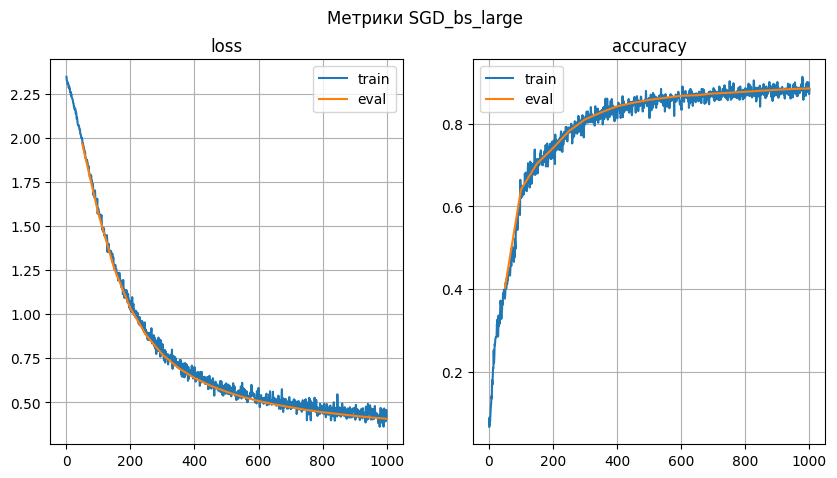

In [52]:
show_metrics(logger.get_stats(), logger.name)

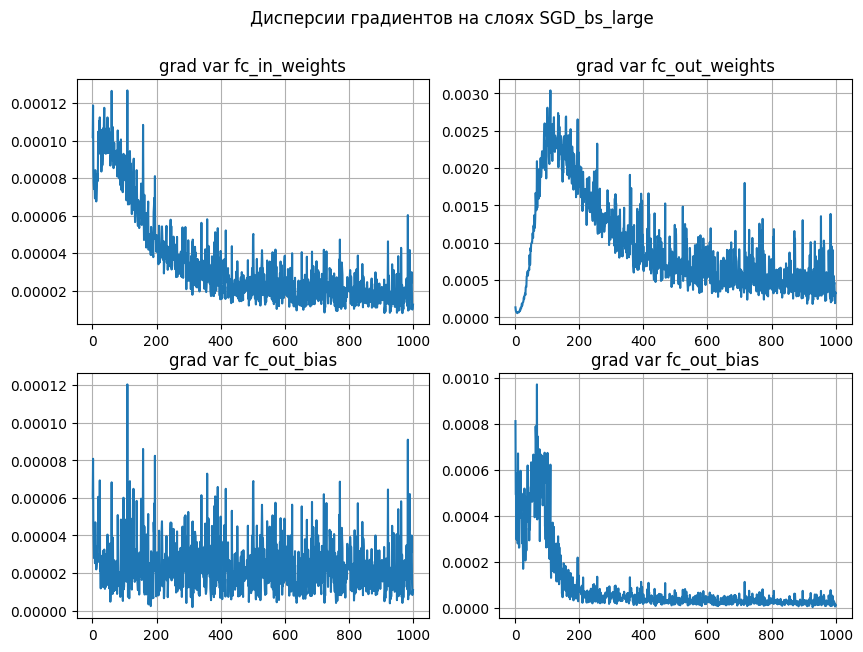

In [53]:
show_grad_variances(logger.get_stats(), logger.name)

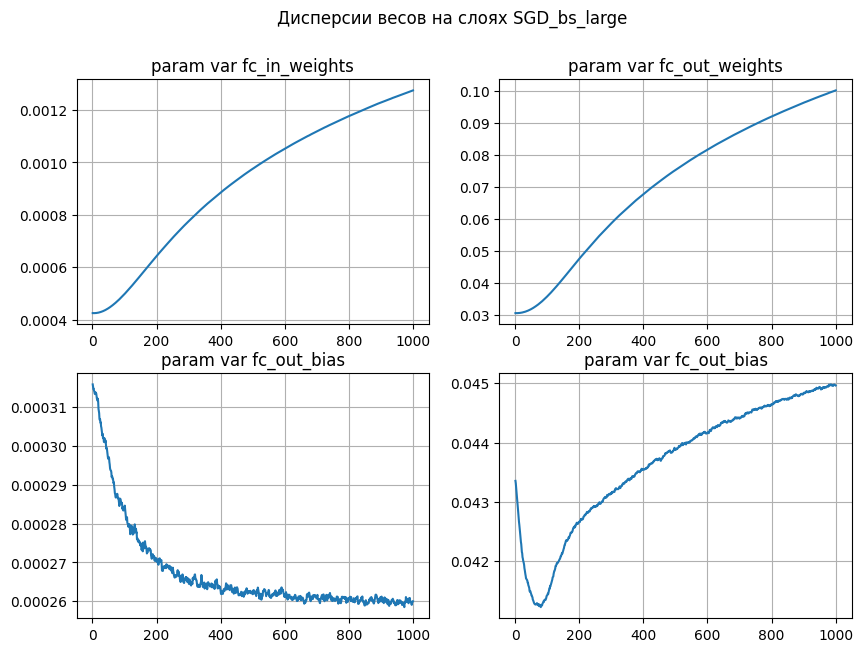

In [54]:
show_weight_variances(logger.get_stats(), logger.name)

**Задание 6. (0.5 баллов)**: получите модель с высокой дисперсией стохастического градиента



In [19]:
set_global_seed(42)
net = MnistClassifier(hidden_dim=10)
loss_fn = loss_fn_constructor(model=net, device=device)
optimizer = optim.SGD(net.parameters(), lr=1e-2)
optimizer_wrapper = WrapperBase(optimizer=optimizer, loss_fn=loss_fn)
train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, drop_last=True)
val_dataloader = DataLoader(test_dataset, batch_size=1024, shuffle=False)
criterion_fn = nn.CrossEntropyLoss(reduction='mean')
set_global_seed(666)

logger = CustomLogger('SGD_bs_large')

train(
    iters_num=1_000,
    net=net,
    optimizer_wrapper=optimizer_wrapper,
    criterion_fn=criterion_fn,
    train_dataloader=train_dataloader,
    valid_dataloader=val_dataloader,
    device=device,
    logger=logger,
    name="SGD_bs_large")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: artem-fm (artem-tm). Use `wandb login --relogin` to force relogin


100%|██████████| 1/1 [00:19<00:00, 19.29s/it]


eval/accuracy,▁▄▂▄▅▆▄▆▇▇▇█▇▆██▇▇██
eval/loss,█▇▆▅▄▃▅▃▂▂▂▁▂▂▁▁▂▂▁▁
grad_var/fc_input.1.bias,▂▅▁▃▁▄▂▃▂▂▄▃▅▂▂▃▃▄▁▁▁▁█▃▄▂▁▃▁▁▂▁▁▁▁▄▁▂▄▂
grad_var/fc_input.1.weight,▂▄▁▃▁▃▃▃▂▂▄▂▅▂▂▃▃▄▁▁▁▁█▃▄▂▁▃▁▁▁▁▁▁▁▄▁▂▄▂
grad_var/fc_out.0.bias,▄█▄▃▃▄▄▃▂▃▃▆▃▂▂▃▃▃▁▁▁▁█▃▃▂▁▂▁▁▁▁▁▂▁▃▁▂▃▁
grad_var/fc_out.0.weight,▁▁▁▁▁▂▂▄▃▃▄▇▄▃▂▃▃▃▂▁▁▁▅▄▃▃▁▃▁▁▃▁▁▃▁█▁▃▄▂
params_var/fc_input.1.bias,▇▇▆▇█▅▅▅▁▂▅▂▆▄▃▄▅▄▄▄▃▃▃▃▄▂▃▂▂▄▅▂▅▅▅▄▃▆▁▄
params_var/fc_input.1.weight,▁▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
params_var/fc_out.0.bias,▇▅▇▆▆▁▂▂▂▃▃▃▄▅▅▅▅▆▇▅▅▇▇▆▇▆▆▇▇███▆██▇▆█▇▇
params_var/fc_out.0.weight,▁▁▁▁▁▁▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇█▇████
train/accuracy,▁▁▅▅▅▁▁▅█▅▅▁▅██▅▅▅████▁▅▅▅███████▅█▅██▅█


При правильной реализации accuracy на тесте будет  ` > 0.74`

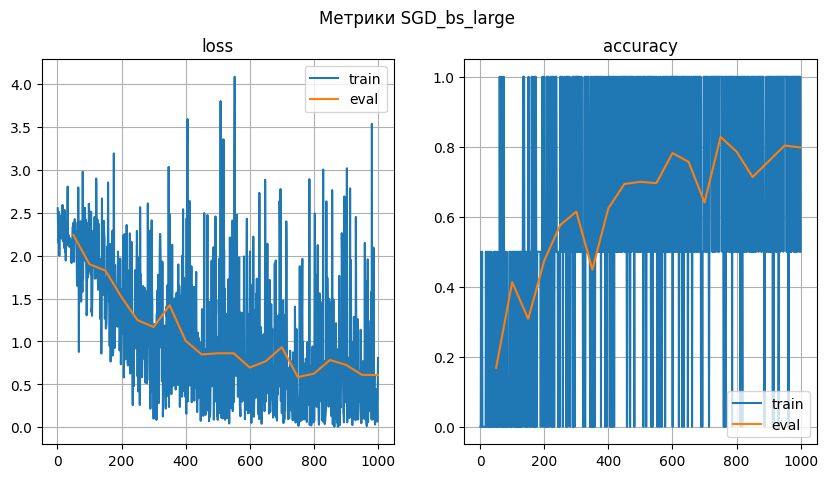

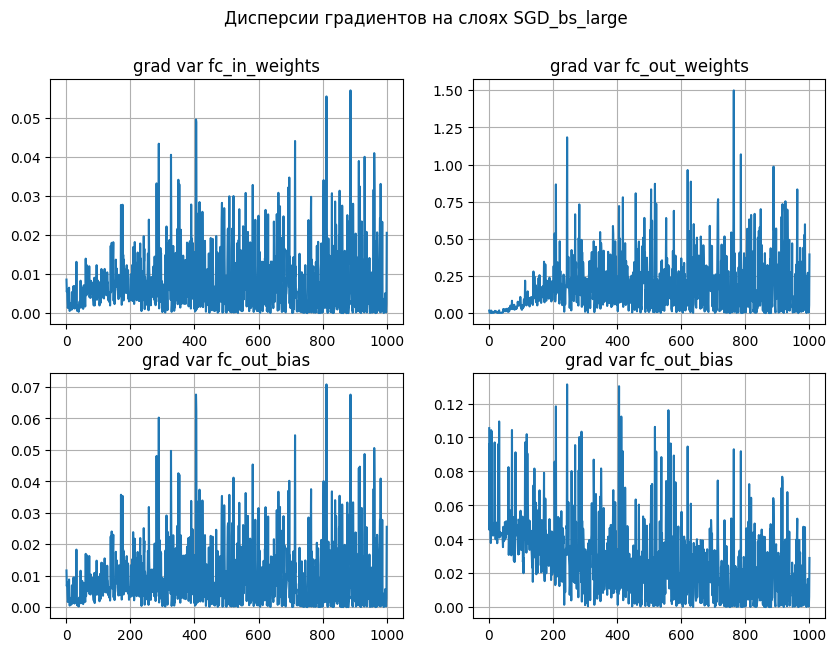

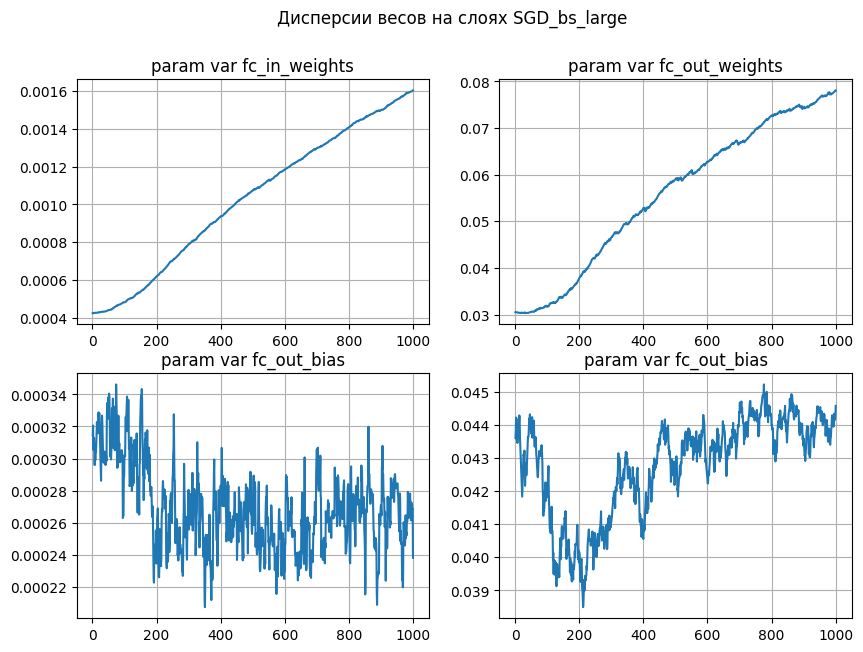

In [21]:
show_metrics(logger.get_stats(), logger.name)
show_grad_variances(logger.get_stats(), logger.name)
show_weight_variances(logger.get_stats(), logger.name)

**Сделайте выводы**: как влияет дисперсия градиента на обучение (loss, accuracy)

Обязательно продемонстрируйте графики, подтверждающие Ваши выводы.


Предпосылки к решению задания: понятным образом размер батча в классическом SGD влияет на сходимость алогритма - чем больше объектов попадают в батс, тем в идеале точнее мы можем оценить направление наискорейшего убывания основного функционала. Потому если мы уменьшим размер батча мы не только получим большее "метание" из стороны в сторону, но и качественные признаки и соотвесвтенные веса на слоях будут получать менее точную информацию для оптимизации по ним (градиент на картах активации будет менее адекватным). Отсюда не только асциляция на графике дисперсии градиентов, но и достижение в разы больших значений дисперсии на весах в отдельных точках (**в сотни раз**).

Из-за этого пострадало и конечное качество на валидации, что стало более ломанным и неустойивым. Теперь алгоритм пытается подстраиваться каждый раз под отдельные пары объектов, а не под всю выборку. 

**Задание 7. (0.1 баллов)**: проверка **SVRG**

Выберите подмножество обучающего датасета, по которому будете считать "честный" градиент. Это может быть либо сам датасет, либо батч размера сильно больше чем батч обучающей выборки.

Убедитесь, что выбранный вами батч не смещен, т.е. присутсвуют все классы в равных пропорциях

In [22]:
import seaborn as sns

<Axes: ylabel='Count'>

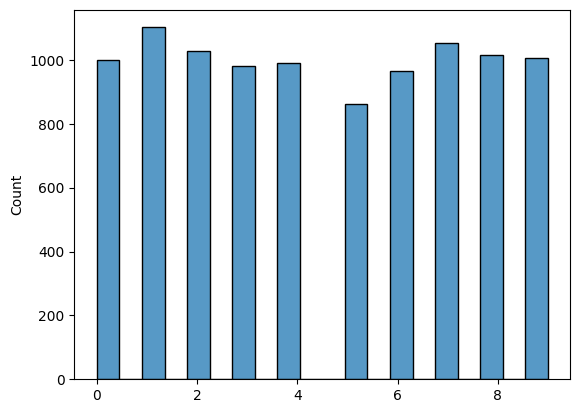

In [24]:
set_global_seed(666)
inds = np.arange(train_dataset.data.shape[0])
np.random.shuffle(inds)


big_data = None
for d in DataLoader(train_dataset, batch_size=60_000, shuffle=True, drop_last=True):
    big_data = [d[0][inds[:10_000]], d[1][inds[:10_000]]]
    
sns.histplot(big_data[1])

Проверьте корректность вашей реализации **SVRG**, для этого предлагается провести следующий эксперимент:

Если выбрать `S = 1`, то ожидается что обучение станет похожим на градиентный спуск, т.е. траектории обучения похожи на запуск с большим `batch_size`.

Обратите, что функция `step_fn` возвращает значения функций на батче обучающей выборки, т.е. значения достаточно шумные

In [25]:
set_global_seed(42)

net = MnistClassifier(10)
loss_fn = loss_fn_constructor(model=net, device=device)

optimizer = optim.SGD(net.parameters(), lr=1e-2)
optimizer_wrapper = SVRG(optimizer=optimizer, loss_fn=loss_fn, data=big_data, S=1)

train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, drop_last=True)
val_dataloader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

criterion_fn = nn.CrossEntropyLoss(reduction='mean')

In [26]:
set_global_seed(666)

logger = CustomLogger('SVRG_each_step')

train(
    iters_num=1_000,
    net=net,
    optimizer_wrapper=optimizer_wrapper,
    criterion_fn=criterion_fn,
    train_dataloader=train_dataloader,
    valid_dataloader=val_dataloader,
    device=device,
    logger=logger,
    name="SVRG_each_step")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


wandb: Currently logged in as: artem-fm (artem-tm). Use `wandb login --relogin` to force relogin


100%|██████████| 1/1 [00:27<00:00, 27.86s/it]


eval/accuracy,▁▄▅▆▆▇▇▇▇███████████
eval/loss,█▆▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
grad_var/fc_input.1.bias,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_var/fc_input.1.weight,▆██▇▆▅▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_var/fc_out.0.bias,▆▆██▅▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_var/fc_out.0.weight,▁▂▅▇██▇▆▆▅▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
params_var/fc_input.1.bias,█▆▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
params_var/fc_input.1.weight,▁▁▁▁▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇██████
params_var/fc_out.0.bias,▄▂▁▁▁▂▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████
params_var/fc_out.0.weight,▁▁▁▁▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇██████
train/accuracy,▅▁▅▅▅▅▅█████▅██▅█▅████▁▅███████████▅██▅█


При правильной реализации accuracy на тесте будет  `∼0.88`

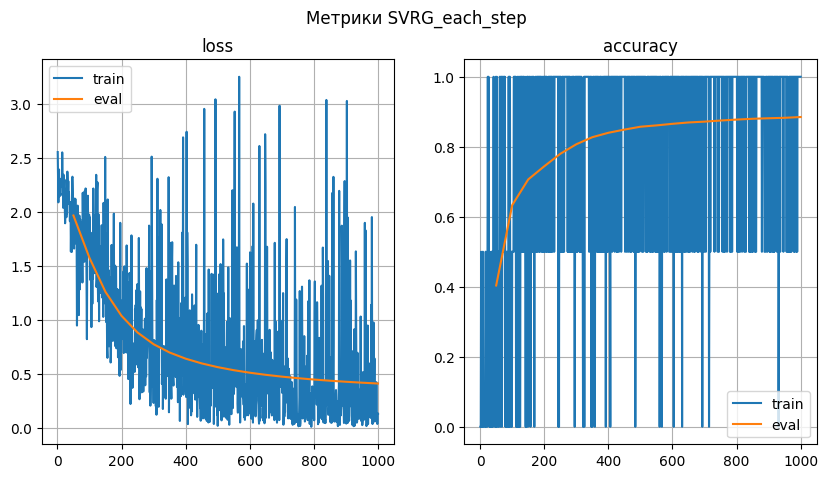

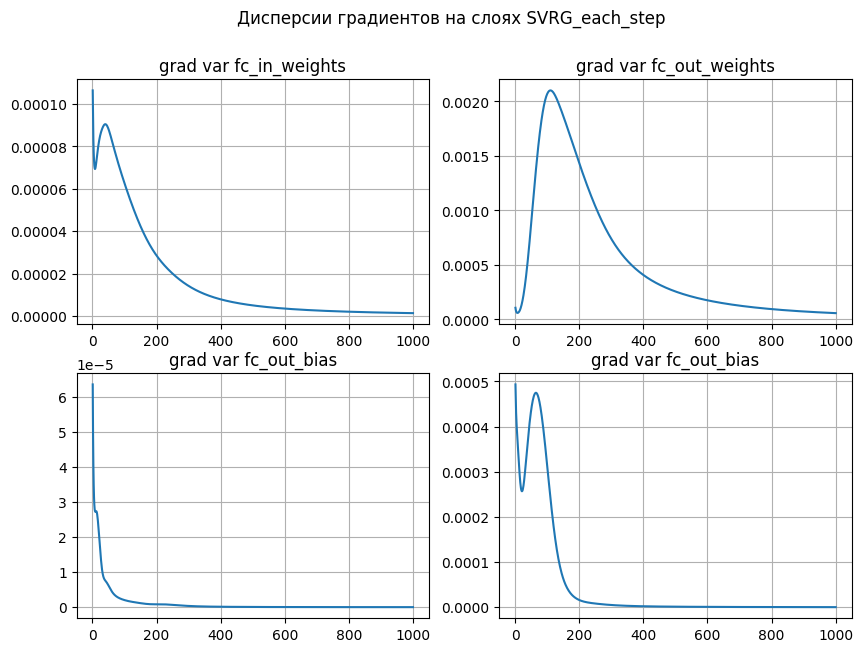

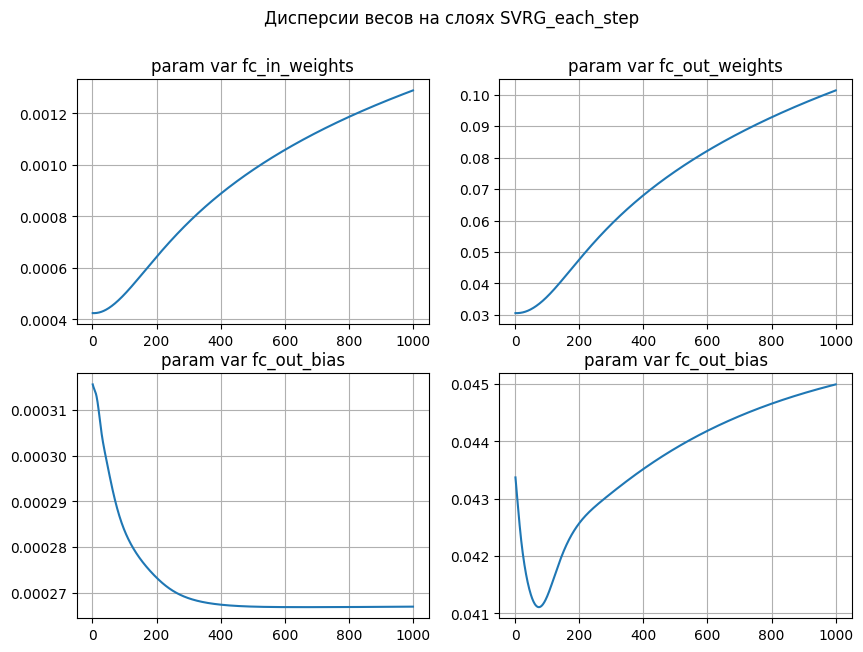

In [27]:
show_metrics(logger.get_stats(), logger.name)
show_grad_variances(logger.get_stats(), logger.name)
show_weight_variances(logger.get_stats(), logger.name)

На этот раз попробуем искать глобальный градиент намного реже, а батч увеличим до 20

In [29]:
set_global_seed(42)

net = MnistClassifier(10)
loss_fn = loss_fn_constructor(model=net, device=device)

optimizer = optim.SGD(net.parameters(), lr=1e-2)
optimizer_wrapper = SVRG(optimizer=optimizer, loss_fn=loss_fn, data=big_data, S=50)

train_dataloader = DataLoader(train_dataset, batch_size=24, shuffle=True, drop_last=True)
val_dataloader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

criterion_fn = nn.CrossEntropyLoss(reduction='mean')

In [30]:
set_global_seed(666)

logger = CustomLogger('SVRG_real')

train(
    iters_num=1_000,
    net=net,
    optimizer_wrapper=optimizer_wrapper,
    criterion_fn=criterion_fn,
    train_dataloader=train_dataloader,
    valid_dataloader=val_dataloader,
    device=device,
    logger=logger,
    name="SVRG_real")

100%|██████████| 1/1 [00:22<00:00, 22.92s/it]


eval/accuracy,▁▄▅▆▆▇▇▇▇███████████
eval/loss,█▆▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
grad_var/fc_input.1.bias,▃█▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_var/fc_input.1.weight,▄█▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_var/fc_out.0.bias,▆▅▇█▄▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_var/fc_out.0.weight,▁▅▅▇██▇▇▅▅▄▄▃▃▃▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
params_var/fc_input.1.bias,█▆▅▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
params_var/fc_input.1.weight,▁▁▁▁▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇██████
params_var/fc_out.0.bias,▄▂▁▁▁▂▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇███████
params_var/fc_out.0.weight,▁▁▁▁▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇██████
train/accuracy,▁▃▃▅▄▅▅▆▇▆▇▆▇▇█▆▇▇█▇▆▇▇▇▇▇▇▇▇▆█▆█▆█▇▇▇▇█


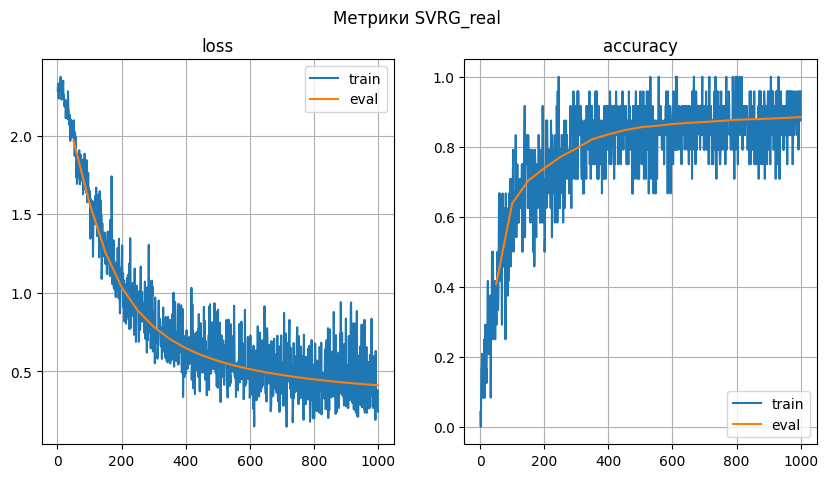

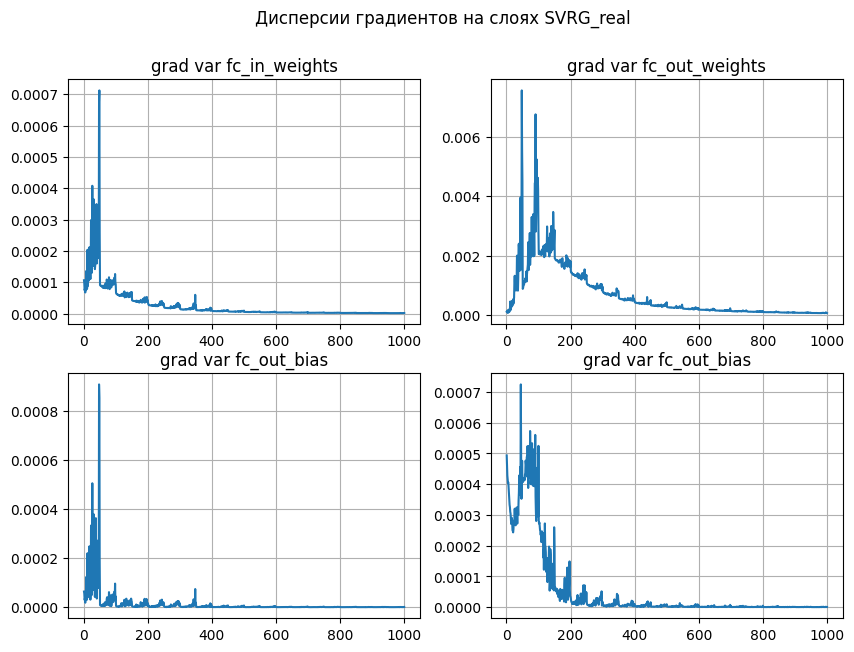

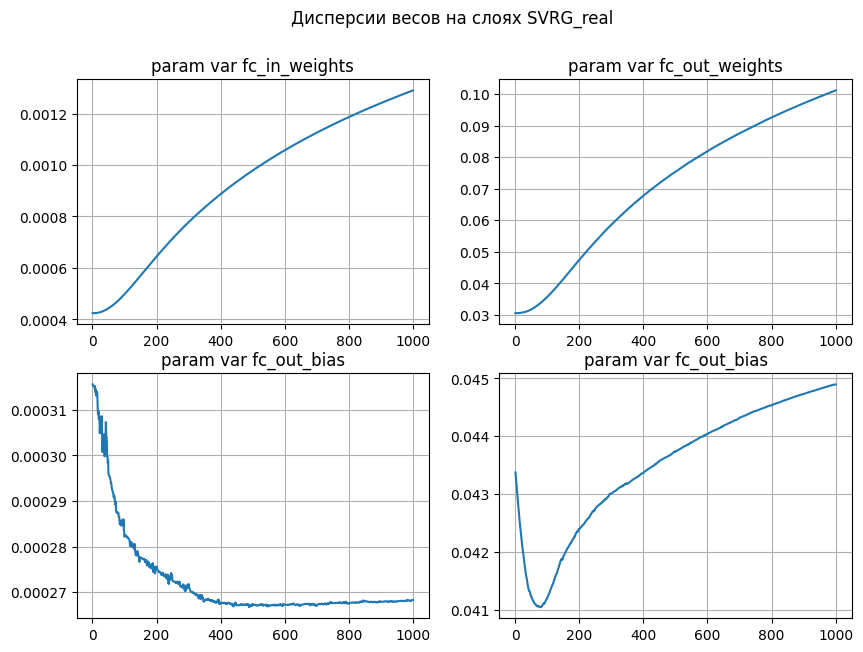

In [31]:
show_metrics(logger.get_stats(), logger.name)
show_grad_variances(logger.get_stats(), logger.name)
show_weight_variances(logger.get_stats(), logger.name)

Насколько согласована реально полученная картина с ожиданиями? Сделайте выводы.

**Выводы**: SVRG является методом понижения дисперсии градиента, что напрямую должно повлиять на скорость сходимости алгоритма, конечный оптимум а так же на "устойчивость" и "гладкость" траектории решения. Фактически, мы в теории даже при существенном уменьшении батча должны получить прирост в качестве по выше описаннм пунктам. Так и произошло!

Лучше сравнивать по более вероятной картине работы, а именно по второму примеру, где мы так же видим серьезное улучшение относительно SGD в дисперсиях градиентов. Однако то же нельзя сказать относительно метрик качества: на SGD даже при обучении график более "гладкий" нежели на SVRG, что говрит об особенности учета предыдущего созраненного состояния. Подробнее об этом далее
    

**Задание 8. (1 балл)**: Эксперименты (если у вас 1 запуск занимает 1 минуту, то секция должна выполняться не более 16 минут)

Запуск будет считаться **корректным** если соблюдаются следующие правила:

1) Выберите подмножество обучающей выборки `data`, по которому будете считать честный градиент.

2) Так как цель метода, без особой вычислительной нагрузки уменьшить дисперсию, то выбирать размер `data` и `S` нужно брать разумными. Разумным считаются такие параметры, при которых количество подсчетов градиентов от элемента выборки во время обучения увеличиться не более чем в 3 раза.


Пример **НЕ** правильного подбора:

`batch_size = 2`

`len(data) = 50000`

`S = 1`


Каждая итерация обучения в среднем будет делать `50002` подсчетов градиента, вместо 2

Пример разумного подбора:

`batch_size = 2`

`len(data) = 256`

`S = 100`

Каждая итерация обучения в среднем будет делать `4.56` подсчетов градиента, вместо 2

**Важно**: правила можно нарушать для проверки и демонстрации граничных случаев, но базовые эксперименты все равно должны быть продемонстрированы

Цель эксперимента:

Продемонстровать как меняется обучение от размера `data` и параметра `S`.

Необходимы минимум перебора параметров:

$S = 100, 300, 500$

$len(data) = 256$ и любой на ваше усмотрение, который согласуется с правилами выше.


Минимальные показатели, по которым должны быть сделаны выводы:

1) Лучший показатели accuracy, loss на валидации

2) Поведение графиков на валидации и обучении

3) Дисперсия стохастического градиента

4) Время обучение модели

5) Максимальная занятая память (wandb логирует)

6) Среднее число подсчетов градиентов на одной итерации обучения (за 1 подсчет считается вызов от 1 элемента выборки) (Формула выше в примерах описана)


Без учета поведения дисперсии стохастического градиента задание не будет засчитано!


**Важно**: не обязательно делать комбинаторный перебор, обычно достаточно более разумного подбора параметров


**Важно**: Вы можете менять все функции если вам необхдимо, главное чтобы работало

**ОБЯЗАТЕЛЬНО НУЖНО ПРИКРЕПИТЬ ГРАФИКИ В НОУТБУК, НЕ ССЫЛКУ**


**ОЧЕНЬ ОЧЕНЬ ВАЖНО**: Все результаты должны сравниваться с обученными раннее моделями baseline. И делать выводы учитывая их. Нельзя исследовать метод в вакуме без хороших примеров для сравнения!

In [ ]:
stats = {}

for S in [100, 300, 400, 500]:
    for n in [128, 256, 512]:
        set_global_seed(42)
        inds = np.arange(train_dataset.data.shape[0])
        np.random.shuffle(inds)
        big_data = None
        for d in DataLoader(train_dataset, batch_size=60_000, shuffle=True, drop_last=True):
            big_data = [d[0][inds[:n]], d[1][inds[:n]]]
        net = MnistClassifier(10)
        loss_fn = loss_fn_constructor(model=net, device=device)
        optimizer = optim.SGD(net.parameters(), lr=1e-2)
        optimizer_wrapper = SVRG(optimizer=optimizer, loss_fn=loss_fn, data=big_data, S=S)
        train_dataloader = DataLoader(train_dataset, batch_size=24, shuffle=True, drop_last=True)
        val_dataloader = DataLoader(test_dataset, batch_size=1024, shuffle=False)
        criterion_fn = nn.CrossEntropyLoss(reduction='mean')
            
        set_global_seed(666)
        logger = CustomLogger(f'SVRG_exp {S=}, {n=}')
        train(
            iters_num=2_000,
            net=net,
            optimizer_wrapper=optimizer_wrapper,
            criterion_fn=criterion_fn,
            train_dataloader=train_dataloader,
            valid_dataloader=val_dataloader,
            device=device,
            logger=logger,
            name=f'SVRG_exp {S=}, {n=}')

        stats[(S, n)] = logger

Для начала рассмотрим конечные результаты алгоритмов. Так как все алгоритмы проходили одинаковое число итераций это одна из самых главных характеристик для настоящих ML-engineer

In [52]:
from tabulate import tabulate
final_stats = {}

for keys, values in stats.items():
    losses = values.get_stats()['eval/loss']
    accuracys = values.get_stats()['eval/accuracy']
    final_stats[keys] = (losses[-1][0], accuracys[-1][0])
    
print('Левое число - конечный loss, правое число - конечный accuracy')
print(tabulate(
    [[f'{n}'] + [f'{final_stats[s, n][0]:0.3f}/{final_stats[s, n][1]:0.3f}' for s in  [100, 300, 400, 500]] for n in [128, 256, 512]],
    headers=['len(data)\S'] + [100, 300, 400, 500],
    tablefmt="rounded_grid",
    colalign=("center", "center", "center", "center", "center")
))

Левое число - конечный loss, правое число - конечный accuracy
╭───────────────┬─────────────┬─────────────┬─────────────┬─────────────╮
│  len(data)\S  │     100     │     300     │     400     │     500     │
├───────────────┼─────────────┼─────────────┼─────────────┼─────────────┤
│      128      │ 0.750/0.774 │ 0.656/0.798 │ 0.705/0.789 │ 0.874/0.750 │
├───────────────┼─────────────┼─────────────┼─────────────┼─────────────┤
│      256      │ 0.655/0.801 │ 0.584/0.823 │ 0.557/0.829 │ 0.542/0.836 │
├───────────────┼─────────────┼─────────────┼─────────────┼─────────────┤
│      512      │ 0.493/0.858 │ 0.466/0.864 │ 0.453/0.866 │ 0.446/0.868 │
╰───────────────┴─────────────┴─────────────┴─────────────┴─────────────╯


**Выводы:** Если учитывать, что в наших интересах видеть loss как можно меньше, а accuracy как можно больше, то по таблице можно сразу получить несколько важных наблюдений:
* С ростом числа объектов, попадающих в big_data на S шагах, качество модели относительно метрик качества становится ощутимо выше
* Однако с увеличение числа операций S между высчитываниями оценки глобального градиента не так сильно влияет на конечное качество алгоритма. 

Последние наблюдение очень интересно в том плане, что все модели вышли на плато по качеству, каждая достигла предела и остается возле него до конца обучения. Потому можно сделать выводы, что не всегда постоянное использование оценки градиента может привести к чему-то хорошему. 

> Стоит задуматься, а почему так? Во-первых, что сразу приходит в голову, это испорченность данных в big_data. Это объяснимо тем, что объекты, попавшие туда, смогли наоборот увести модель от нужного оптимума. Однако это мало вероятно, так как с ростом S качество не падает критичесским образом. С другой стороны может показаться, что неэффективность исходит из того, что иногда стоит подольше подержать одну и ту же оценку, чтобы алгоритм сильнее выходил из локальных ям.

Теперь посмотрим на изменение метрик в процессе обучения

In [54]:
metrics = {}
for keys, values in stats.items():
    metrics[keys] = {
        'loss_train': [[v[0] for v in values.get_stats()['train/loss']], [v[1] for v in values.get_stats()['train/loss']]],
        'loss_eval': [[v[0] for v in values.get_stats()['eval/loss']], [v[1] for v in values.get_stats()['eval/loss']]],
        'acc_train':  [[v[0] for v in values.get_stats()['train/accuracy']], [v[1] for v in  values.get_stats()['train/accuracy']]],
        'acc_eval': [[v[0] for v in values.get_stats()['eval/accuracy']], [v[1] for v in  values.get_stats()['eval/accuracy']]]
    }

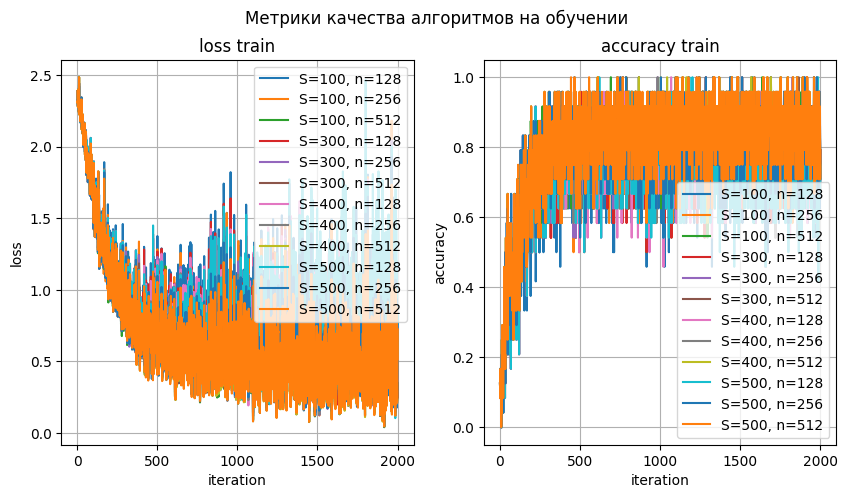

In [58]:
fig, axis = plt.subplots(1, 2)
fig.set_figwidth(10)
fig.set_figheight(5)
fig.suptitle(f'Метрики качества алгоритмов на обучении')

for keys, values in metrics.items():
    S = keys[0]; n = keys[1]
    
    axis[0].set_title('loss train')
    axis[0].plot(values['loss_train'][1], values['loss_train'][0], label=f'{S=}, {n=}')
    axis[0].grid(True)
    axis[0].set_xlabel('iteration')
    axis[0].set_ylabel('loss')

    axis[1].set_title('accuracy train')
    axis[1].plot(values['acc_train'][1], values['acc_train'][0], label=f'{S=}, {n=}')
    axis[1].grid(True)
    axis[1].set_xlabel('iteration')
    axis[1].set_ylabel('accuracy')

    axis[0].legend(); axis[1].legend()

Очень интересная картина. Правда ничего не понятно. Потому давайте для удобства возьмем 5 самых интересных алгоритма

In [102]:
mask = [(100, 128), (500, 128), (300, 256), (400, 256), (500, 512)]

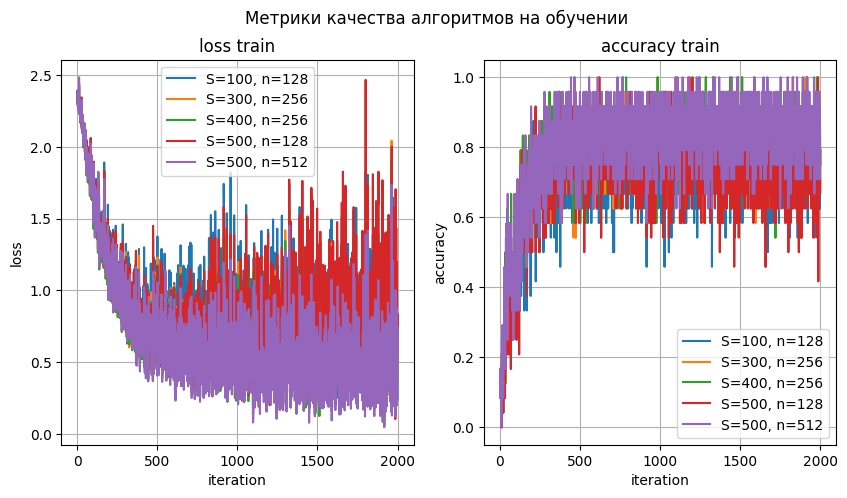

In [103]:
fig, axis = plt.subplots(1, 2)
fig.set_figwidth(10)
fig.set_figheight(5)
fig.suptitle(f'Метрики качества алгоритмов на обучении')

for keys, values in metrics.items():
    if keys not in mask:
        continue
    
    S = keys[0]; n = keys[1]
    
    axis[0].set_title('loss train')
    axis[0].plot(values['loss_train'][1], values['loss_train'][0], label=f'{S=}, {n=}')
    axis[0].grid(True)
    axis[0].set_xlabel('iteration')
    axis[0].set_ylabel('loss')

    axis[1].set_title('accuracy train')
    axis[1].plot(values['acc_train'][1], values['acc_train'][0], label=f'{S=}, {n=}')
    axis[1].grid(True)
    axis[1].set_xlabel('iteration')
    axis[1].set_ylabel('accuracy')

    axis[0].legend(); axis[1].legend()

Стало лучше. По крайней мере мы можем сказать, что с ростом числа растет и дисперсия значений метрик

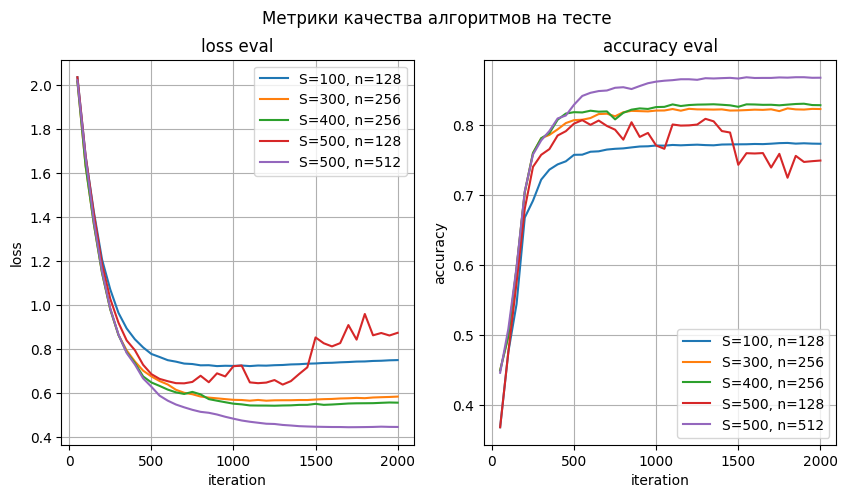

In [104]:
fig, axis = plt.subplots(1, 2)
fig.set_figwidth(10)
fig.set_figheight(5)
fig.suptitle(f'Метрики качества алгоритмов на тесте')

for keys, values in metrics.items():
    if keys not in mask:
        continue
    
    S = keys[0]; n = keys[1]
    
    axis[0].set_title('loss eval')
    axis[0].plot(values['loss_eval'][1], values['loss_eval'][0], label=f'{S=}, {n=}')
    axis[0].grid(True)
    axis[0].set_xlabel('iteration')
    axis[0].set_ylabel('loss')

    axis[1].set_title('accuracy eval')
    axis[1].plot(values['acc_eval'][1], values['acc_eval'][0], label=f'{S=}, {n=}')
    axis[1].grid(True)
    axis[1].set_xlabel('iteration')
    axis[1].set_ylabel('accuracy')

    axis[0].legend(); axis[1].legend()

**Выводы:** Самое главное, что нужно увидеть, это поведение графика **(S=500, n=128)**. При малом числе объектов в big_data у него так же присутсвует самое медленное обновление: раз в 500 итераций. А потому мы можем сразу предположить, что ухудшение связано с накоплением ошибки: плохо приближенная по малой подвыборке объектов оценка градиента, не обновляющаяся слишком долго, принесла лишь больше вреда. Вместе с тем при большом числе объектов в big_data медленное обновление градиента способно пойти алгоритму только на пользу, так как ведет его лучше в зону оптимума.

Однако для всех данных алгоритмов график результатов много более зашумлен, чем таковой для SGD, что говорит о утягивании алгоритма в сторону оптимизации батча как если бы он подсчитывался на оценочной big_data выборке. Тем не менее при правильном подборе параметров мы полчаем более стремителную сходимость к оптимуму нежели чем для SGD. Относительно первой модели на SVRG с **S=1** и батчем в 2 объекта заметна большая устойчивость метрик, меньшая зашумленность за счет увеличения батчей.

Теперь сравним дисперсию весов алгоритмов:

In [105]:
weight_vars = {}
for keys, values in stats.items():
    weight_vars[keys] = {
        'fc_in_weight': [[v[0] for v in values.get_stats()['params_var/fc_input.1.weight']], [v[1] for v in values.get_stats()['params_var/fc_input.1.weight']]],
        'fc_out_weight': [[v[0] for v in values.get_stats()['params_var/fc_out.0.weight']], [v[1] for v in values.get_stats()['params_var/fc_out.0.weight']]],
        'fc_in_bias':  [[v[0] for v in values.get_stats()['params_var/fc_input.1.bias']], [v[1] for v in  values.get_stats()['params_var/fc_input.1.bias']]],
        'fc_out_bias': [[v[0] for v in values.get_stats()['params_var/fc_out.0.bias']], [v[1] for v in  values.get_stats()['params_var/fc_out.0.bias']]]
    }

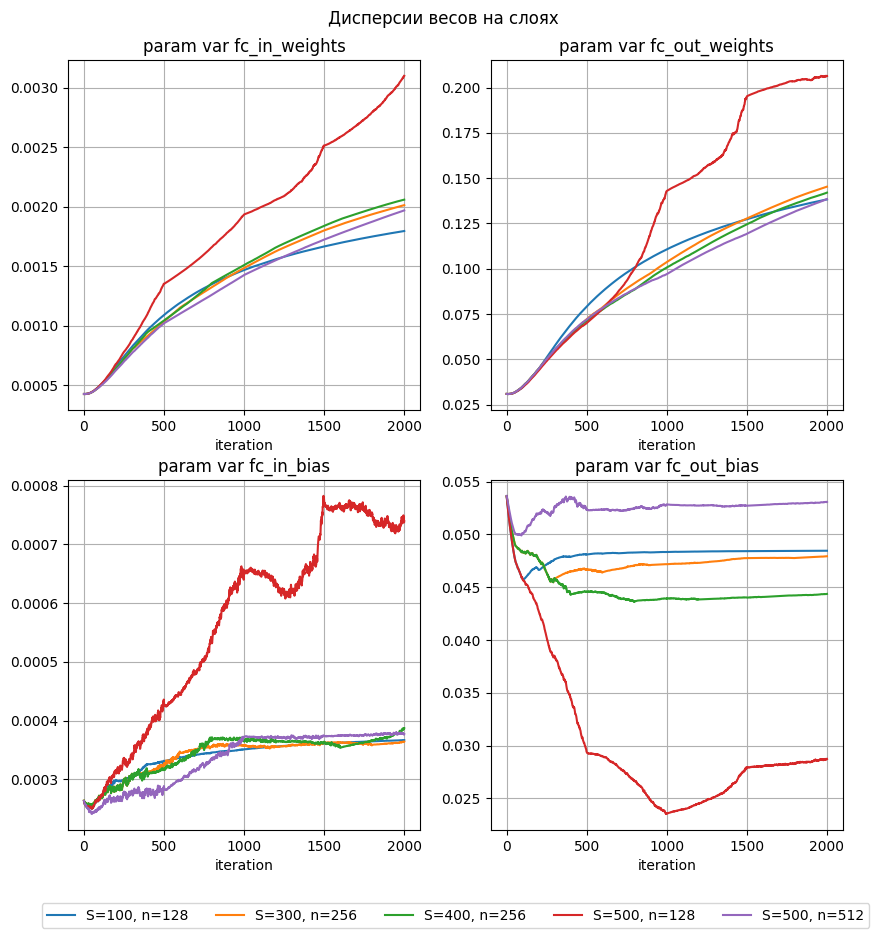

In [110]:
fig, axis = plt.subplots(2, 2)
fig.set_figwidth(10)
fig.set_figheight(10)
title = fig.suptitle(f'Дисперсии весов на слоях')
title = title.set_position([.5, 0.93])

for keys, values in weight_vars.items():
    if keys not in mask:
        continue
    
    S = keys[0]; n = keys[1]
    
    axis[0][0].set_title('param var fc_in_weights')
    axis[0][0].plot(values['fc_in_weight'][1], values['fc_in_weight'][0], label=f'{S=}, {n=}')
    axis[0][0].grid(True)
    axis[0][0].set_xlabel('iteration')
    
    axis[0][1].set_title('param var fc_out_weights')
    axis[0][1].plot(values['fc_out_weight'][1], values['fc_out_weight'][0], label=f'{S=}, {n=}')
    axis[0][1].grid(True)
    axis[0][1].set_xlabel('iteration')
    
    axis[1][0].set_title('param var fc_in_bias')
    axis[1][0].plot(values['fc_in_bias'][1], values['fc_in_bias'][0], label=f'{S=}, {n=}')
    axis[1][0].grid(True)
    axis[1][0].set_xlabel('iteration')
    
    axis[1][1].set_title('param var fc_out_bias')
    axis[1][1].plot(values['fc_out_bias'][1], values['fc_out_bias'][0], label=f'{S=}, {n=}')
    axis[1][1].grid(True)
    axis[1][1].set_xlabel('iteration')
    
    
    plt.legend(loc='lower center', ncol=5, bbox_to_anchor=(-0.1, -0.3))

**Выводы:** Получили интрепретируемый результат, в особенности после предыдущего пункта. Фактически наши предположения подтвердились, и мы увидели, как сильное различие мужду градиентом на батче в разнице с градиентом на батче относительно весов последней S точки силно варьируется, из-за чего почти везде именно на многострадальном алгоритме **(S=500, n=128)** дисперсии ведут себя хаотично и вообще не похоже на таковые у более успешных алгоритмов. 

По сравнению с предыдущими алгоритмами здесь все гораздо лучше, веса изменяются все постепенно, заметны тренды и даже присутсвуют плато. То, что дисперсия весов приходит в стационарное состояние, говорит о том, что модель постепенно находит оптимум в конце обучения

Теперь же посмотрим на зачинщика этого беспорядка с усилением дисперсии весов, улучшения или даже ухудшения качества модели. Посмотрим на поведение градиентов:

In [107]:
grad_vars = {}
for keys, values in stats.items():
    grad_vars[keys] = {
        'fc_in_weight': [[v[0] for v in values.get_stats()['grad_var/fc_input.1.weight']], [v[1] for v in values.get_stats()['grad_var/fc_input.1.weight']]],
        'fc_out_weight': [[v[0] for v in values.get_stats()['grad_var/fc_out.0.weight']], [v[1] for v in values.get_stats()['grad_var/fc_out.0.weight']]],
        'fc_in_bias':  [[v[0] for v in values.get_stats()['grad_var/fc_input.1.bias']], [v[1] for v in  values.get_stats()['grad_var/fc_input.1.bias']]],
        'fc_out_bias': [[v[0] for v in values.get_stats()['grad_var/fc_out.0.bias']], [v[1] for v in  values.get_stats()['grad_var/fc_out.0.bias']]]
    }

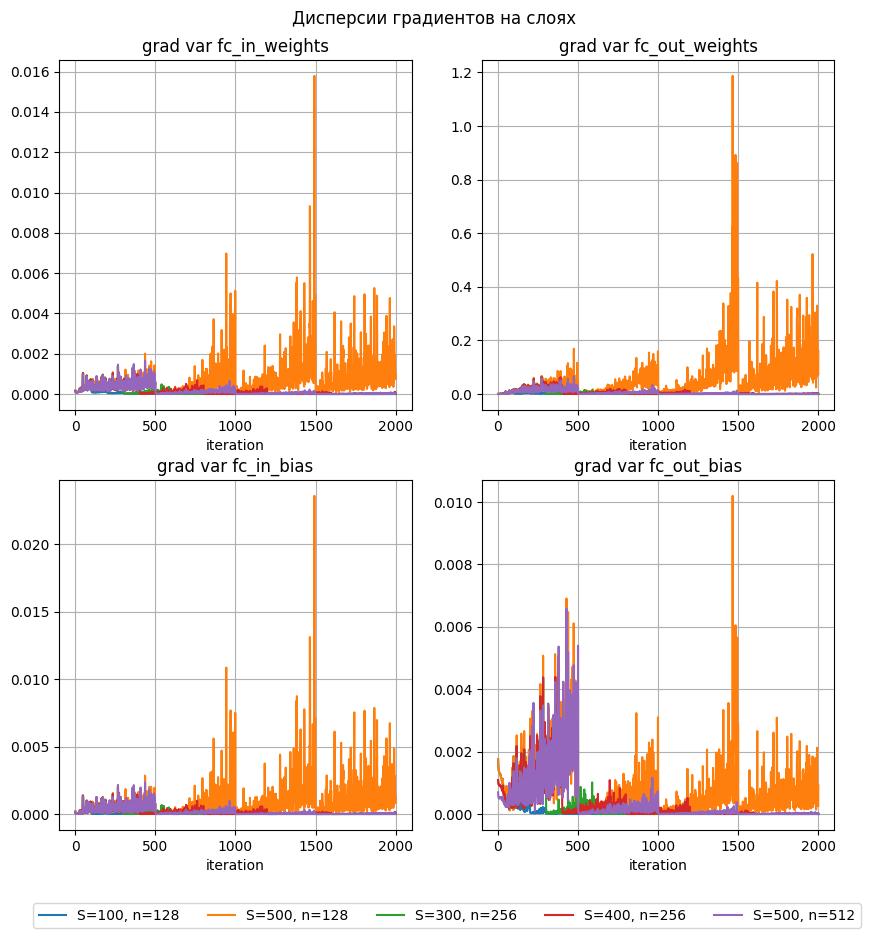

In [109]:
fig, axis = plt.subplots(2, 2)
fig.set_figwidth(10)
fig.set_figheight(10)
title = fig.suptitle(f'Дисперсии градиентов на слоях')
title = title.set_position([.5, 0.93])

for key in mask:
    values = grad_vars[key]
    S = key[0]; n = key[1]
    
    axis[0][0].set_title('grad var fc_in_weights')
    axis[0][0].plot(values['fc_in_weight'][1], values['fc_in_weight'][0], label=f'{S=}, {n=}')
    axis[0][0].grid(True)
    axis[0][0].set_xlabel('iteration')
    
    axis[0][1].set_title('grad var fc_out_weights')
    axis[0][1].plot(values['fc_out_weight'][1], values['fc_out_weight'][0], label=f'{S=}, {n=}')
    axis[0][1].grid(True)
    axis[0][1].set_xlabel('iteration')
    
    axis[1][0].set_title('grad var fc_in_bias')
    axis[1][0].plot(values['fc_in_bias'][1], values['fc_in_bias'][0], label=f'{S=}, {n=}')
    axis[1][0].grid(True)
    axis[1][0].set_xlabel('iteration')
    
    axis[1][1].set_title('grad var fc_out_bias')
    axis[1][1].plot(values['fc_out_bias'][1], values['fc_out_bias'][0], label=f'{S=}, {n=}')
    axis[1][1].grid(True)
    axis[1][1].set_xlabel('iteration')
    
    
    plt.legend(loc='lower center', ncol=5, bbox_to_anchor=(-0.1, -0.3))

**Выводы:** Сперва просто сделаем наиболее важные наблюдения:

* Мы видим самые большие дисперсии градиентов у того самого алгоритма **(S=500, n=128)**, что на самом деле неудивительно. Причины уже были названы, мы же просто упомянем, что это происходит из-за неточности оценки градиента из-за малого объема big_data + крайне редкого обновления оценки в процесе обучения.
* Наименьшие дисперсии наблюдаются даже не у самого удачного алгоритма **(S=500, n=512)**, но у того, что чаще всех обновлялся (с наименьшим n). Видно, что голубой алгоритм имеет наименьшие ординаты, что полностью согласуется с теоритечским предположением.

Потому мы видим, что важной составляющей решения является как подбор **S** так и согласованность его с **n**

Так же крайне заметны скачки дисперсий градиентов, что относятся ко всем тем моментам, когда обновлялась оценка градиента и весов по выборке на big_data. Такое поведение единственное, качественно отличает модели на SVRG от предыдущих baseline, так как за счет этих скачков модель не только способна выбраться из локальных оптимумов, но и быстрее сойтись к глобальному. В остальном в дисперсиях градиентов проглядываются патерны стремления к нулю (кроме соответсвенно **(S=500, n=512)**). 

Теперь посмотрим на прочие характеристики:

In [25]:
import pandas as pd

runtimes = {}
memory = {}
grad_computes = {}

df = pd.read_csv('model_memusage.csv')
for name in df.dtypes.index[1:]:
    if name[-8:] == '_runtime':
        runtimes[name[9:-11]] = df[name][0]
    if name[-30:] == '- system/gpu.0.memoryAllocated':
        memory[name[9:21]] = df[name][0]

for key in stats.keys():
    S=key[0]; n=key[1]
    grad_computes[f'{S=}, {n=}'] = (24 * S + n) / S

In [30]:
from tabulate import tabulate

print('Время, видео память и число подсчетов градиента')
print(tabulate(
    [[key] + [runtimes[key], memory[key], grad_computes[key]] for key in runtimes.keys()],
    headers=['параметры', 'время', 'память gpu %', 'ср. выч. градиента'],
    tablefmt="rounded_grid",
    colalign=("center", "center", "center", "center")
))

Время, видео память и число подсчетов градиента
╭──────────────┬─────────┬────────────────┬──────────────────────╮
│  параметры   │  время  │  память gpu %  │  ср. выч. градиента  │
├──────────────┼─────────┼────────────────┼──────────────────────┤
│ S=500, n=512 │ 47.309  │      11.2      │        25.024        │
├──────────────┼─────────┼────────────────┼──────────────────────┤
│ S=500, n=256 │ 46.5071 │      8.9       │        24.512        │
├──────────────┼─────────┼────────────────┼──────────────────────┤
│ S=500, n=128 │ 51.3754 │      6.86      │        24.256        │
├──────────────┼─────────┼────────────────┼──────────────────────┤
│ S=400, n=512 │ 49.237  │      11.8      │        25.28         │
├──────────────┼─────────┼────────────────┼──────────────────────┤
│ S=400, n=256 │ 49.9115 │      9.3       │        24.64         │
├──────────────┼─────────┼────────────────┼──────────────────────┤
│ S=400, n=128 │ 50.0099 │     11.43      │        24.32         │
├─────────────

Мы получили примерно одинаковые времена работы каждой из моделей. Чего не скажешь о затрачиваемой памяти. Соответсвенно, чем больше выборку для big_data резервировать, тем больше потребуется памяти. А ведь именно эта настройка спсобна в среднем привнести максимальный вклад в конечное хорошее качество

**Бонус 1 (1 баллов)**: Уменьшить максимальное потребление видео памяти (обратить внимание на подсчета большого батча). Продемонстрировать как поменялось время обучение и потребление памяти.

Самая проблемная зона алгоритма находится в подсчете оценки глобального градиента модели. Потому сделаем так, чтобы отведенную выборку не требовалось всегда хранить полностью в памяти

In [95]:
from torch.autograd import Variable

class SVRG_iterable(WrapperBase):
    def __init__(self, optimizer, loss_fn, data, S):
        """
        data - вся выборка или батч большого размера, по которому считается градиент раз в S итераций
        S - параметр указывающий частоту пересчета градиента по всей выборки
        """

        super().__init__(optimizer=optimizer, loss_fn=loss_fn)

        self.data = data
        self.S = S
        self.counter = 0

    def step_fn(self, batch):

        # Обнуление градинетов модели, чтобы не накладывались при следующих вычислениях
        self.zero_grad()

        # Подсчет градиента на батче
        loss_main = self.loss_fn(batch)
        loss_main['loss'].item()
        loss_main['loss'].backward()

        # Сохранение градиентов и весов посчитанных на батче
        curr_params = [par.clone() for par in self.get_param_groups()]
        curr_grads  = [par.grad.clone() for par in self.get_param_groups()]

        # Обнуление градинетов модели, чтобы не накладывались при следующих вычислениях
        self.zero_grad()

        if self.counter == 0:
            self.zero_grad()
            # Подсчет градиента на большом множестве
            sumer = 0
            n = 0
            for dt in zip(*self.data):
                loss = self.loss_fn(dt)
                sumer = sumer + loss['loss'] * len(dt[0])
                n += len(dt[0])
            sumer = sumer / n
            sumer.item()
            sumer.backward()

            # Сохранение градиентов и весов посчитанных на большом батче
            self.large_params = [par.clone() for par in self.get_param_groups()]
            self.large_grads  = [par.grad.clone() for par in self.get_param_groups()]

            # Обнуление градинетов модели, чтобы не накладывались при следующих вычислениях
            self.zero_grad()


        # Установка весов модели (для которой считали градиент на большом батче)
        set_weights(self.get_param_groups(), self.large_params)


        # Подсчет градиента на батче для поправки
        loss = self.loss_fn(batch)
        loss['loss'].item()
        loss['loss'].backward()


        # Сохранение градиентов посчитанных на батче поправки
        params_bias = [par.clone() for par in self.get_param_groups()]
        set_grad(params_bias, self.get_param_groups())
        

        # Востановлние весов и градиентов прошлой модели
        set_weights(self.get_param_groups(), curr_params)
        set_grad(self.get_param_groups(), curr_grads)
        

        for p_main, p_large, p_bias in zip(self.get_param_groups(), self.large_grads, params_bias):

            if p_main.grad is None:
                continue
            
            # Подсчет градиента с поправкаи
            d_p = p_main.grad - p_bias.grad + p_large

            # Подменяем градиенты для оптимизатора
            p_main.grad.data = d_p.detach().clone()

        # Шаг основного оптимизатора с новыми градиентами
        self.step()

        # Обновление счётчика
        self.counter += 1

        if self.counter == self.S:
            self.counter = 0

        return loss_main


In [104]:
set_global_seed(666)
inds = np.arange(train_dataset.data.shape[0])
np.random.shuffle(inds)

big_data_generic = []
big_data_generic_target = []

for i, d in enumerate(DataLoader(train_dataset, batch_size=50, shuffle=True, drop_last=True)):
    if i >= 20:
        break
    big_data_generic.append(d[0])
    big_data_generic_target.append(d[1])
    
big_data_static = torch.cat(big_data_generic, dim=0)
big_data_static_target = torch.cat(big_data_generic_target, dim=0)

Сначала обучим разгруженную модель

In [106]:
set_global_seed(42)

net = MnistClassifier(10)
loss_fn = loss_fn_constructor(model=net, device=device)

optimizer = optim.SGD(net.parameters(), lr=1e-2)
optimizer_wrapper = SVRG_iterable(optimizer=optimizer, loss_fn=loss_fn, data=[big_data_generic, big_data_generic_target], S=250)

train_dataloader = DataLoader(train_dataset, batch_size=24, shuffle=True, drop_last=True)
val_dataloader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

criterion_fn = nn.CrossEntropyLoss(reduction='mean')

In [107]:
set_global_seed(666)

logger_iter = CustomLogger('SVRG_iterable')

train(
    iters_num=1_000,
    net=net,
    optimizer_wrapper=optimizer_wrapper,
    criterion_fn=criterion_fn,
    train_dataloader=train_dataloader,
    valid_dataloader=val_dataloader,
    device=device,
    logger=logger_iter,
    name="SVRG_iterable")

100%|██████████| 1/1 [00:24<00:00, 24.55s/it]


eval/accuracy,▁▅▅▆▇▇▇▇████████████
eval/loss,█▆▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
grad_var/fc_input.1.bias,▂▄▂▂█▂▄▄▆▅▁▁▁▁▂▂▂▁▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_var/fc_input.1.weight,▂▅▄▃█▃▆▅▇▅▁▁▁▁▂▂▂▂▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_var/fc_out.0.bias,▃▂▂▃▃▄▂▂▄█▁▁▁▁▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_var/fc_out.0.weight,▁▁▂▃▄▄▄▅▅█▁▁▁▁▁▁▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
params_var/fc_input.1.bias,█▇▆▄▃▂▃▂▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
params_var/fc_input.1.weight,▁▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇█████
params_var/fc_out.0.bias,█▅▃▂▁▁▂▁▁▁▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇
params_var/fc_out.0.weight,▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇█████
train/accuracy,▁▃▃▆▃▆▅▆▇▆▆▆▇██▆▇▇▇▇▆▇▆▇▇▇▇▇▇▆█▇█▆███▇▇█


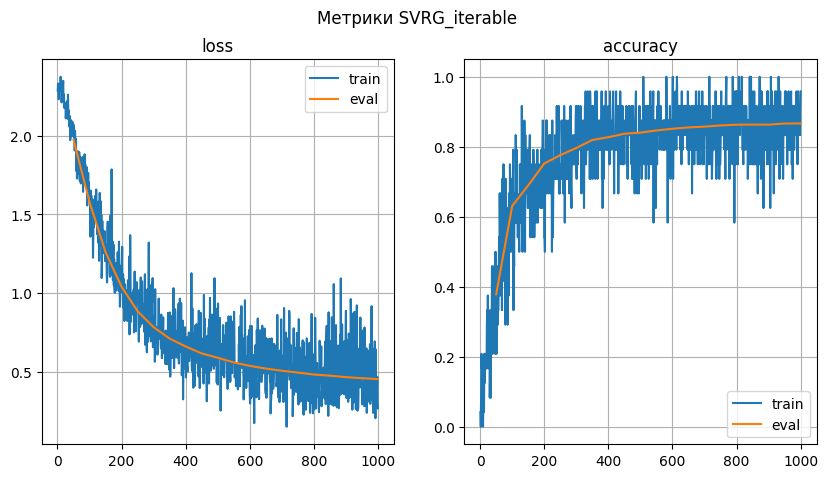

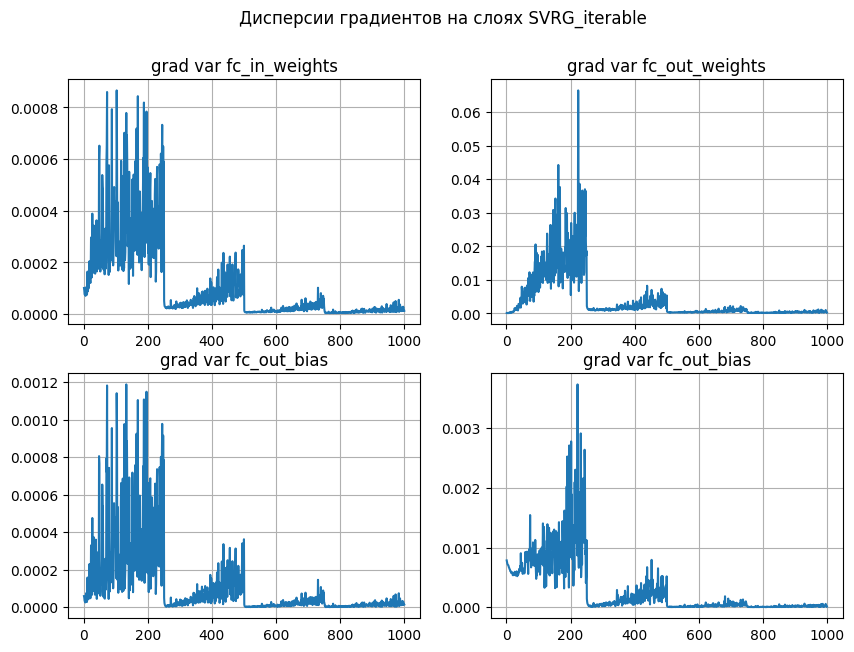

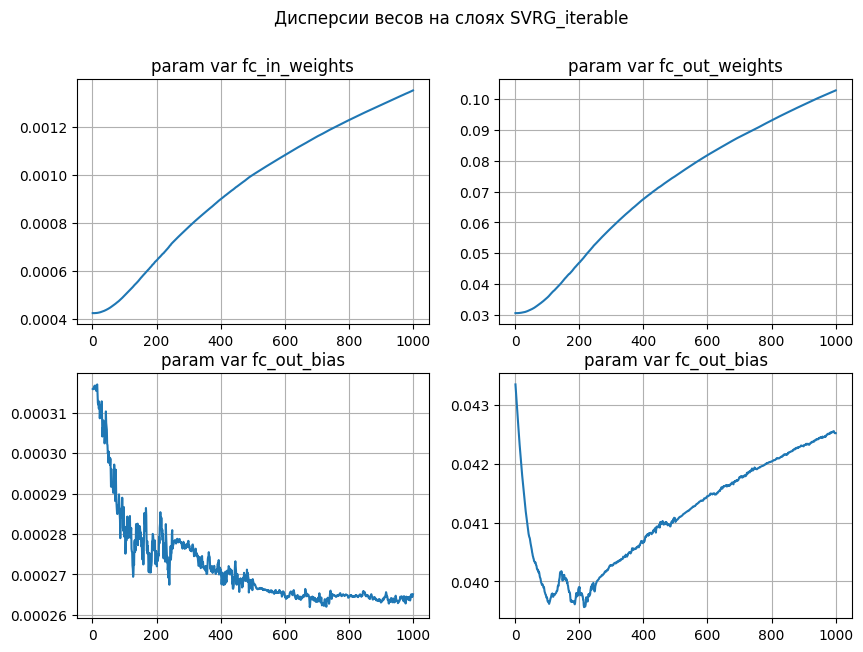

In [108]:
show_metrics(logger_iter.get_stats(), logger_iter.name)
show_grad_variances(logger_iter.get_stats(), logger_iter.name)
show_weight_variances(logger_iter.get_stats(), logger_iter.name)

In [125]:
set_global_seed(42)

net = MnistClassifier(10)
loss_fn = loss_fn_constructor(model=net, device=device)

optimizer = optim.SGD(net.parameters(), lr=1e-2)
optimizer_wrapper = SVRG(optimizer=optimizer, loss_fn=loss_fn, data=[big_data_static, big_data_static_target], S=250)

train_dataloader = DataLoader(train_dataset, batch_size=24, shuffle=True, drop_last=True)
val_dataloader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

criterion_fn = nn.CrossEntropyLoss(reduction='mean')

In [128]:
set_global_seed(666)

logger_stat = CustomLogger('SVRG_static')

train(
    iters_num=1_000,
    net=net,
    optimizer_wrapper=optimizer_wrapper,
    criterion_fn=criterion_fn,
    train_dataloader=train_dataloader,
    valid_dataloader=val_dataloader,
    device=device,
    logger=logger_stat,
    name="SVRG_static")

100%|██████████| 1/1 [00:23<00:00, 23.82s/it]


eval/accuracy,▁▂▂▃▄▃▄▄▅▅▆▇▇▇█▇▇███
eval/loss,█▇▆▆▅▄▄▃▃▃▂▂▂▁▁▁▁▁▁▁
grad_var/fc_input.1.bias,▁▁▂▂▄▄▅▄▃▃▁▁▁▂▂▃▂▃▃█▁▁▁▁▂▂▂▂▂▃▁▁▁▂▂▂▂▂▅▂
grad_var/fc_input.1.weight,▁▂▂▃▅▆▆▅▃▄▁▁▁▂▂▃▂▃▃█▁▁▁▁▂▂▂▂▂▄▁▁▁▂▁▂▂▂▅▂
grad_var/fc_out.0.bias,▁▁▁▂▁▂▂▄▃▅▁▁▁▂▁▁▂▂▂█▁▁▁▂▃▂▂▂▁▂▁▁▁▁▁▂▂▂▄▃
grad_var/fc_out.0.weight,▂▂▂▂▃▅▄▄▃▅▁▂▂▂▂▂▂▂▂█▁▁▁▂▃▂▂▂▁▃▁▁▁▁▁▂▂▂▃▂
params_var/fc_input.1.bias,▂▂▁▃▃▁▃▄▆▆▅▅▆▆▆▅▄▆▆█▇▆▇▆▇▇█▆▇█▇▇█▇█▇█▆▇█
params_var/fc_input.1.weight,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
params_var/fc_out.0.bias,▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇█████
params_var/fc_out.0.weight,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
train/accuracy,▅▆▄▆▃▁▂▂▆▆▇▅▇▆▆▃▆▆▆▆▃▆▄▆▆▅▇▄▅▄▇▅█▂▇▇▇▆▃▇


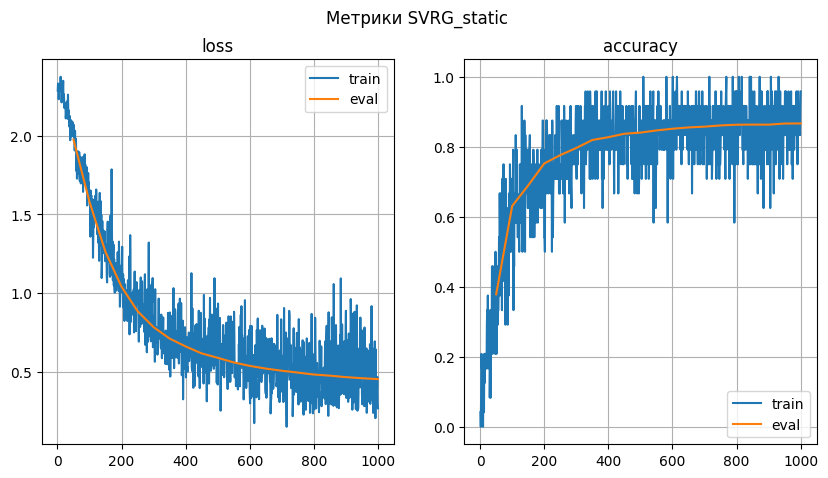

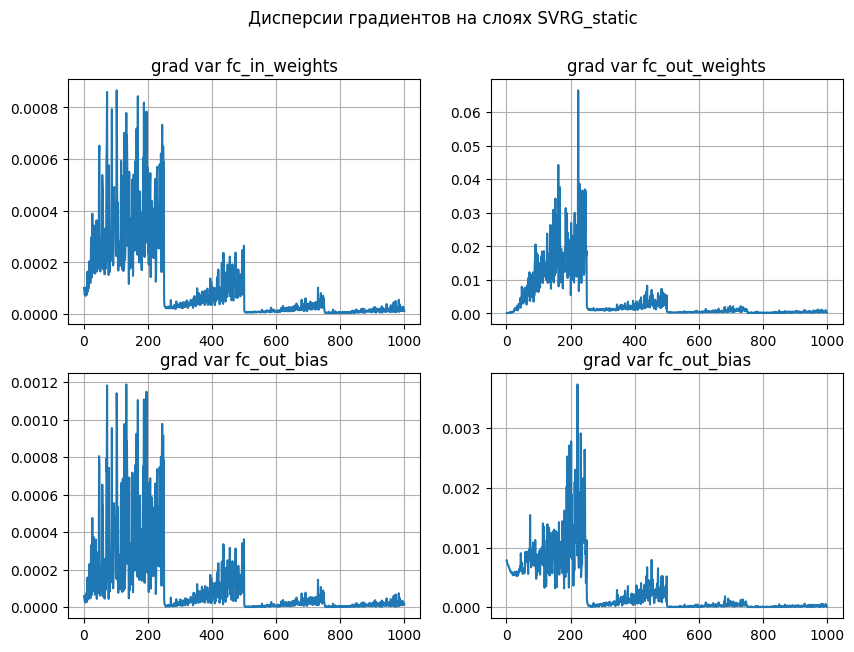

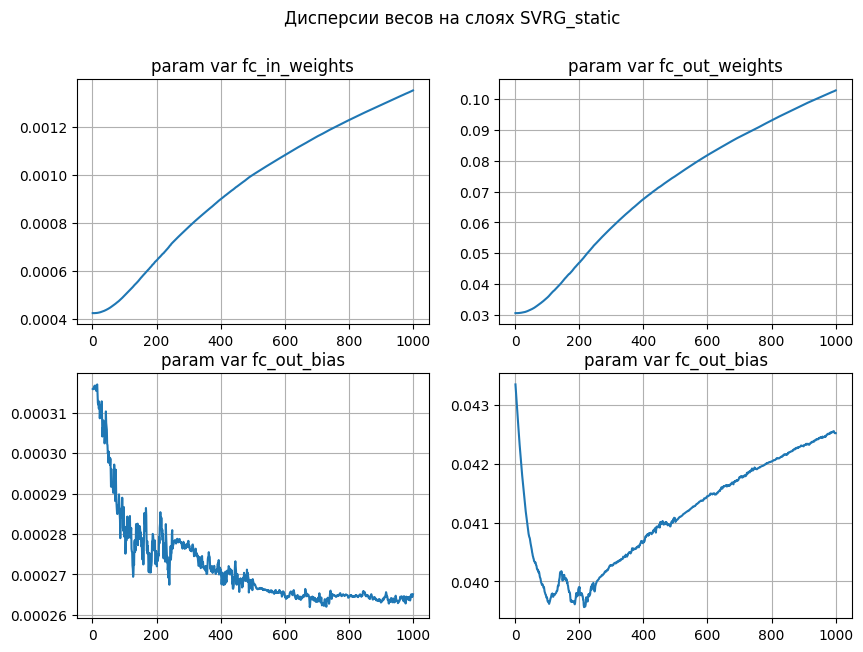

In [127]:
show_metrics(logger_stat.get_stats(), logger_stat.name)
show_grad_variances(logger_stat.get_stats(), logger_stat.name)
show_weight_variances(logger_stat.get_stats(), logger_stat.name)

Можно заметить, что решения буквально идентичны между собой. Посмотрим на статистики времени

Для решения с итерациями по бачу (SVRG_iterable) мы получили следующие значения:

    11.68% GPU памяти аллоцированно
    25.386 сек. на обучение

Для статической модели же данные иные:

    12.19% GPU памяти аллоцированно
    24.921 сек. на обучение

Мы применили подход, при котором объекты из big_data отложенной выборки подгружаются в видео память постепенно, по частям. Это в перспективе может увеличить время обучения модели, но существенно сократить требуемую видео память. Что мы и увидели в данном эксперименте: при одинаковой работе мы видим большее использование памяти у метода без постепенной подгрузки объектов, в то время как для алгоритма с подгрузкой наблюдается малое увеличение по времени обучения

*Было проведено несколько опытов и все показали примерно одинаковые результаты. Поэтому можно считать данное предположение скорее верным и доказанным, нежели просто совпадением*

**Бонус 2 (1.25 баллов)**: Проверить для других оптимизаторов влияние SVRG. При нашей реализации достаточно заменить базовый оптимизатор, на любой другой при создании обёртки. Сравнить сходимость метода и основные показатели

In [25]:
set_global_seed(42)
inds = np.arange(train_dataset.data.shape[0])
np.random.shuffle(inds)
big_data = None
for d in DataLoader(train_dataset, batch_size=60_000, shuffle=True, drop_last=True):
    big_data = [d[0][inds[:512]], d[1][inds[:512]]]

Посторим baseline `SGD`

In [46]:
set_global_seed(42)

net = MnistClassifier(10)
loss_fn = loss_fn_constructor(model=net, device=device)

optimizer = optim.SGD(net.parameters(), lr=1e-2)
optimizer_wrapper = SVRG(optimizer=optimizer, loss_fn=loss_fn, data=big_data, S=400)

train_dataloader = DataLoader(train_dataset, batch_size=24, shuffle=True, drop_last=True)
val_dataloader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

criterion_fn = nn.CrossEntropyLoss(reduction='mean')

In [ ]:
set_global_seed(666)

logger_sgd = CustomLogger('SVRG_sgd')

train(
    iters_num=2_000,
    net=net,
    optimizer_wrapper=optimizer_wrapper,
    criterion_fn=criterion_fn,
    train_dataloader=train_dataloader,
    valid_dataloader=val_dataloader,
    device=device,
    logger=logger_sgd,
    name="SVRG_sgd")

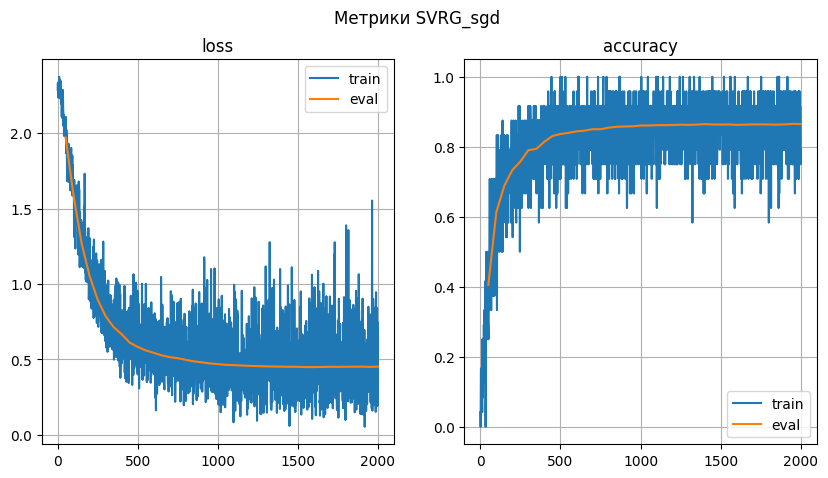

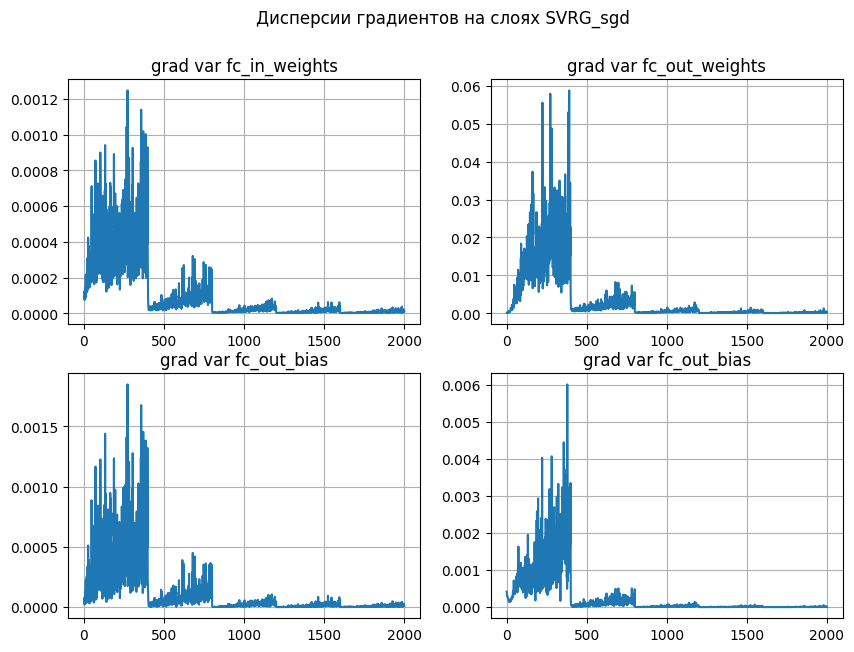

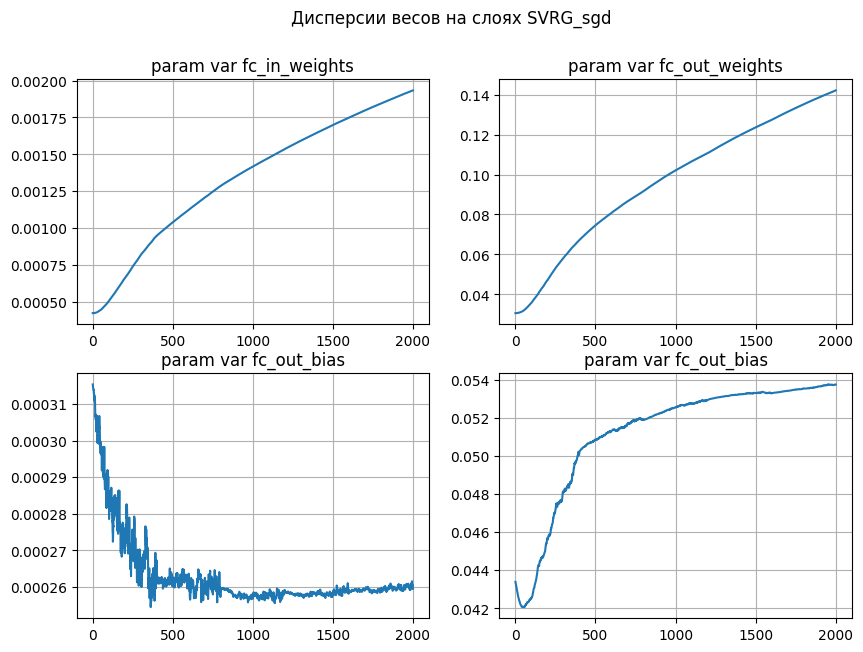

In [48]:
show_metrics(logger_sgd.get_stats(), logger_sgd.name)
show_grad_variances(logger_sgd.get_stats(), logger_sgd.name)
show_weight_variances(logger_sgd.get_stats(), logger_sgd.name)

Применим самый известный среди data скиентистов `Adam`

In [42]:
set_global_seed(42)

net = MnistClassifier(10)
loss_fn = loss_fn_constructor(model=net, device=device)

optimizer = optim.Adam(net.parameters(), lr=1e-2)
optimizer_wrapper = SVRG(optimizer=optimizer, loss_fn=loss_fn, data=big_data, S=400)

train_dataloader = DataLoader(train_dataset, batch_size=24, shuffle=True, drop_last=True)
val_dataloader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

criterion_fn = nn.CrossEntropyLoss(reduction='mean')

In [ ]:
set_global_seed(666)

logger_adam = CustomLogger('SVRG_adam')

train(
    iters_num=2_000,
    net=net,
    optimizer_wrapper=optimizer_wrapper,
    criterion_fn=criterion_fn,
    train_dataloader=train_dataloader,
    valid_dataloader=val_dataloader,
    device=device,
    logger=logger_adam,
    name="SVRG_adam")

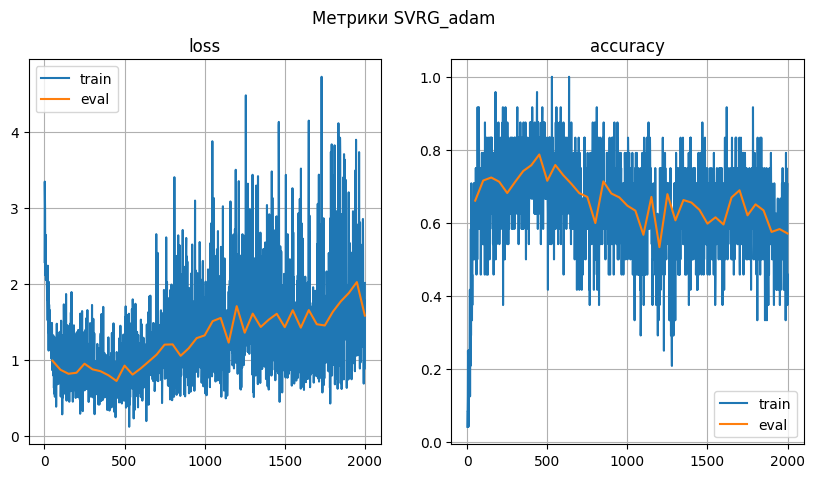

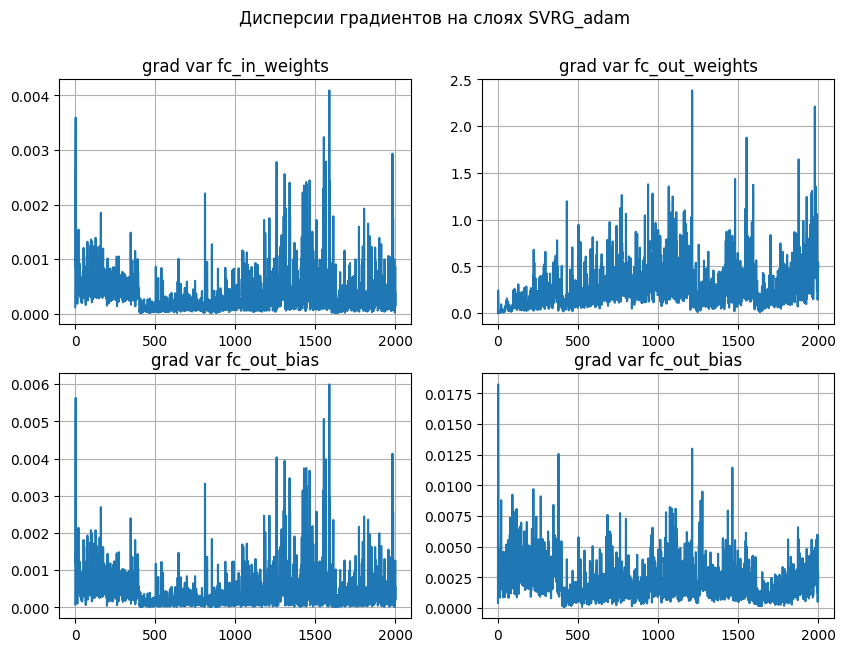

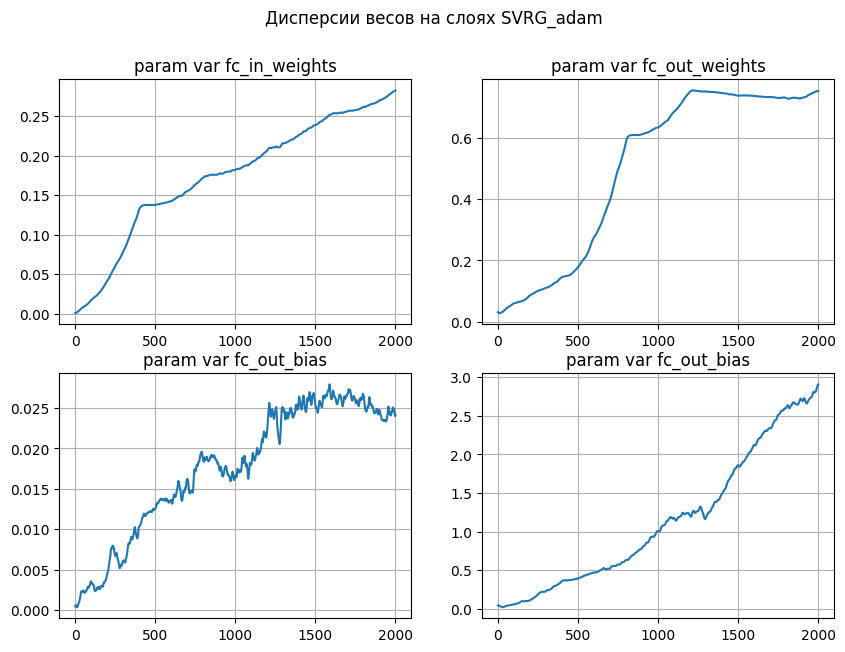

In [44]:
show_metrics(logger_adam.get_stats(), logger_adam.name)
show_grad_variances(logger_adam.get_stats(), logger_adam.name)
show_weight_variances(logger_adam.get_stats(), logger_adam.name)

Проверим улучшение ADAM `AdamW`

In [39]:
set_global_seed(42)

net = MnistClassifier(10)
loss_fn = loss_fn_constructor(model=net, device=device)

optimizer = optim.AdamW(net.parameters(), lr=1e-2)
optimizer_wrapper = SVRG(optimizer=optimizer, loss_fn=loss_fn, data=big_data, S=400)

train_dataloader = DataLoader(train_dataset, batch_size=24, shuffle=True, drop_last=True)
val_dataloader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

criterion_fn = nn.CrossEntropyLoss(reduction='mean')

In [ ]:
set_global_seed(666)

logger_adamw = CustomLogger('SVRG_adamw')

train(
    iters_num=2_000,
    net=net,
    optimizer_wrapper=optimizer_wrapper,
    criterion_fn=criterion_fn,
    train_dataloader=train_dataloader,
    valid_dataloader=val_dataloader,
    device=device,
    logger=logger_adamw,
    name="SVRG_adamw")

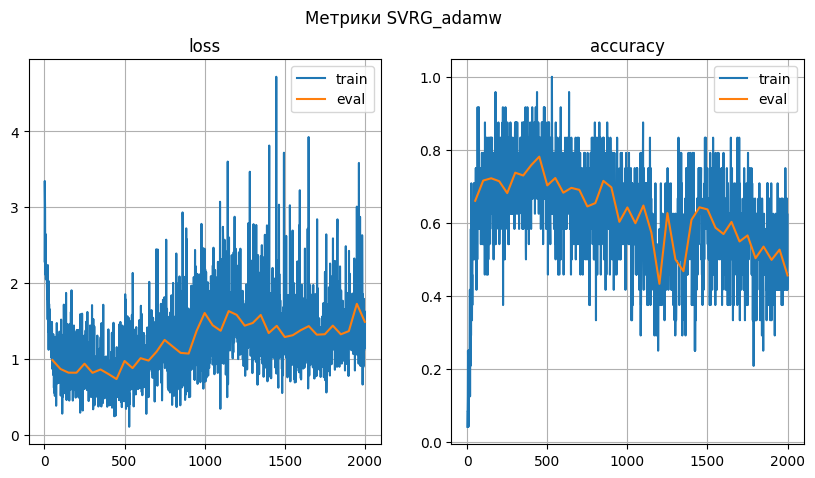

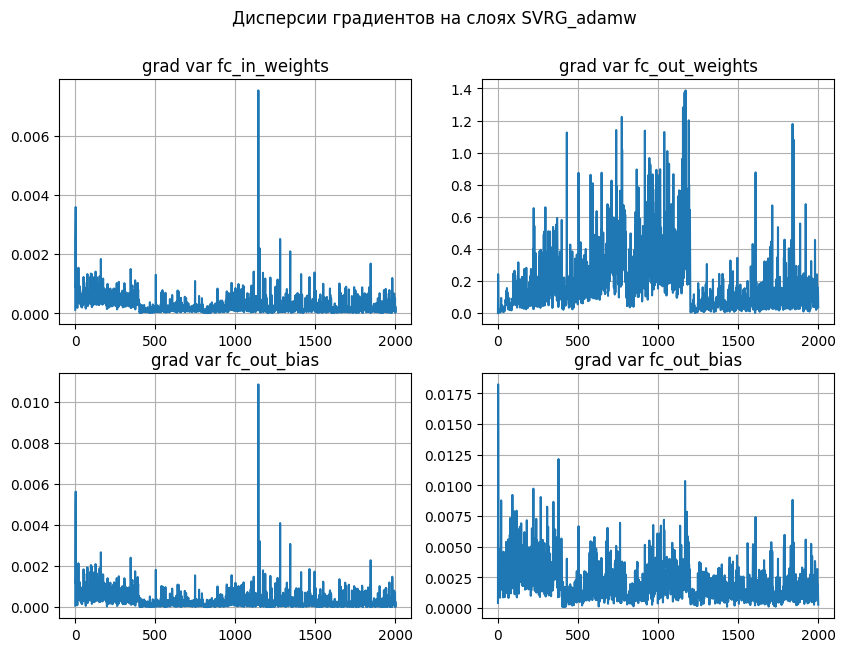

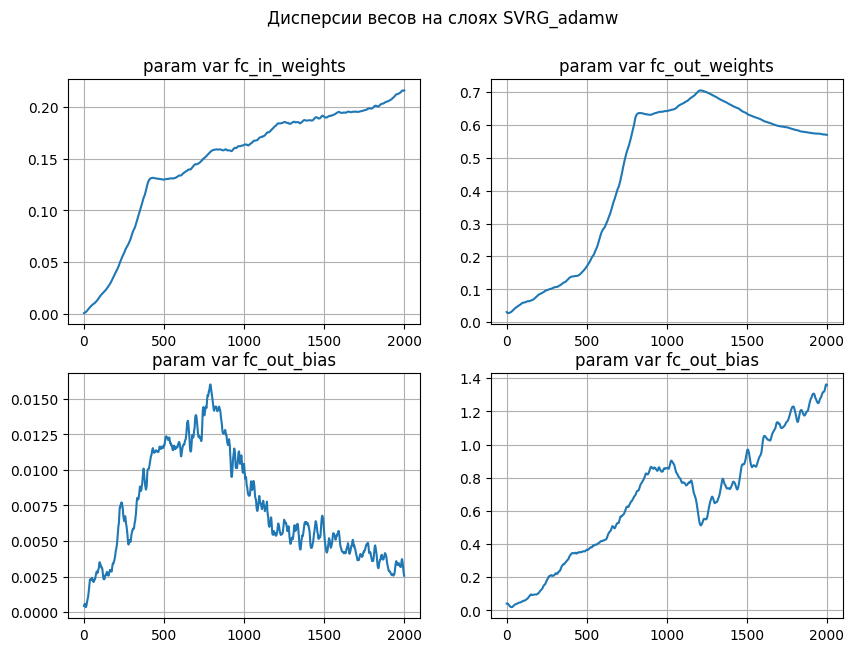

In [41]:
show_metrics(logger_adamw.get_stats(), logger_adamw.name)
show_grad_variances(logger_adamw.get_stats(), logger_adamw.name)
show_weight_variances(logger_adamw.get_stats(), logger_adamw.name)

Теперь посмотрим при таких же настройках более простой некешированный алгоритм `RMSprop`

In [50]:
set_global_seed(42)

net = MnistClassifier(10)
loss_fn = loss_fn_constructor(model=net, device=device)

optimizer = optim.RMSprop(net.parameters(), lr=1e-2)
optimizer_wrapper = SVRG(optimizer=optimizer, loss_fn=loss_fn, data=big_data, S=400)

train_dataloader = DataLoader(train_dataset, batch_size=24, shuffle=True, drop_last=True)
val_dataloader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

criterion_fn = nn.CrossEntropyLoss(reduction='mean')

In [ ]:
set_global_seed(666)

logger_rmsprop = CustomLogger('SVRG_rmsprop')

train(
    iters_num=2_000,
    net=net,
    optimizer_wrapper=optimizer_wrapper,
    criterion_fn=criterion_fn,
    train_dataloader=train_dataloader,
    valid_dataloader=val_dataloader,
    device=device,
    logger=logger_rmsprop,
    name="SVRG_rmsprop")

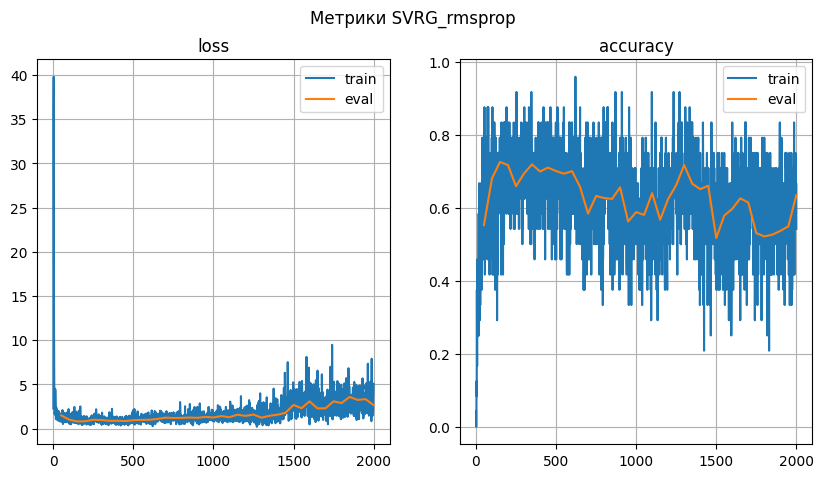

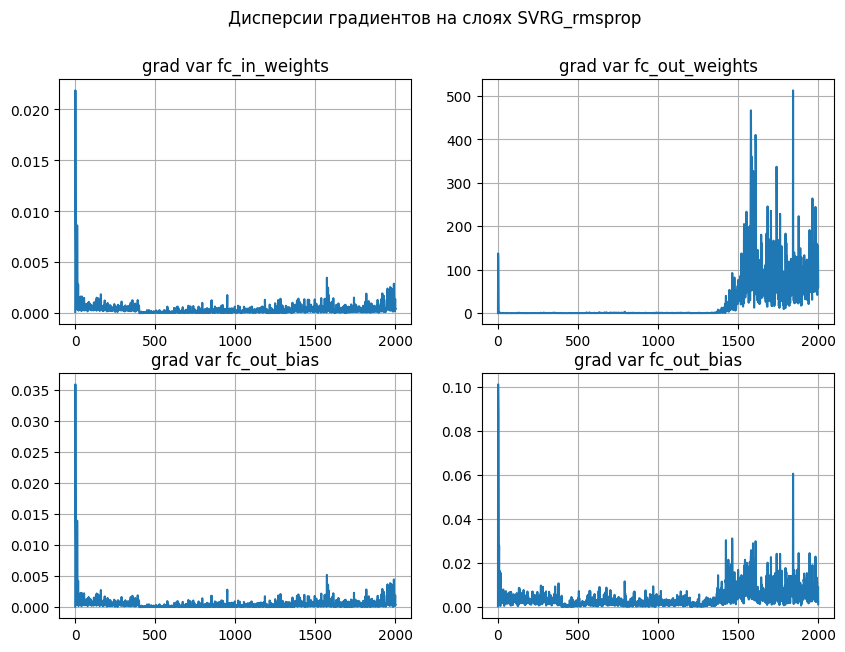

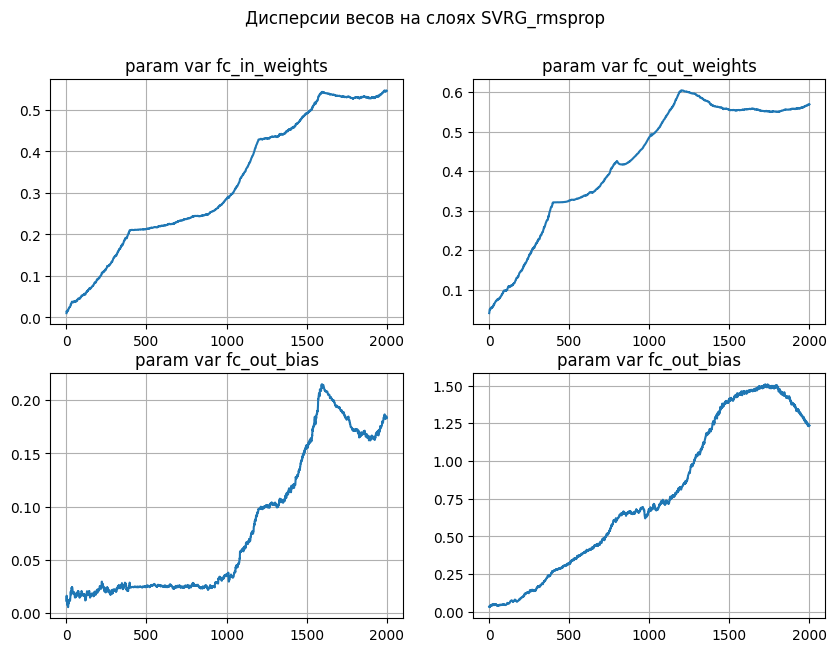

In [52]:
show_metrics(logger_rmsprop.get_stats(), logger_rmsprop.name)
show_grad_variances(logger_rmsprop.get_stats(), logger_rmsprop.name)
show_weight_variances(logger_rmsprop.get_stats(), logger_rmsprop.name)

**Выводы:** 
Было принято решение протестировать 4, с моей точки зрения, наиболее интересных алгоритма оптимизации для нейронных сетей:

1. SGD - как baseline, уже зарекомендовавший себя в процессе работы как очень надежный и приносящий хорошие результаты алгоритм, для которого SVRG и разрабатывался
2. Adam - как повсеместно используемый алгоритм
3. AdamW - как надстройка над классическим Adam
4. RMSProp - как некоторый простейший алгоритм вне тусовки сложных и всюду используемых

Как показали эксперименты, все алгоритмы кроме SGD не способны работать с SVRG, показывая катастрофически меньшие результаты, чем baseline флгоритм.Данные алгоритмы разделяют одни и те же признаки: огромная дисперсия весов сопровождаемая хаотическим ростом, резские всплески дисперсий градиентов, а так же случайные асциляции функций метрик качества. Все это свидетельствует о полной непригодности таких алгоритмов к работе с SVRG

Почему такое могло произойти? Ответ кроется в процедурах кэширования/запоминания направления сходимости у данных алгоритмов. Внутри них заложена процедура восстановления оценки градиента, а потому вмешательство извне только ломает их работу. К тому же SVRG изначально разрабатывался, как средство модернизации SGD. Видимо, после набора памяти (а этот момент вероятно и служит той итерацией, после которой алгоритмы начинают терять в качестве), изменение локальных всплесков и отклонений градиента из-за бачирования в нашем рукописном алгоритме сбивает методы оптимизации.

**Бонус 3 (1.25 баллов)**: Реализовать L-SVRG и сравнить результаты с SVRG и простым стохастическим градиентным спуском. Сравнить сходимость метода и основные показатели

**Бонус 4 (1.5 баллов)**: Реализовать метод [SAGA](https://www.di.ens.fr/~fbach/Defazio_NIPS2014.pdf) или любой другой метод понижения дисперсии (кроме батчирования). Описать идею метода. Сравнить сходимость метода и основные показатели

### Часть 4 (2.55 баллов). Методы Ньютона и LBFGS для пуассоновской регрессии.

В этой части задания вам предстоит обучить модель пуассоновской регрессии. Для этой задачи вы реализуете метод Ньютона и оракулы для Newton-CG и LBFGS.

###### Постановка задачи

Рассмотрим задачу количественной регресии (count regression). Пусть дана выборка $\{x_i,y_i\}_{i=1}^\ell$, где $x_i\in\mathbb{R}^d$, $y_i\in\mathbb{N}\cup\{0\}$.

Будем считать, что
$$
y\sim p(y\,|\,\lambda)={e^{-\lambda}\over y!}\lambda^{y},
$$
где $\lambda=\exp(w^Tx)$.

Как вы могли догадаться, мы имеем дело с обобщённой линейной моделью. Обучение производится методом максимизации правдоподобия:
$$
p(X\,|\,w)=\prod_{i=1}^\ell p(y_i\,|\,x_i,w)\to\max_w\iff \mathcal{L}(x,y,w)=-\log p(y\,|\,\exp(w^Tx)),\ Q=\sum_{i=1}^\ell\mathcal{L}(x_i,y_i,w)\to\min_w.
$$

Алгоритм предсказания пуассоновской регрессии:
$$
a(x)=\lfloor\exp(w^Tx)\rfloor.
$$

**Задание 1. (0.5 баллов)**. Выведите формулы градиента $\nabla_wQ$ и гессиана $\nabla^2_wQ$.

**Решение:**

Выведем градиент:
$$
    \nabla_w Q = \nabla_w \left ( \sum_{i=1}^\ell\mathcal{L}(x_i,y_i,w) \right ) \Longrightarrow 
    \nabla_w \mathcal{L}(x_i,y_i,w) =
    \nabla_w \left ( - \log(\frac{\lambda^y}{y!} e^{-w^Tx}) \right ) = 
    - \frac{y!}{\lambda^y} e^{w^Tx} \left ( \frac{y}{y!} \lambda^{y-1} e^{w^Tx} - \frac{\lambda^y}{y!} X e^{w^Tx} \right ) = 
    \left ( 1 - \frac{y}{\lambda} \right ) \lambda X = \left( \lambda - y \right ) X \\

    \nabla_w Q = \sum_{i=1}^\ell \left( \lambda_i - y_i \right ) X_i = \left( \lambda - y \right ) X 
$$

Выведем гессиан:

$$
    d_w (\lambda - y) X^T dw_1 = d_w \lambda X^T dw_1 = {dw_2}^T \lambda X X^T dw_1 = <\lambda X X^T dw_1, dw_2> 
    \Longrightarrow \nabla^2_w Q = \sum_{i=1}^\ell \lambda_i X_i X_i^T = ( \lambda \cdot X ) X^T
$$

**Задание 2 (0.8 баллов)**. Реализуйте полученные формулы в виде функции оракула.

In [87]:
import numpy as np

class Oracle:
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def fun(self, weights):
        """Compute objective, gradient, hessian"""
        scalar = self.X @ weights
        return np.sum(np.exp(scalar) - self.y * scalar)

    def jac(self, weights):
        """Compute gradient. Use it for LBFGS, Newton-CG, Newton."""
        return (np.exp(weights @ self.X.T) - self.y).T @ self.X


    def hess(self, weights):
        """Compute hessian. Use it for Newton."""
        lambda_ = np.exp(weights @ self.X.T)
        return (lambda_[:, None] * self.X).T @ self.X


    def hessp(self, weights, vector):
        """Compute `hessian-times-vector` product. Use it for Newton-CG"""
        return (np.exp(weights @ self.X.T)[:, None] * self.X).T @ self.X @ vector

In [88]:
# Вспомогатейльный класс, который будет логгировать процесс обучения
from time import perf_counter


class Logger:
    def __init__(self):
        self.w = []
        self.time = []

    def __call__(self, weights):
        self.w.append(weights)

        if hasattr(self, 'prev'):
            self.time.append(perf_counter() - self.prev)

        self.prev = perf_counter()

**Задание 3. (0 баллов)**. Протестируем алгоритм на синтетических данных

In [89]:
def cartesian_product(*arrays):
    """https://stackoverflow.com/a/11146645"""
    la = len(arrays)
    dtype = np.result_type(*arrays)
    arr = np.empty([len(a) for a in arrays] + [la], dtype=dtype)
    for i, a in enumerate(np.ix_(*arrays)):
        arr[...,i] = a
    return arr.reshape(-1, la)

Датасет будет состоять из точек, взятых по сетке на прямоугольнике [0,3] x [0,3]

In [90]:
n_points_root = 50

x = np.linspace(0, 3, n_points_root)
y = np.linspace(0, 3, n_points_root)

features = cartesian_product(x, y)
print(features.shape)

(2500, 2)


Зафиксируем золотое значение параметров:

In [91]:
w = np.array([0.7, -0.25])

Метки сгенерируем из пуассоновского распределения:

In [92]:
targets = np.random.poisson(np.exp(features @ w))
print(targets.shape)

(2500,)


Визуализируем выборку:

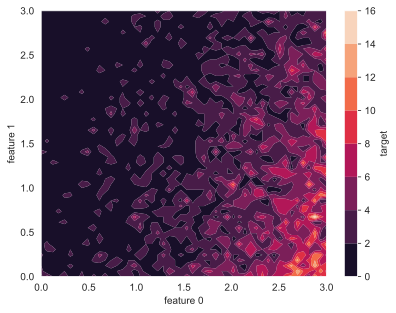

In [93]:
import matplotlib.pyplot as plt

def visualise(z):
    ax = plt.contourf(x, y, z.reshape(n_points_root, n_points_root).T)
    cbar = plt.colorbar(ax)
    cbar.ax.set_ylabel('target')
    plt.xlabel('feature 0')
    plt.ylabel('feature 1')
    plt.show()

visualise(targets)

Следующая ячейка должна выполняться без ошибок **(иначе -0.4 балла)**

In [96]:
from scipy.optimize import minimize

oracle = Oracle(features, targets)
cb = Logger()
weights = np.random.normal(size=2)
res = minimize(
    oracle.fun, weights,
    method="L-BFGS-B",
    jac=oracle.jac,
    callback=cb
)
res

  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -717.3766434041104
        x: [ 7.225e-01 -2.671e-01]
      nit: 9
      jac: [-1.007e-03 -7.036e-04]
     nfev: 13
     njev: 13
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>

Результат `res` должен содержать информацию об успешной оптимизации, а полученные веса должны быть похожи на те, что заданы выше:

In [97]:
print(res['x'])

[ 0.72249452 -0.26709261]


Визуализируйте предсказания:

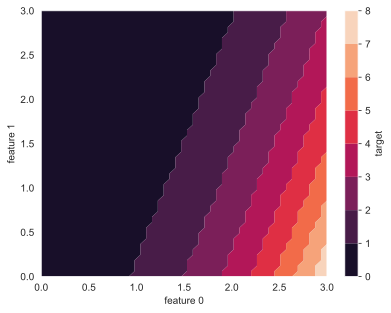

In [98]:
pred = np.floor(np.exp(features @ res['x']))

visualise(pred)

Следующая ячейка должна выполняться без ошибок и сообщать об успешной оптимизации **(иначе -0.4 балла)**:

In [100]:
oracle = Oracle(features, targets)
cb = Logger()
weights = np.random.normal(size=2)
res = minimize(
    oracle.fun, weights,
    method="Newton-CG",
    jac=oracle.jac,
    hessp=oracle.hessp,
    callback=cb,
)
res

 message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -717.3766434028373
       x: [ 7.225e-01 -2.671e-01]
     nit: 9
     jac: [ 2.590e-02  2.152e-02]
    nfev: 10
    njev: 10
    nhev: 12

In [101]:
print(res['x'])

[ 0.72249412 -0.26709196]


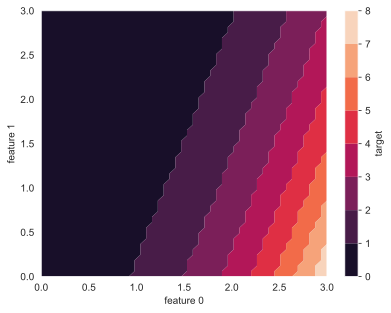

In [102]:
pred = np.floor(np.exp(features @ res['x']))

visualise(pred)

**Задание 4 (0.25 баллов)**. Реализуйте бектрекинг по правилу Армихо.

In [103]:
def line_search(f, grad, x, d, c=1e-4, rho=0.9, tol=1e-9, alpha0=1):
    """
    Line search for learning rate with Armijo condition.

    Params
    ------
    f: objective function
    grad: vector
    x: current solution of optimization problem
    d: direction along which to search
    alpha0: initialization for alpha

    Return
    ------
    alpha: lr for newton step
    """
    d_phi = grad @ d.T
    f0 = f(x)
    alpha = alpha0
    while f(x + alpha * d) > f0 + c * alpha * d_phi and alpha > tol:
        alpha = rho * alpha
    
    return alpha


**Задание 5. (0.25 баллов)**. Реализуйте демпфированный метод Ньютона. В качестве критерия останова используйте норму градиента (гиперпараметр `tol`).

*Замечание.* callback вызывать в конце каждой итерации.

In [104]:
from scipy.optimize import OptimizeResult


def Newton(fun, x0, *args, **kwargs) -> OptimizeResult:
    # helper functions
    callback = kwargs['callback']
    jac = kwargs['jac']
    hess = kwargs['hess']

    # hyper params
    max_iter = kwargs['max_iter']
    tol = kwargs['tol']
    alpha0 = kwargs['alpha0']

    prev_loss = 1e400
    x = x0
    for t in range(1, max_iter+1):
        grad = jac(x)
        hess_inv = np.linalg.inv(hess(x))
        d = grad @ hess_inv
        alpha = line_search(fun, grad, x, -d, alpha0=alpha0)
        x = x - alpha * grad
        loss = fun(x)
        
        if np.abs(prev_loss - loss) < tol:
            print('break on tol')
            break
        else:
            prev_loss = loss

    return OptimizeResult(
        fun = loss,                 # resulting loss value
        x = x,                      # optimal weights
        n_it = t,                   # number of iterations used
        success = (t != max_iter)   # flag of success
    )

Следующая ячейка должна выполняться без ошибок и сообщать об успешной оптимизации

In [105]:
oracle = Oracle(features, targets)
cb = Logger()
weights = np.random.normal(size=2)
weights = np.zeros((2, ))
res = minimize(
    oracle.fun, weights,
    method=Newton,
    jac=oracle.jac,
    hess=oracle.hess,
    callback=cb,
    options=dict(
        tol=0.01,
        max_iter=10000,
        alpha0=0.000001
    )
)
res

break on tol


 success: True
     fun: -716.2593495530316
       x: [ 7.101e-01 -2.484e-01]
    n_it: 764

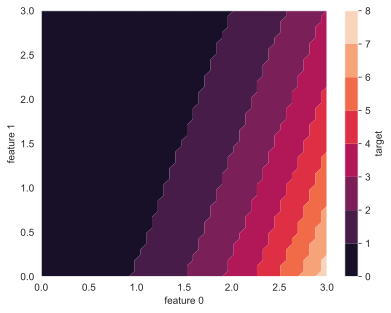

In [106]:
pred = np.floor(np.exp(features @ res['x']))

visualise(pred)

**Задание 6 (0.75 баллов)**. Применим методы к реальным данным

Применим наши три алгоритма к реальным данным. Источник данных: https://www.kaggle.com/datasets/pablomonleon/montreal-bike-lanes.

Описание к датасету:
> Is there a relationship between the number of bicyclists who use different bike paths on the same day? Can you predict how many riders there will be on one path given how many are on another?

In [107]:
import pandas as pd

df = pd.read_csv('dataset.csv')

target = df['target']
features = df.drop(columns=['target'])
print(features.shape, target.shape)
features.head()

(319, 18) (319,)


,lane_0,lane_1,lane_2,lane_3,lane_4,lane_5,lane_6,lane_7,lane_8,lane_9,lane_10,lane_11,lane_12,lane_13,lane_14,lane_15,month,day
0,12,4,17,49,21,16,16,7,58,91,24,3,17,78,21,6,1,1
1,7,5,15,113,27,9,32,11,109,177,32,13,11,57,77,4,2,1
2,7,3,7,107,36,12,18,2,71,131,33,5,14,174,40,5,3,1
3,1,21,0,35,29,1,0,0,6,11,6,1,1,20,6,0,4,1
4,0,2,0,90,21,1,1,6,0,5,49,20,0,41,56,10,5,1


Следующая ячейка кодирует временные признаки и нормирует все остальные:

In [108]:
# cycle encode time features
data = features[['month', 'day']].copy()
data['month_sin'] = np.sin(2 * np.pi * data['month']/31)
data['month_cos'] = np.cos(2 * np.pi * data['month']/31)

data['day_sin'] = np.sin(2 * np.pi * data['day']/12)
data['day_cos'] = np.cos(2 * np.pi * data['day']/12)

# normalize other features
data2 = features.drop(columns=['month', 'day'])
data2 = (data2 - data2.mean()) / data2.std()

# add constant feature
n_samples = df.shape[0]
features = pd.concat([data2, data[['month_sin', 'month_cos', 'day_sin', 'day_cos']]], axis=1)
features['constant'] = np.ones(n_samples)
features.head()

,lane_0,lane_1,lane_2,lane_3,lane_4,lane_5,lane_6,lane_7,lane_8,lane_9,...,lane_11,lane_12,lane_13,lane_14,lane_15,month_sin,month_cos,day_sin,day_cos,constant
0,-1.200839,-1.221582,-1.198296,-0.880348,-1.079269,-1.131425,-1.228446,-0.930486,-1.294226,-1.352611,...,-0.885145,-1.279551,-1.326210,-1.226873,-1.162284,0.201299,0.979530,0.5,0.866025,1.0
1,-1.203568,-1.221154,-1.200379,-0.854252,-1.072729,-1.138488,-1.217139,-0.927173,-1.263520,-1.311771,...,-0.841856,-1.285154,-1.341468,-1.192567,-1.170318,0.394356,0.918958,0.5,0.866025,1.0
2,-1.203568,-1.222010,-1.208713,-0.856698,-1.062920,-1.135461,-1.227033,-0.934626,-1.286399,-1.333616,...,-0.876487,-1.282353,-1.256462,-1.215233,-1.166301,0.571268,0.820763,0.5,0.866025,1.0
3,-1.206841,-1.214309,-1.216004,-0.886056,-1.070549,-1.146560,-1.239754,-0.936282,-1.325534,-1.390602,...,-0.893802,-1.294493,-1.368350,-1.236062,-1.186386,0.724793,0.688967,0.5,0.866025,1.0
4,-1.207387,-1.222437,-1.216004,-0.863630,-1.079269,-1.146560,-1.239047,-0.931314,-1.329146,-1.393451,...,-0.811554,-1.295427,-1.353092,-1.205432,-1.146217,0.848644,0.528964,0.5,0.866025,1.0


In [109]:
X = features.to_numpy()
y = target.to_numpy()

print(X.shape, y.shape)

(319, 21) (319,)


Разделите выборку случайно на трейн и тест в отношении 9:1, зафиксируйте `seed=0`. Обучите следующие алгоритмы и измерьте качество на отложенной выборке:

- LBFGS
- Newton-CG
- Newton
- `sklearn.linear_model.PoissonRegressor`

**Замечание.** Если для метода Ньютона раз в несколько запусков появляется ошибка `singular matrix`, то ничего страшного (наверное). Если метод часто расходится, то попробуйте поварьировать параметр `alpha0` или другие параметры бектрекинга.

**Подсказка.** Меряйте качество на отложенной выборке так: `np.mean((np.log(pred + 1) - np.log(y + 1)) ** 2)`.

**(!)** Для каждого алгоритма постройте scatterplot для пар (true, pred) на трейне и на тесте, который покажет, как плохи/хороши полученные предсказания.

**(!)** Сделайте выводы о полученных результатах. Насколько они согласуются с вашими ожиданиями?

In [110]:
np.random.seed(0)
inds = np.arange(len(X))
np.random.shuffle(inds)

X_train = X[inds[:int(0.9 * len(X))]]
X_test = X[inds[int(0.9 * len(X)):]]

y_train = y[inds[:int(0.9 * len(X))]]
y_test = y[inds[int(0.9 * len(X)):]]

In [111]:
def make_scatter(true_pred, preds_pred, true_test, preds_test, name):
    fig, axis = plt.subplots(1, 2)
    fig.set_figwidth(10)
    
    fig.suptitle(name)

    axis[0].set_title('train')
    axis[0].scatter(true_pred, preds_pred)
    axis[0].set_xlabel('preds')
    axis[0].set_ylabel('true')

    axis[1].set_title('test')
    axis[1].scatter(true_test, preds_test)
    axis[1].set_xlabel('preds')
    axis[1].set_ylabel('true')

In [112]:
def get_score(true, preds):
    return np.mean((np.log(preds + 1) - np.log(true + 1)) ** 2)

##### LBFGS

In [114]:
from scipy.optimize import minimize

oracle = Oracle(X_train, y_train)
cb = Logger()
weights = np.random.normal(size=X_train.shape[1])
res = minimize(
    oracle.fun, weights,
    method="L-BFGS-B",
    jac=oracle.jac,
    callback=cb
)
res

  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -5993352.618354254
        x: [-7.072e-01  1.635e+00 ... -4.448e-03  7.386e+00]
      nit: 136
      jac: [-4.283e+01 -4.105e+01 ...  3.318e+01 -4.443e+01]
     nfev: 157
     njev: 157
 hess_inv: <21x21 LbfgsInvHessProduct with dtype=float64>

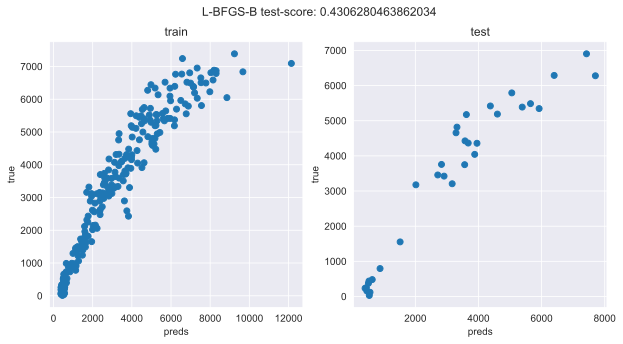

In [115]:
preds_train = np.floor(np.exp(res['x'] @ X_train.T))
preds_test = np.floor(np.exp(res['x'] @ X_test.T))
name = f'L-BFGS-B test-score: {get_score(y_test, preds_test)}'

make_scatter(preds_train, y_train, preds_test, y_test, name)

##### Newton-CG

In [117]:
oracle = Oracle(X_train, y_train)
cb = Logger()
weights = np.random.normal(size=X_train.shape[1])
res = minimize(
    oracle.fun, weights,
    method="Newton-CG",
    jac=oracle.jac,
    hessp=oracle.hessp,
    callback=cb,
)
res

 message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -5993352.988865562
       x: [-7.022e-01  1.640e+00 ... -4.392e-03  7.389e+00]
     nit: 29
     jac: [ 2.804e-02 -6.193e-03 ... -8.045e-04  2.599e-02]
    nfev: 45
    njev: 45
    nhev: 196

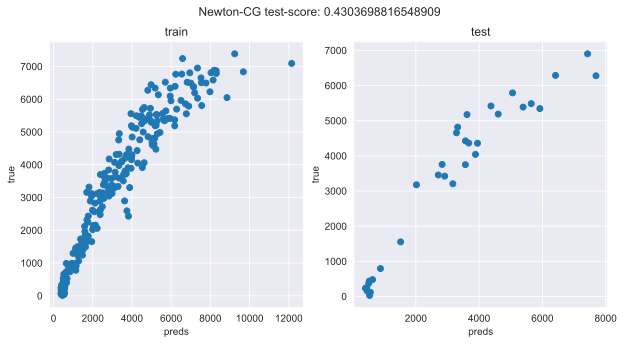

In [119]:
preds_train = np.floor(np.exp(res['x'] @ X_train.T))
preds_test = np.floor(np.exp(res['x'] @ X_test.T))
name = f'Newton-CG test-score: {get_score(y_test, preds_test)}'

make_scatter(preds_train, y_train, preds_test, y_test, name)

##### Demph-Newton

In [158]:
oracle = Oracle(X_train, y_train)
cb = Logger()
weights = np.random.normal(size=X_train.shape[1])
res = minimize(
    oracle.fun, weights,
    method=Newton,
    jac=oracle.jac,
    hess=oracle.hess,
    callback=cb,
    options=dict(
        tol=0.01,
        max_iter=10000,
        alpha0=0.0000001
    )
)
res

 success: False
     fun: -5993117.587839425
       x: [-4.683e-01  1.240e+00 ... -1.451e-03  7.404e+00]
    n_it: 10000

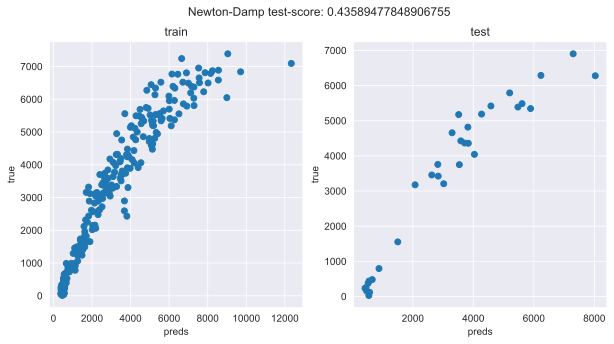

In [159]:
preds_train = np.floor(np.exp(res['x'] @ X_train.T))
preds_test = np.floor(np.exp(res['x'] @ X_test.T))
name = f'Newton-Damp test-score: {get_score(y_test, preds_test)}'

make_scatter(preds_train, y_train, preds_test, y_test, name)

##### Pois Regr

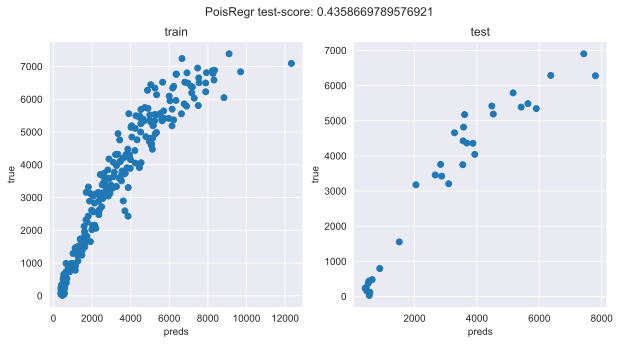

In [153]:
from sklearn.linear_model import PoissonRegressor

pois = PoissonRegressor(max_iter=5, solver='newton-cholesky')
pois.fit(X_train, y_train)
preds_train = pois.predict(X_train)
preds_test  = pois.predict(X_test)
name = f'PoisRegr test-score: {get_score(y_test, preds_test)}'

make_scatter(preds_train, y_train, preds_test, y_test, name)

**Выводы:** Мы получили хорошие результаты на каждом из алгоримтов, при чем они практически идентичны и зависят от случайного начального приближения. Тем не менее каждый алгоритм уникален, располагет разными требованиями по числу итераций, скорости сходимости и сложности настройки. Пойдем по порядку:

* Метод L-BFGS-B является одним из готовых алгоритмов оптимизации, среди которых требующий самое большое число итераций для сходимости. Однако при нем мы не требуем вычисление гессиана, а потому данное условие является логичным трейдофом скорости на память. 
* Метод Newton-CG спобоен крайне сильно сократить число итераций для сходимости в виду использования гессиана. Вместе с тем конечное качество с предыдущим методом практически ничем не отличается.
* Более интересен метод Дампфированного Ньютона, где нам не только потребовалось 10000 итераций, но и достаточно крапотливо подбирать показатели alpha, tol, c, q и так далее, чтобы алгоритм сходился. Однако он показывает немного лучшие результаты по сравнению с предыдущими алгоритмами. 
* Последним является алгоритм newton-cholesky, что показывает фантастические результаты, сходясь к устойчивому минимуму всего за 5 итераций!

Можно сказать, что результаты первых двух алгоритмов ожидаемы и скорее даже очевидны. Однако для двуз остальных методов появляются вопросы))
Самое первое удивление вызывает Дампфированный Ньютон. Все же я не так долго игрался с настройками, но само число итераций при условии того, что это метод 2 порядка меня как-то расстраивает. Относительно Newton-Cholesky метода я просто приятно удивлен. 

### Часть 5. (1.5 баллов) CVXPY

Для анализа изображений часто используется метод неотрицательной матричной факторизации ([Nonnegative matrix factorization](https://arxiv.org/pdf/1401.5226.pdf)).
Идея в том, чтобы решить следующую задачу

\begin{align*}
& \min_{W, H} \frac12 \|X - WH\|^2_F \\
\text{s.t. } & W \geq 0\\
& H \geq 0,
\end{align*}

где знак $\geq$ означает покомпонентное сравнение.
Также матрицы $W$ и $H$ малого ранга, то есть $W \in \mathbb{R}^{m \times k}$ и $H \in \mathbb{R}^{k \times n}$, где $k$ - параметр, который необходимо настраивать.
Чем больше $k$, тем точнее приближение, но и тем дольше будет решаться задача.
Матрица $X \in \mathbb{R}^{m \times n}$, где $m$ - это число фото в нашем наборе, а $n$ - это количество пикселей в каждой картинке, то есть каждая строка матрицы $X$ - это векторизованная картинка.

**Задание 0. (0.15 баллов)** Как можно интерпретировать факторы $W$ и $H$ и почему важна их покомпонентная неотрицательность?

**Ответ:** Перед нами стоит задача уменьшения объема данных, хранимых выборкой X. Соответсвенно, мы пытаемся найти базис в пространстве объектов X, линейная комбинация векторов которого способна достаточно хорошо приближать объекты из X. Таким образом матрица H отвечает за базис. а W за веса комбинаций, характеризующих каждый из объектов. Размерность же k - есть просто число базисных векторов (объектов), в находимом нами приближении.

Откуда берется неотрицательность? Заметим, что каждый пиксель теперь кодируется как сумма с неотрицательными коэффициентами при базисных векторах, а потому мы считаем, что приближения объектов есть векторы из замкнутых конусов, натянутого на базисные вектора нашего разложения. Неотрицательность компонент векторов H логична и исходит из семантики (изображения не кодируются отрицательными числами). В то же время неотрицательность W говорит о том, что изображения не могут отменять привнесения других. Тогда H содержит не просто общие и наиболее отличные лица + дельты различий, а содержат полноценные усреденения по людям в X

Такую задачу можно решать с помощью cvxpy, если воспользоваться идеей попеременной оптимизации (alternating optimization). Идея состоит в том, чтобы на чётных итерациях решить точно задачу относительно параметра $W$ при фиксированном параметре $H$, а на нечётных наоборот: использовать решение для $W$ с предыдущей итерации в качестве фиксированного параметра и найти решение задачи относительно $H$ и так далее до сходимости.
Сначала Вам нужно инициализировать матрицы $W$ и $H$ какими-нибудь матрицами с неотрицательными элементами.

Загрузим данные. Мы будем раскладывать изображения лиц. О таком подходе к анализу фотографий лиц вам рассказывали или расскажут в курсе ОиРИ, а тут вы просто реализуете этот метод

Shape of data = (400, 64, 64)


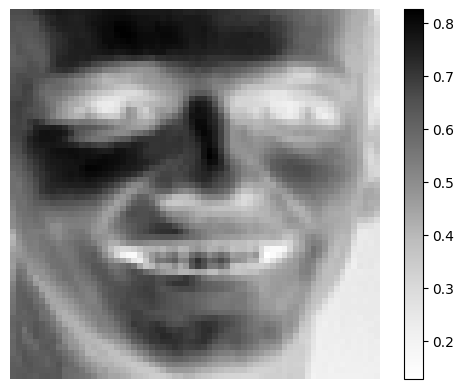

In [2]:
import cvxpy as cvx
import numpy as np
import sklearn.datasets as skldata
import matplotlib.pyplot as plt
import sklearn.decomposition as skdec
%matplotlib inline
data = skldata.fetch_olivetti_faces()
import numpy as np
print("Shape of data = {}".format(data["images"].shape))
index = 42
plt.imshow(data["images"][index], cmap=plt.cm.Greys)
plt.colorbar()
_ = plt.axis("off")

**Задание 1. (1.05 балл)** Реализуйте с помощью cvxpy идею попеременной оптимизации для этой задачи и решите её

*Совет от Соника:* Сперва тестируйте алгоритм не на всех данных, так как вычисления занимают большое количество времени

*Замечание*: все еще можно менять интерфейсы функций

In [3]:
def non_negative_matrix_factorization(X, rank, max_iters, tol, log=False):
    """
    X - матрица изображений. Каждое изображение является строкой
    rank - какой будете использовать ранг
    max_iters - максимальное количество итераций
    tol - точность, с какой решается задача
    log - флаг, отвечающий за то, будете ли вы печатать логи или нет (такое желание может возникнуть, так как
    алгоритм будет работать долго)
    Функция возвращает найденные матрицы H и W, а также значения функционала в ходе оптимизации
    """
    loss = []

    m = X.shape[0]
    k = rank
    n = X.shape[1]

    # init W and H
    np.random.seed(0)
    W = None
    H = np.abs(np.random.normal(size=(k, n)))
    
    prev_loss = 1e100

    for i in range(max_iters):
      # choose which to optimize
      if i % 2 == 0:
        W = cvx.Variable(shape=(m, k))
        constraint = [W >= 0]
      else:
        H = cvx.Variable(shape=(k, n))
        constraint = [H >= 0]

      target  = cvx.Minimize(cvx.norm(X - W @ H, p='fro'))
      problem = cvx.Problem(target, constraint)
      problem.solve(solver=cvx.SCS, max_iters=500)

      loss.append(problem.value)
      if log:
        print(f'iteration {i:3} for {"W" if i % 2 == 0 else "H"}: {problem.value}')
        
      if np.abs(prev_loss - problem.value) < tol:
        print('break on tol')
        break
      else:
        prev_loss = problem.value

      if i % 2 == 0:
        W = W.value
      else:
        H = H.value

    return H, W, loss

In [19]:
X = data['images'].reshape(data['images'].shape[0], -1)

H, W, hist = non_negative_matrix_factorization(X, 64, 50, 1, log=True)
np.save('H', H)
np.save('W', W)
np.save('hist', hist)

iteration   0 for W: 213.62888603334227
iteration   1 for H: 110.93549650886094
iteration   2 for W: 84.55514483948441
iteration   3 for H: 77.13748911196441
iteration   4 for W: 73.14639230836254
iteration   5 for H: 71.16409897987779
iteration   6 for W: 69.72329067566965
iteration   7 for H: 68.76631389588925
iteration   8 for W: 67.98250946776425
iteration   9 for H: 67.3957264233355
iteration  10 for W: 66.88457254859158
iteration  11 for H: 66.47378180357138
iteration  12 for W: 66.10111527333595
iteration  13 for H: 65.7890774570631
iteration  14 for W: 65.50025064107548
iteration  15 for H: 65.25518157212592
iteration  16 for W: 65.02775780810816
iteration  17 for H: 64.83377201228218
iteration  18 for W: 64.65364756836559
iteration  19 for H: 64.49792797195168
iteration  20 for W: 64.35228805132556
iteration  21 for H: 64.2251371844648
iteration  22 for W: 64.10609005476739
iteration  23 for H: 64.00116074590309
iteration  24 for W: 63.90223651067366
iteration  25 for H: 63.81

**Задание 2. (0.1 балл)** Нарисуйте график сходимости по функции и убедитесь, что метод сошёлся или же изменение целевой функции пренебрежимо мало

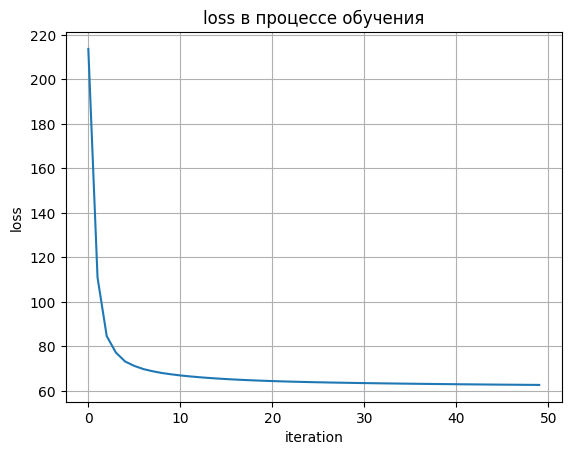

In [6]:
hist = np.load('hist.npy')
plt.plot(np.arange(len(hist)), hist)
plt.grid(True)
plt.title('loss в процессе обучения')
plt.ylabel('loss')
plt.xlabel('iteration')
plt.show()

Объективно алгоритм достаточно быстро сходился и к последним итерациям практически полностью пришел в точку оптимума

**Задание 3. (0.1 баллов)** Поскольку размерность $H$ - $k \times n$, то каждую строку $H$ можно преобразовать в картинку аналогично тому, как были собраны строки матрицы $X$. Нарисуйте 10 картинок полученных из строк матрицы $H$. Что Вы заметили и как это соотносится с ответами на вопрос задания 0?

*Hint:* Используйте ```plt.colorbar()``` и цветовую схему ```plt.cm.Greys``` для более чёткого отображения значений пикселей

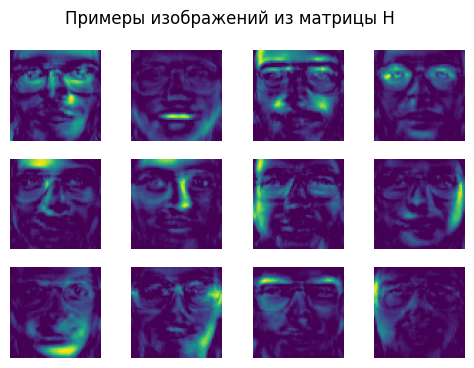

In [42]:
H = np.load('H.npy')
ind = np.arange(H.shape[0])
np.random.seed(666)     # адский сатана
np.random.shuffle(ind)

# make figure for 12 imgs
fig, axis = plt.subplots(3, 4)
fig.set_figwidth(6)
fig.set_figheight(4)
fig.suptitle('Примеры изображений из матрицы H')

for i, k in enumerate(ind[:12]):
    canv = H[k, :].reshape(64, 64)
    axis[i // 4][i % 4].imshow(canv)
    axis[i // 4][i % 4].axis("off")

*Специально не выбрана plt.cm.Greys палитра, так как дефолтной лучше видно*

Видно, что в матрице H содержатся лица! При чем видно, что каждое ищ лиц отлично друг от друга по зарактерным признакам (например по положению глаз, очков, рта и так далее). Это полностью соотносится с изначальными предполжениями, что H содержит наиболее отличные друг от друга усреднения лиц, комбинация которых дает любое из X

**Задание 4. (0.1 баллов)** Нарисуйте матрицу $W$ с помощью функции `plt.imshow` (или `plt.spy`). Насколько сильно она заполнена и почему?

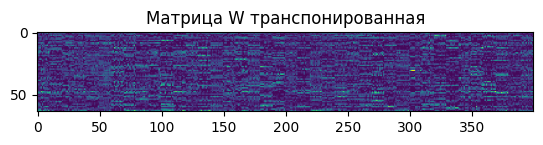

In [40]:
W = np.load('W.npy')
plt.title('Матрица W транспонированная')
plt.imshow(W.T)

Видно, что матрица сильно разрежена, и почти всюду имеет значения либо ноль, либо около нуля. Особенно интересен тот факт, что в каждой вретикали есть несколько именно больших значений и несколько малых. Это говорит о том, что на самом деле в каждом лице из X преобладают одна или несколько наиболее ярких черт, что запечтлены в соответсвующих базисных векторах из H, а все остальные лишь достраивают лицо. 

### Бонус

**Задание. (0.7 баллов)** Пробудите в себе внутреннего мемодела и придумайте мемный шедевр на тему ваших взаимоотношений с методами оптимизации.

**Ваш мем:**

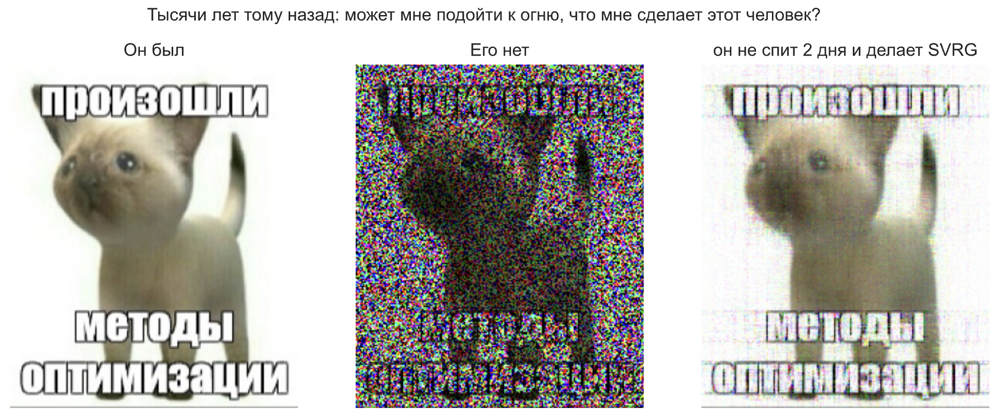

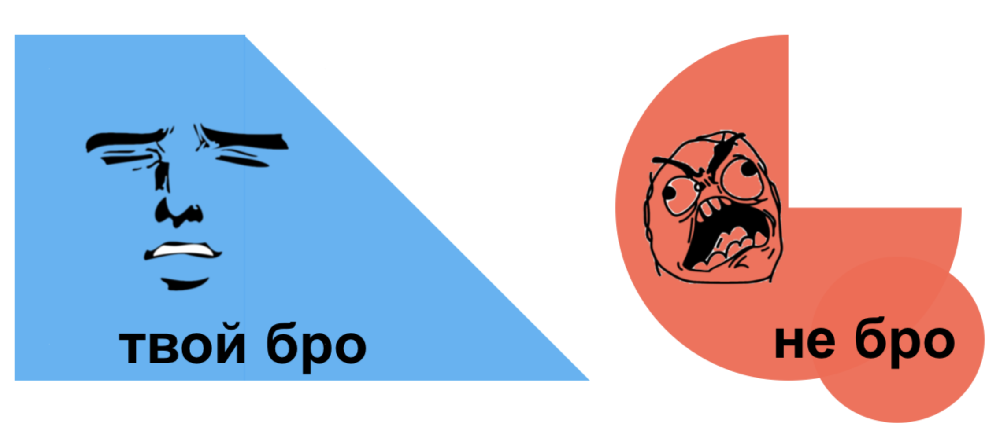